In [1]:
# Run this cell to mount your Google Drive.

from IPython.display import clear_output, Image
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


# Imports

In [2]:
# !pip install rlcard
!pip install rlcard[torch]
!pip install rlcard[tensorflow]

clear_output()

In [3]:
import torch
import numpy as np
import tensorflow
import os
import importlib

# path
pth = '/content/drive/MyDrive/Colab Notebooks/Thesis'

%cd /content/drive/My Drive/Colab Notebooks/Thesis/SupervisedLearning

from MLP import *
from models import *

# remove pycache
%cd /content/drive/My Drive/Colab Notebooks/Thesis/dqn/rlcard/agents/
%rm -r __pycache__
%cd /content/drive/My Drive/Colab Notebooks/Thesis/dqn/rlcard/envs/
%rm -r __pycache__
%cd /content/drive/My Drive/Colab Notebooks/Thesis/dqn/rlcard/games/
%rm -r __pycache__
%cd /content/drive/My Drive/Colab Notebooks/Thesis/dqn/rlcard/utils/
%rm -r __pycache__
%cd /content/drive/My Drive/Colab Notebooks/Thesis/dqn/rlcard/
%rm -r __pycache__

%cd /content/drive/My Drive/Colab Notebooks/Thesis/dqn

try:
    importlib.reload(rlcard)
    importlib.reload(rlcard.utils)
    importlib.reload(rlcard.agents.random_agent)
    importlib.reload(rlcard.agents.dqn_agent_pytorch)
    importlib.reload(rlcard.agents.simpleGinRummy_agent)
    importlib.reload(rlcard.games.gin_rummy.utils.scorers)
except:
    pass

import rlcard
from rlcard.utils import set_global_seed, tournament, tournament2, tournament3
from rlcard.utils import Logger
from rlcard.agents.random_agent import RandomAgent
from rlcard.agents.dqn_agent_pytorch import DQNAgent
from rlcard.agents.simpleGinRummy_agent import SimpleGinRummyAgent

# different versions of payoff functions
from rlcard.games.gin_rummy.utils.scorers import *

%cd /content/drive/My Drive/Colab Notebooks/Thesis

clear_output()

In [4]:
def load_checkpoint(checkpoint, agent=None):
    # load DQN pretrained weights using built in load function
    if isDQN:
        agent.load(checkpoint)
        agent2.load(checkpoint)
    else:
        model_dict = checkpoint.state_dict()
        # Generate pretrained dictionary of weights/biases
        pretrained_dict = {}

        # check if there is batch norm layer
        if batch_norm:
            b_layer = 1 
            pretrained_dict['fc_layers.1.weight'] = agent.q_estimator.qnet.fc_layers[1].weight
            pretrained_dict['fc_layers.1.bias'] = agent.q_estimator.qnet.fc_layers[1].bias
            pretrained_dict['fc_layers.1.running_mean'] = agent.q_estimator.qnet.fc_layers[1].running_mean
            pretrained_dict['fc_layers.1.running_var'] = agent.q_estimator.qnet.fc_layers[1].running_var
            pretrained_dict['fc_layers.1.num_batches_tracked'] = agent.q_estimator.qnet.fc_layers[1].num_batches_tracked
        else:
            b_layer = 0
        curr_layer = b_layer + 1
        for i in range(len(mlp_layers)):
            pretrained_dict['fc_layers.{}.weight'.format(curr_layer)] = model_dict['l{}.weight'.format(i+1)]
            pretrained_dict['fc_layers.{}.bias'.format(curr_layer)] = model_dict['l{}.bias'.format(i+1)]
            curr_layer += 2
        # check if there is a top_layer
        if top_layer:
            # check if copy top layer weights
            if copy_top:
                pretrained_dict['fc_layers.{}.weight'.format(curr_layer)] = torch.tensor(np.eye(110), device=device)
                pretrained_dict['fc_layers.{}.bias'.format(curr_layer)] = torch.tensor(np.zeros(110), device=device)
            else:
                pretrained_dict['fc_layers.{}.weight'.format(curr_layer)] = agent.target_estimator.qnet.fc_layers[curr_layer].weight
                pretrained_dict['fc_layers.{}.bias'.format(curr_layer)] = agent.target_estimator.qnet.fc_layers[curr_layer].bias
            curr_layer += 2

        # check if extra layer for knocking
        if knock_layer:
            pretrained_dict['fc_layers.{}.weight'.format(curr_layer)] = torch.tensor(np.eye(110), device=device)
            knock_probs = np.ones(110)*knock_val
            knock_probs[0:58] = 0
            pretrained_dict['fc_layers.{}.bias'.format(curr_layer)] = torch.tensor(knock_probs, device=device)
        
        # load pretrained weights
        agent.q_estimator.qnet.load_state_dict(pretrained_dict)
        agent.target_estimator.qnet.load_state_dict(pretrained_dict)
    
    # check if freeze layers (DO NOT FREEZE TOP LAYER)
    curr_layer = 1
    if freeze_layers:
        if batch_norm:
            agent.q_estimator.qnet.fc_layers[1].weight.requires_grad = False
            agent.q_estimator.qnet.fc_layers[1].bias.requires_grad = False
            agent.target_estimator.qnet.fc_layers[1].weight.requires_grad = False
            agent.target_estimator.qnet.fc_layers[1].bias.requires_grad = False
        curr_layer += b_layer
        for i in range(len(mlp_layers)):
            agent.q_estimator.qnet.fc_layers[curr_layer].weight.requires_grad = False
            agent.q_estimator.qnet.fc_layers[curr_layer].bias.requires_grad = False
            agent.target_estimator.qnet.fc_layers[curr_layer].weight.requires_grad = False
            agent.target_estimator.qnet.fc_layers[curr_layer].bias.requires_grad = False
            curr_layer += 2
        if top_layer:
            # there is additional top layer, do not freeze 
            pass
        else:
            # no additional top layer, unfreeze top layer 
            curr_layer -= 2
        # unfreeze top layers
        agent.q_estimator.qnet.fc_layers[curr_layer].weight.requires_grad = True
        agent.q_estimator.qnet.fc_layers[curr_layer].bias.requires_grad = True
        agent.target_estimator.qnet.fc_layers[curr_layer].weight.requires_grad = True
        agent.target_estimator.qnet.fc_layers[curr_layer].bias.requires_grad = True
        curr_layer += 2
        # check if extra layer for knocking
        if knock_layer:
            agent.q_estimator.qnet.fc_layers[curr_layer].weight.requires_grad = False
            agent.q_estimator.qnet.fc_layers[curr_layer].bias.requires_grad = False
            agent.target_estimator.qnet.fc_layers[curr_layer].weight.requires_grad = False
            agent.target_estimator.qnet.fc_layers[curr_layer].bias.requires_grad = False

# Final

In [5]:
dir = 'final'    # root directory name for group of models

## baseline

### Parameters

In [ ]:
# Pretrain model selection
state = 'all'
action = 'all'
dqn_model_name = 'baseline'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 520]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 5000  # mahjong_dqn has 100000
episode_num = 20000  # mahjong_dqn has 100000

# learning rate
learning_rate = 5e-5
# learning_rate = 0.00001 # 1e-5

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
# default: 100
memory_init_size = 1000

# default: 32
batch_size = 64
# batch_size = 1024

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 10

# enable top layer, copy top layer weights, freeze_layers
top_layer = True
copy_top = False
freeze_layers = False
# freeze_layers = True

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = False
knock_val = 0.002

# environment configs
# payoff_fnc = get_payoff_gin_rummy_v8
# cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
# cfg = {'seed': 0, 'is_always_knock': True}
cfg = {'seed': 0}

### Environment Initialization

In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, SGRAgent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
logger_self = Logger(log_dir, env='self_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False


### Train

#### Training Loop

In [ ]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        # print('\nSelfplay:')
        # rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        # reward_self = rewards[0]
        # logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        # if reward_self > max_reward_self:
        #     max_reward_self = reward_self
        #     state_dict = agent.get_state_dict() 
        #     torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        # Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        # if Cond_Knock > max_knock_self:
            # max_knock_self = Cond_Knock
            # state_dict = agent.get_state_dict() 
            # torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
# logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
# logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

clear_output()

#### Training Plots

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

###### Random

In [ ]:
# _, actions = tournament3(random_env, evaluate_num)
# clear_output()
# print(actions)

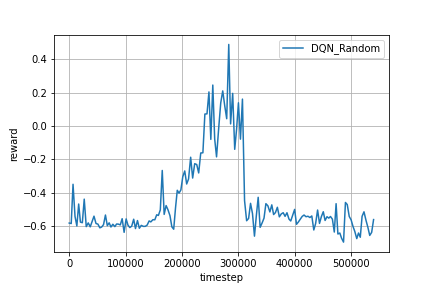

In [ ]:
Image(log_dir + '/rand_fig.png')

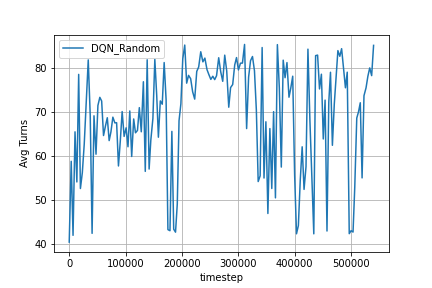

In [ ]:
Image(log_dir + '/rand_fig2.png')

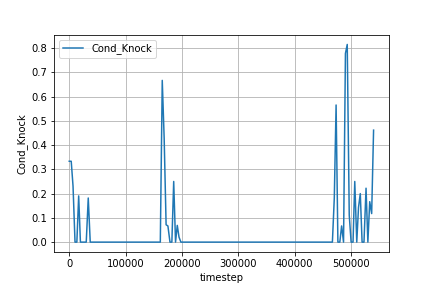

In [ ]:
Image(log_dir + '/rand_fig3.png')

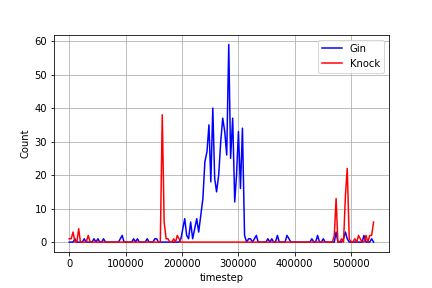

In [ ]:
Image(log_dir + '/rand_fig4.png')

###### SGRAgent

In [ ]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 0, 'Other': 100, 'Knock_Possible': 3, 'Avg Turns': 18.02}


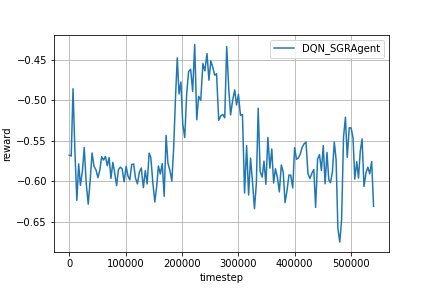

In [ ]:
Image(log_dir + '/sgr_fig.png')

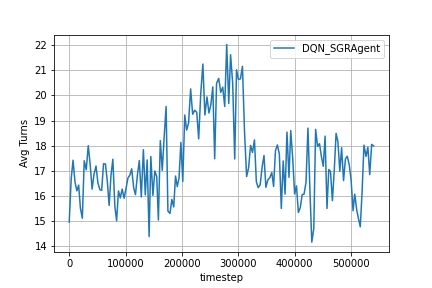

In [ ]:
Image(log_dir + '/sgr_fig2.png')

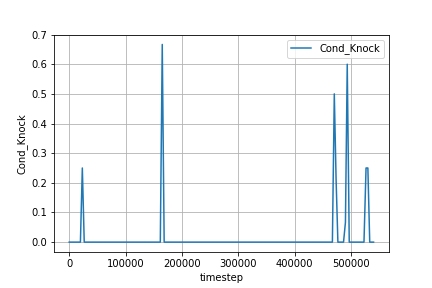

In [ ]:
Image(log_dir + '/sgr_fig3.png')

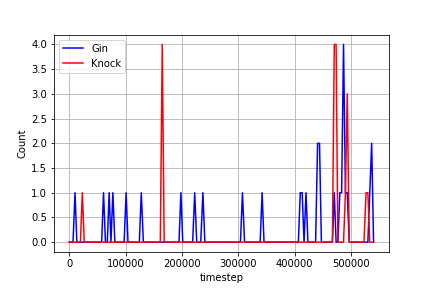

In [ ]:
Image(log_dir + '/sgr_fig4.png')

## baseline 1HL

### Parameters

In [ ]:
# Pretrain model selection
state = 'all'
action = 'all'
dqn_model_name = 'baseline_1HL'
model_name = '{}/models/{}/{}/all_states_all_actions/model.pt'.format(pth,state,action)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 110]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 5000  # mahjong_dqn has 100000
episode_num = 20000  # mahjong_dqn has 100000

# learning rate
learning_rate = 5e-5
# learning_rate = 0.00001 # 1e-5

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
# default: 100
memory_init_size = 1000

# default: 32
batch_size = 64
# batch_size = 1024

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 10

# enable top layer, copy top layer weights, freeze_layers
top_layer = False
copy_top = False
freeze_layers = False

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = False
knock_val = 0.002

# environment configs
# payoff_fnc = get_payoff_gin_rummy_v8
# cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
# cfg = {'seed': 0, 'is_always_knock': True}
cfg = {'seed': 0}

### Environment Initialization

In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, SGRAgent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
logger_self = Logger(log_dir, env='self_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False


### Load Pretrained Weights

In [ ]:
checkpoint = torch.load(model_name, map_location=device)
load_checkpoint(checkpoint, agent=agent)

### Train

#### Training Loop

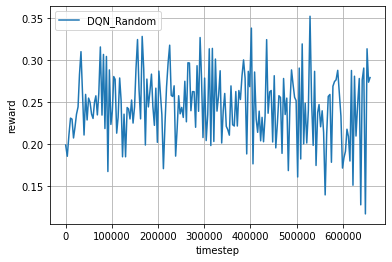

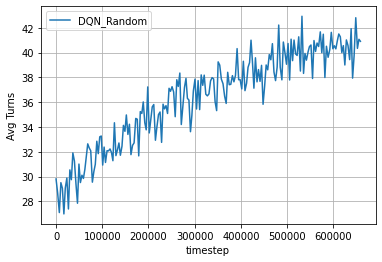

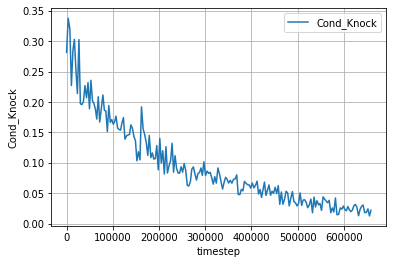

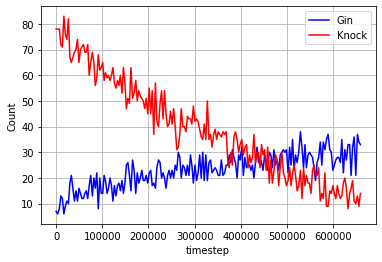

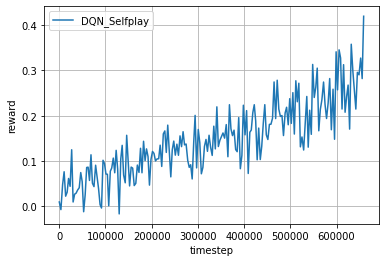

...

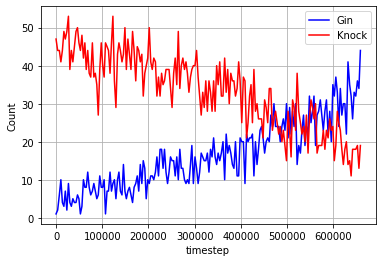

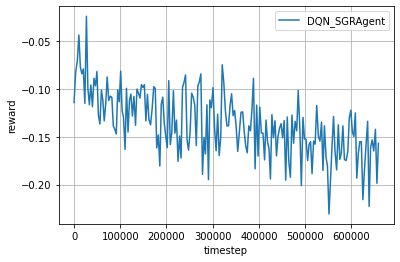

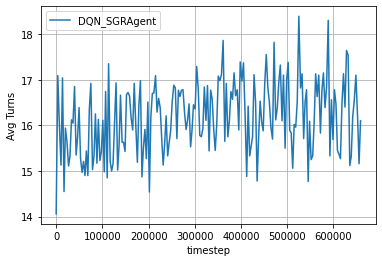

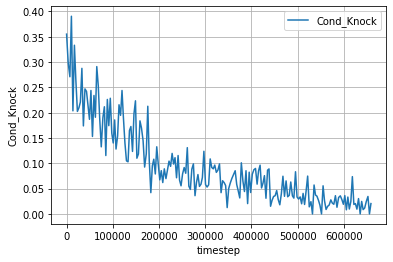

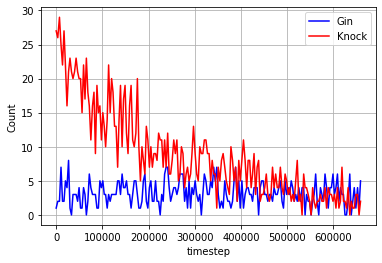

In [ ]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        print('\nSelfplay:')
        rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        reward_self = rewards[0]
        logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        if reward_self > max_reward_self:
            max_reward_self = reward_self
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_self:
            max_knock_self = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

clear_output()

#### Training Plots

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

###### Random

In [ ]:
_, actions = tournament3(random_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 32, 'Knock': 8, 'Other': 60, 'Knock_Possible': 592, 'Avg Turns': 41.47}


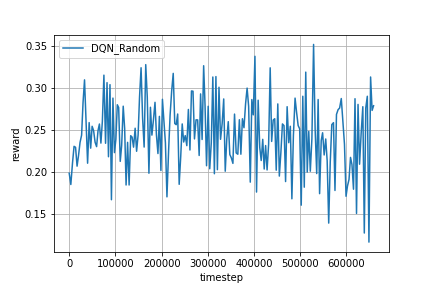

In [ ]:
Image(log_dir + '/rand_fig.png')

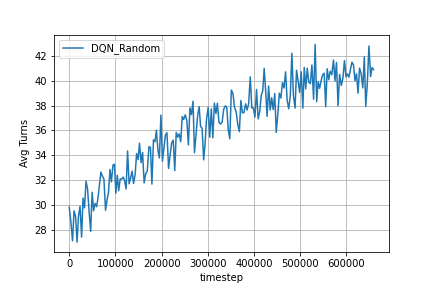

In [ ]:
Image(log_dir + '/rand_fig2.png')

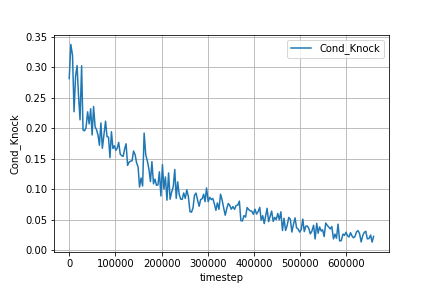

In [ ]:
Image(log_dir + '/rand_fig3.png')

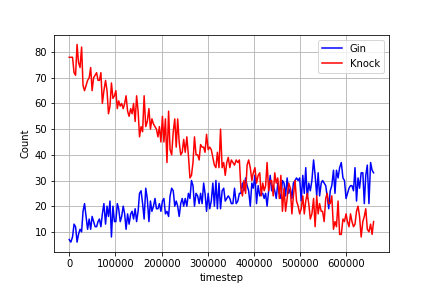

In [ ]:
Image(log_dir + '/rand_fig4.png')

###### Selfplay

In [ ]:
_, actions = tournament3(selfplay_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 32, 'Knock': 15, 'Other': 53, 'Knock_Possible': 381, 'Avg Turns': 28.38}


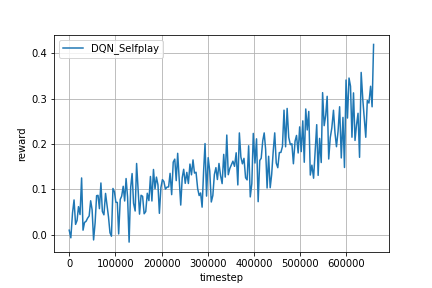

In [ ]:
Image(log_dir + '/self_fig.png')

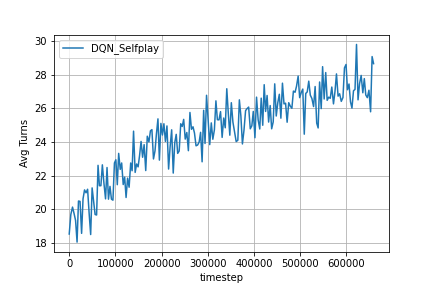

In [ ]:
Image(log_dir + '/self_fig2.png')

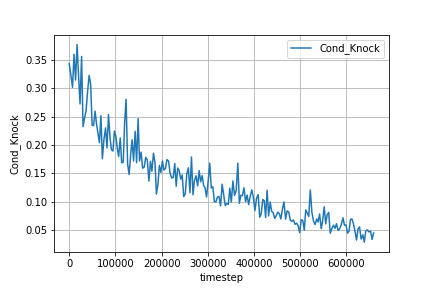

In [ ]:
Image(log_dir + '/self_fig3.png')

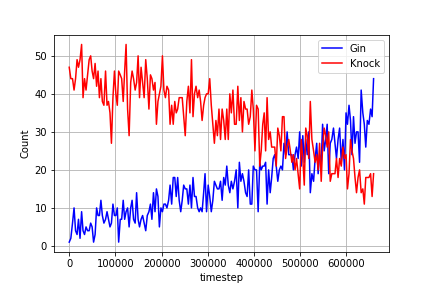

In [ ]:
Image(log_dir + '/self_fig4.png')

###### SGRAgent

In [ ]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 1, 'Knock': 2, 'Other': 97, 'Knock_Possible': 94, 'Avg Turns': 16.56}


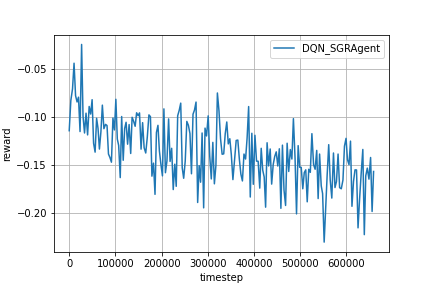

In [ ]:
Image(log_dir + '/sgr_fig.png')

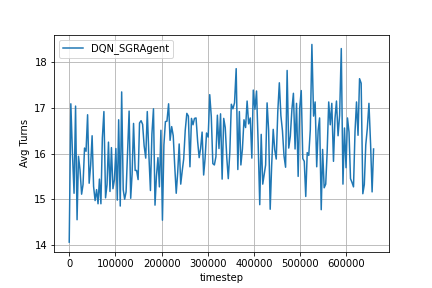

In [ ]:
Image(log_dir + '/sgr_fig2.png')

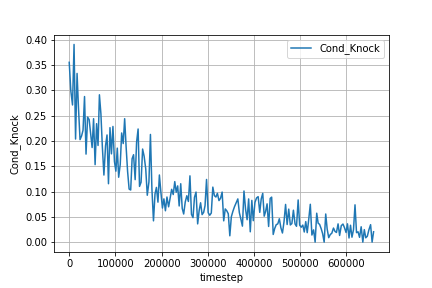

In [ ]:
Image(log_dir + '/sgr_fig3.png')

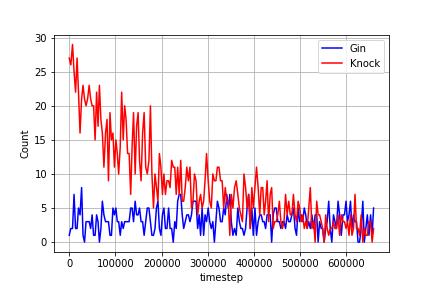

In [ ]:
Image(log_dir + '/sgr_fig4.png')

## baseline 2HL 40K

### Parameters

In [ ]:
# Pretrain model selection
state = 'all'
action = 'all'
dqn_model_name = 'baseline_2HL_40k'
model_name = '{}/models/{}/{}/all_states_all_actions_2hl_extra_knock_data_40K/model.pt'.format(pth,state,action)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 520, 110]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 5000  # mahjong_dqn has 100000
episode_num = 20000  # mahjong_dqn has 100000

# learning rate
learning_rate = 5e-5
# learning_rate = 0.00001 # 1e-5

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
# default: 100
memory_init_size = 1000

# default: 32
batch_size = 64
# batch_size = 1024

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 10

# enable top layer, copy top layer weights, freeze_layers
top_layer = False
copy_top = False
freeze_layers = False

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = False
knock_val = 0.002

# environment configs
# payoff_fnc = get_payoff_gin_rummy_v8
# cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
# cfg = {'seed': 0, 'is_always_knock': True}
cfg = {'seed': 0}

### Environment Initialization

In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, SGRAgent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
logger_self = Logger(log_dir, env='self_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False


### Load Pretrained Weights

In [ ]:
checkpoint = torch.load(model_name, map_location=device)
load_checkpoint(checkpoint, agent=agent)

### Train

#### Training Loop

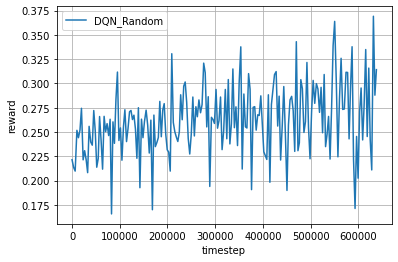

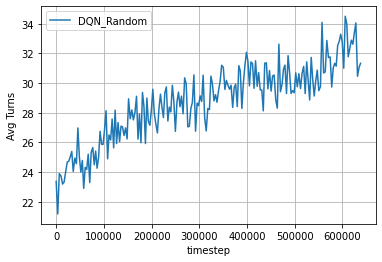

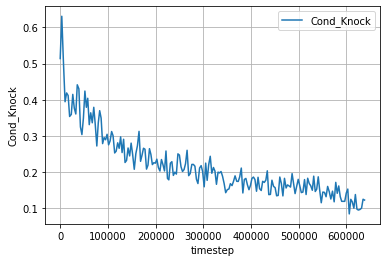

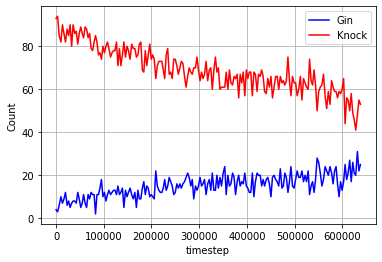

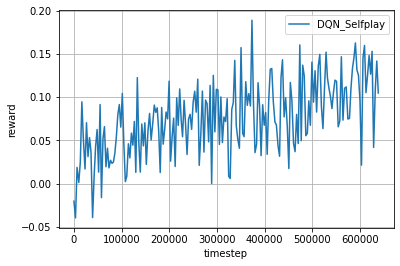

...

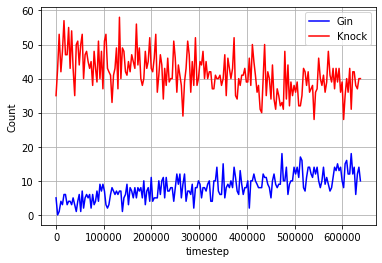

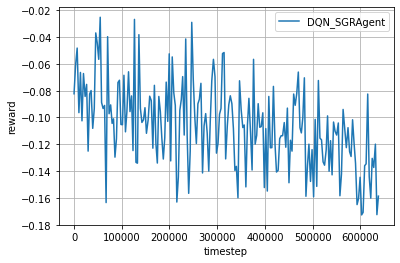

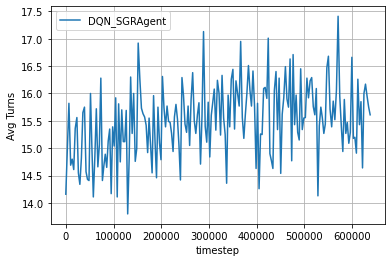

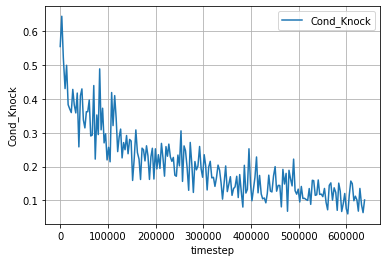

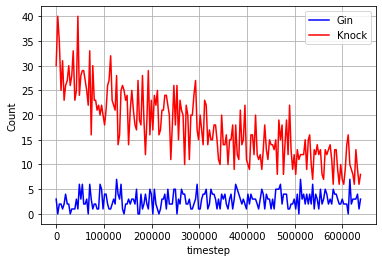

In [ ]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        print('\nSelfplay:')
        rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        reward_self = rewards[0]
        logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        if reward_self > max_reward_self:
            max_reward_self = reward_self
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_self:
            max_knock_self = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

clear_output()

#### Training Plots

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

###### Random

In [ ]:
_, actions = tournament3(random_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 16, 'Knock': 59, 'Other': 25, 'Knock_Possible': 447, 'Avg Turns': 32.47}


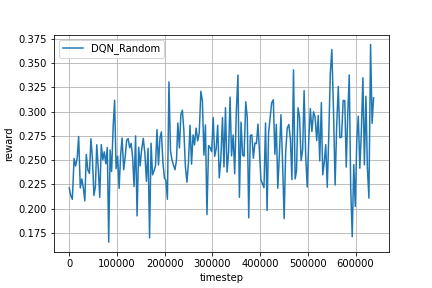

In [ ]:
Image(log_dir + '/rand_fig.png')

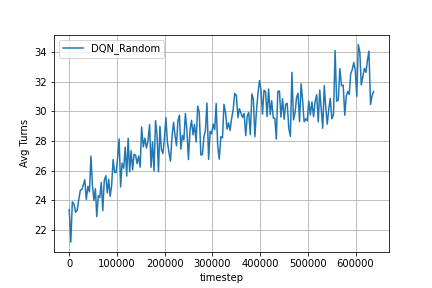

In [ ]:
Image(log_dir + '/rand_fig2.png')

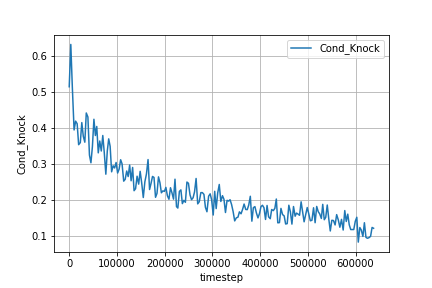

In [ ]:
Image(log_dir + '/rand_fig3.png')

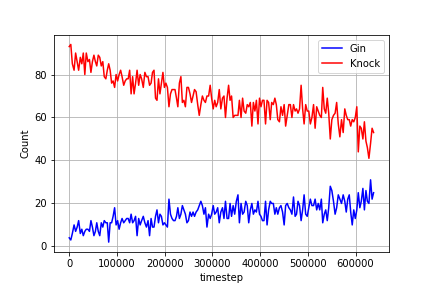

In [ ]:
Image(log_dir + '/rand_fig4.png')

###### Selfplay

In [ ]:
_, actions = tournament3(selfplay_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 15, 'Knock': 32, 'Other': 53, 'Knock_Possible': 283, 'Avg Turns': 23.65}


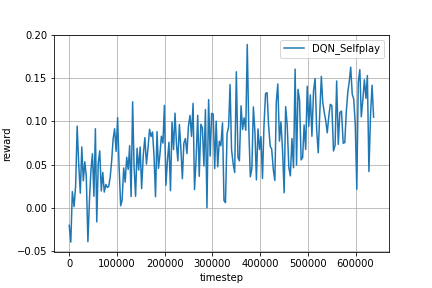

In [ ]:
Image(log_dir + '/self_fig.png')

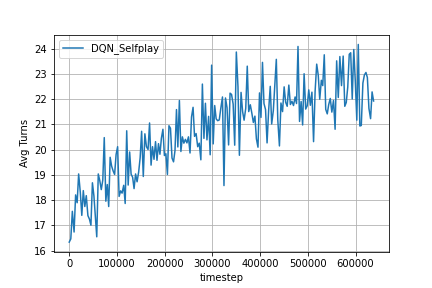

In [ ]:
Image(log_dir + '/self_fig2.png')

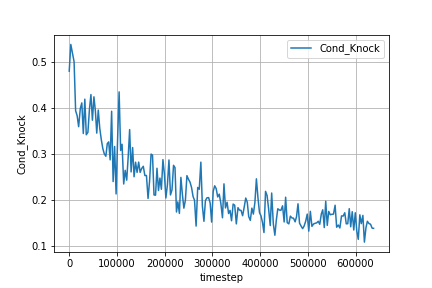

In [ ]:
Image(log_dir + '/self_fig3.png')

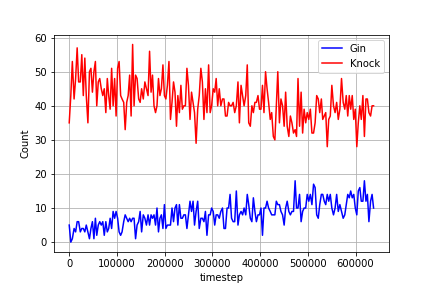

In [ ]:
Image(log_dir + '/self_fig4.png')

###### SGRAgent

In [ ]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 11, 'Other': 89, 'Knock_Possible': 103, 'Avg Turns': 16.39}


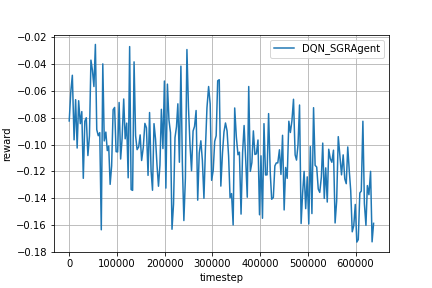

In [ ]:
Image(log_dir + '/sgr_fig.png')

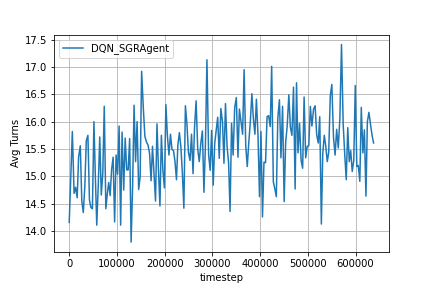

In [ ]:
Image(log_dir + '/sgr_fig2.png')

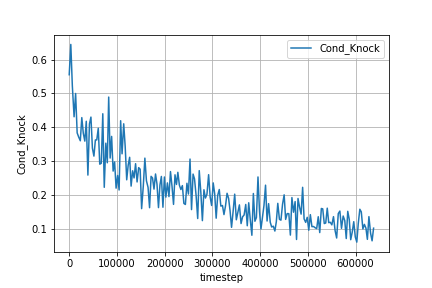

In [ ]:
Image(log_dir + '/sgr_fig3.png')

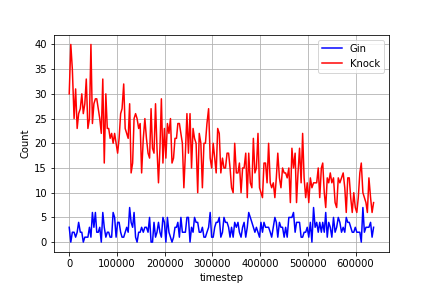

In [ ]:
Image(log_dir + '/sgr_fig4.png')

## baseline 2HL 80K

### Parameters

In [ ]:
# Pretrain model selection
state = 'all'
action = 'all'
dqn_model_name = 'baseline_2HL_80k'
model_name = '{}/models/{}/{}/all_states_all_actions_2hl_extra_knock_data_80K/model.pt'.format(pth,state,action)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 520, 110]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 5000  # mahjong_dqn has 100000
episode_num = 20000  # mahjong_dqn has 100000

# learning rate
learning_rate = 5e-5
# learning_rate = 0.00001 # 1e-5

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
# default: 100
memory_init_size = 1000

# default: 32
batch_size = 64
# batch_size = 1024

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 10

# enable top layer, copy top layer weights, freeze_layers
top_layer = False
copy_top = False
freeze_layers = False

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = False
knock_val = 0.002

# environment configs
# payoff_fnc = get_payoff_gin_rummy_v8
# cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
# cfg = {'seed': 0, 'is_always_knock': True}
cfg = {'seed': 0}

### Environment Initialization

In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, SGRAgent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
logger_self = Logger(log_dir, env='self_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False


### Load Pretrained Weights

In [ ]:
checkpoint = torch.load(model_name, map_location=device)
load_checkpoint(checkpoint, agent=agent)

### Train

#### Training Loop

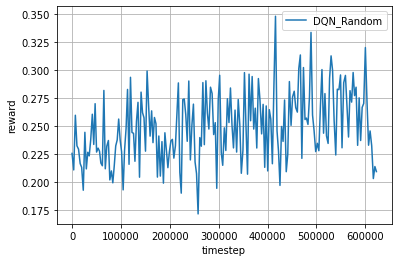

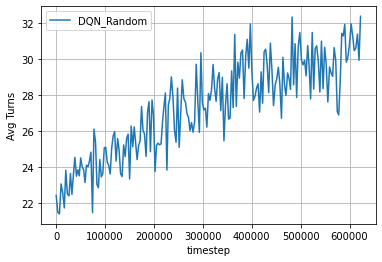

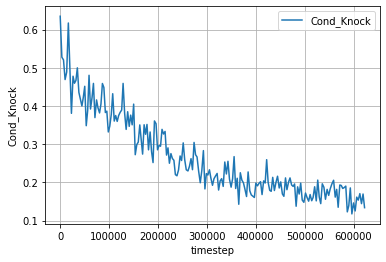

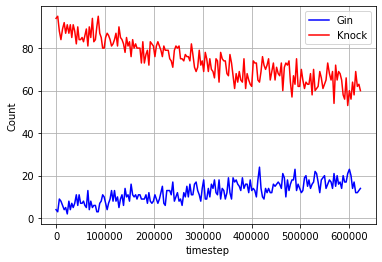

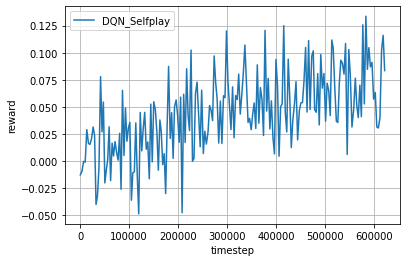

...

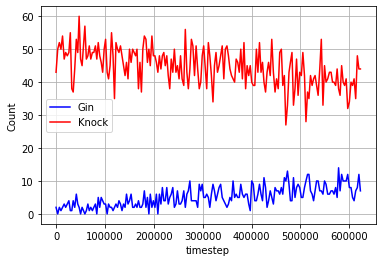

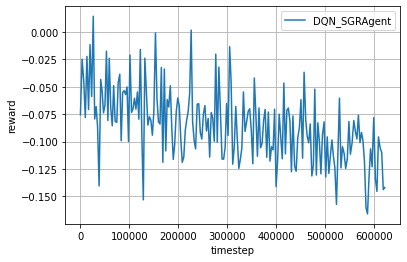

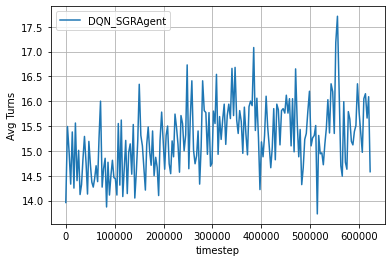

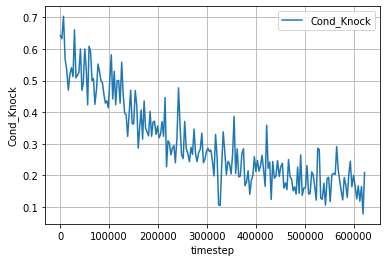

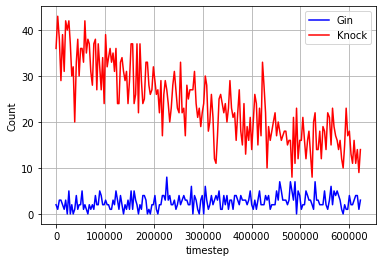

In [ ]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        print('\nSelfplay:')
        rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        reward_self = rewards[0]
        logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        if reward_self > max_reward_self:
            max_reward_self = reward_self
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_self:
            max_knock_self = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

clear_output()

#### Training Plots

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

###### Random

In [ ]:
_, actions = tournament3(random_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 12, 'Knock': 62, 'Other': 26, 'Knock_Possible': 393, 'Avg Turns': 30.95}


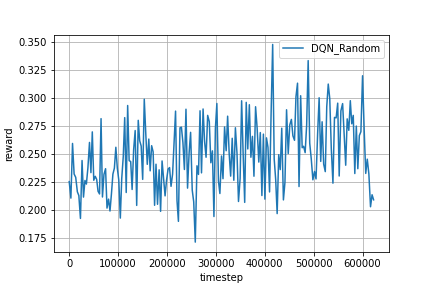

In [ ]:
Image(log_dir + '/rand_fig.png')

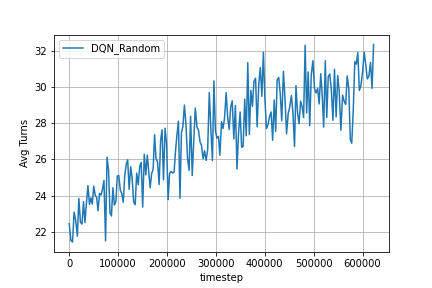

In [ ]:
Image(log_dir + '/rand_fig2.png')

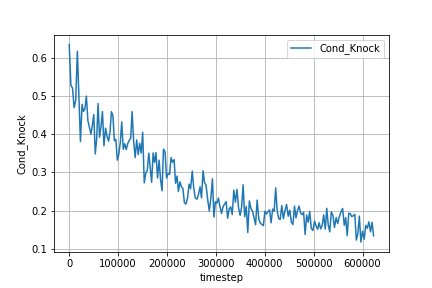

In [ ]:
Image(log_dir + '/rand_fig3.png')

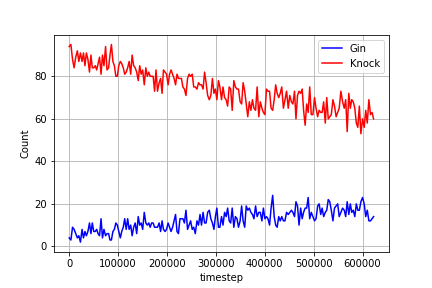

In [ ]:
Image(log_dir + '/rand_fig4.png')

###### Selfplay

In [ ]:
_, actions = tournament3(selfplay_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 9, 'Knock': 43, 'Other': 48, 'Knock_Possible': 214, 'Avg Turns': 21.7}


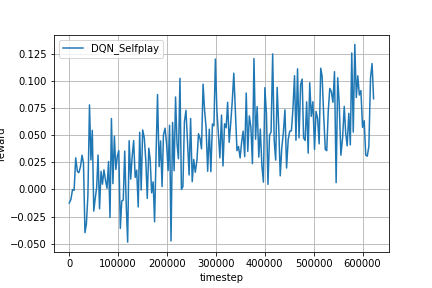

In [ ]:
Image(log_dir + '/self_fig.png')

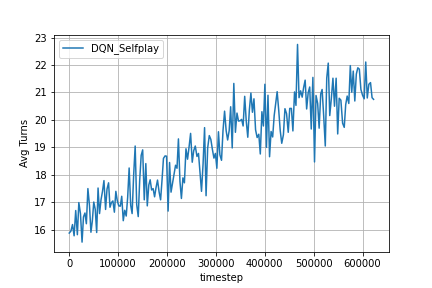

In [ ]:
Image(log_dir + '/self_fig2.png')

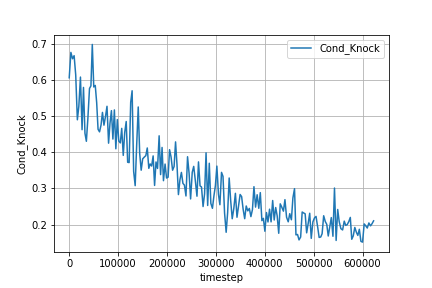

In [ ]:
Image(log_dir + '/self_fig3.png')

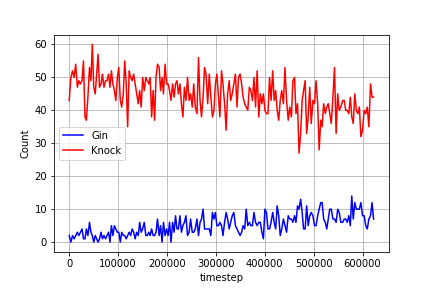

In [ ]:
Image(log_dir + '/self_fig4.png')

###### SGRAgent

In [ ]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 1, 'Knock': 12, 'Other': 87, 'Knock_Possible': 79, 'Avg Turns': 16.47}


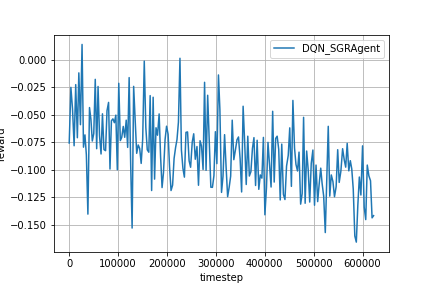

In [ ]:
Image(log_dir + '/sgr_fig.png')

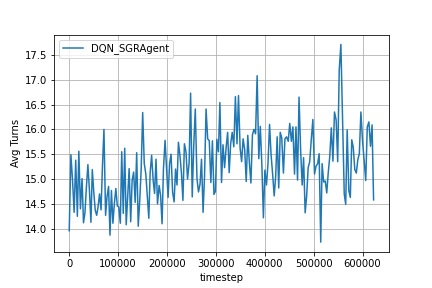

In [ ]:
Image(log_dir + '/sgr_fig2.png')

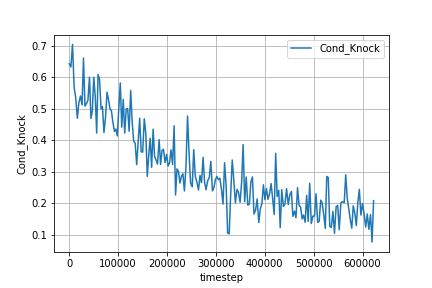

In [ ]:
Image(log_dir + '/sgr_fig3.png')

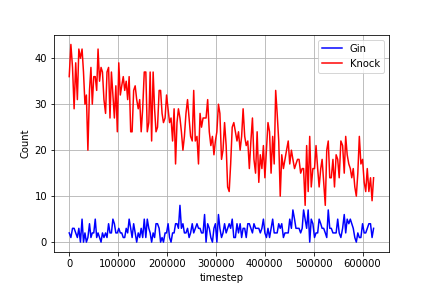

In [ ]:
Image(log_dir + '/sgr_fig4.png')

## frozen

### Parameters

In [ ]:
# Pretrain model selection
state = 'all'
action = 'all'
dqn_model_name = 'frozen'
model_name = '{}/models/{}/{}/all_states_all_actions_2hl_extra_knock_data_80K/model.pt'.format(pth,state,action)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 520, 110]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 5000  # mahjong_dqn has 100000
episode_num = 20000  # mahjong_dqn has 100000

# learning rate
learning_rate = 5e-5
# learning_rate = 0.00001 # 1e-5

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
# default: 100
memory_init_size = 1000

# default: 32
batch_size = 64
# batch_size = 1024

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 10

# enable top layer, copy top layer weights, freeze_layers
top_layer = False
copy_top = False
freeze_layers = True

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = False
knock_val = 0.002

# environment configs
# payoff_fnc = get_payoff_gin_rummy_v8
# cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
# cfg = {'seed': 0, 'is_always_knock': True}
cfg = {'seed': 0}

### Environment Initialization

In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, SGRAgent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
logger_self = Logger(log_dir, env='self_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False



### Load Pretrained Weights

In [ ]:
checkpoint = torch.load(model_name, map_location=device)
load_checkpoint(checkpoint, agent=agent)

### Train

#### Training Loop

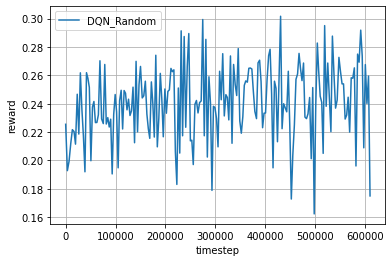

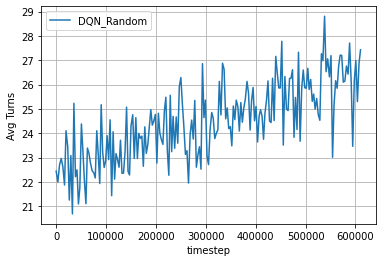

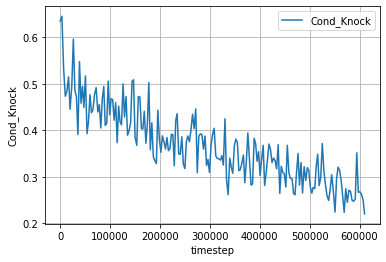

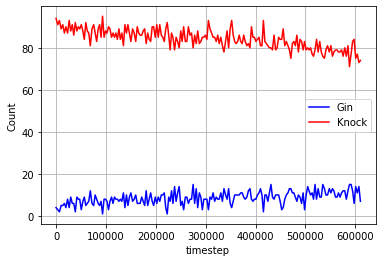

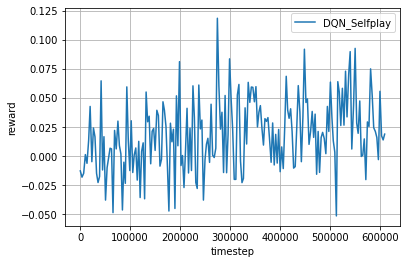

...

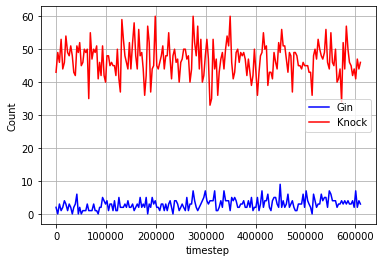

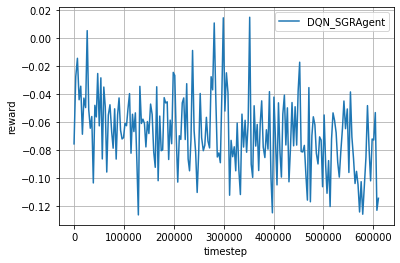

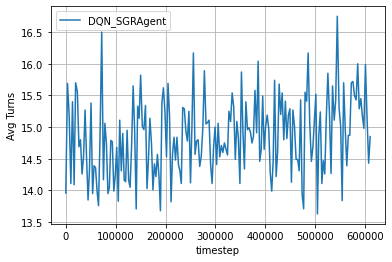

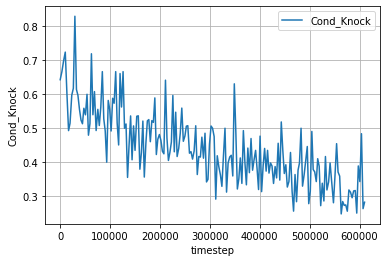

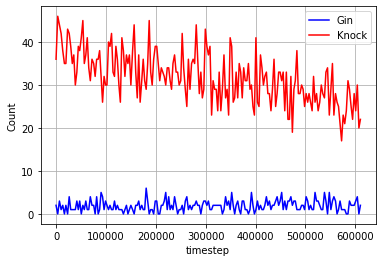

In [ ]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        print('\nSelfplay:')
        rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        reward_self = rewards[0]
        logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        if reward_self > max_reward_self:
            max_reward_self = reward_self
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_self:
            max_knock_self = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

clear_output()

#### Training Plots

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

###### Random

In [ ]:
_, actions = tournament3(random_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 7, 'Knock': 83, 'Other': 10, 'Knock_Possible': 290, 'Avg Turns': 27.65}


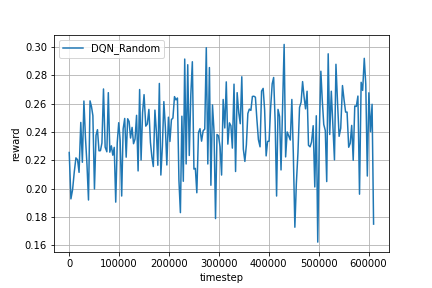

In [ ]:
Image(log_dir + '/rand_fig.png')

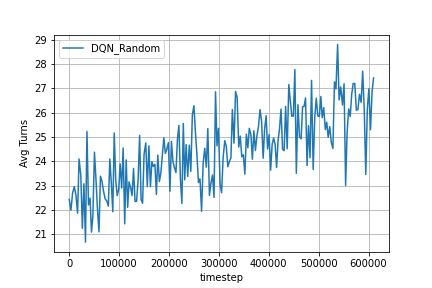

In [ ]:
Image(log_dir + '/rand_fig2.png')

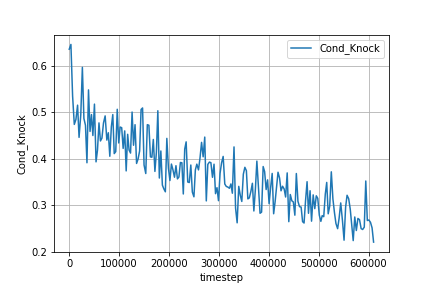

In [ ]:
Image(log_dir + '/rand_fig3.png')

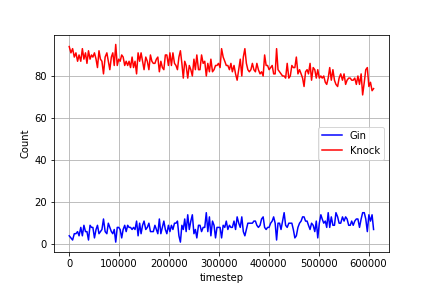

In [ ]:
Image(log_dir + '/rand_fig4.png')

###### Selfplay

In [ ]:
_, actions = tournament3(selfplay_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 4, 'Knock': 46, 'Other': 50, 'Knock_Possible': 142, 'Avg Turns': 18.44}


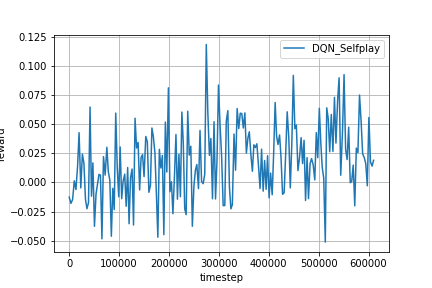

In [ ]:
Image(log_dir + '/self_fig.png')

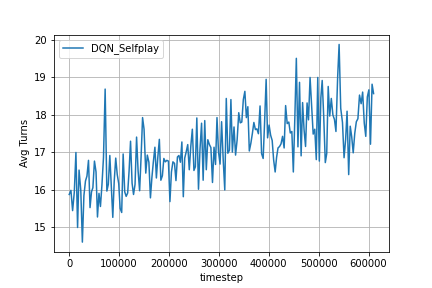

In [ ]:
Image(log_dir + '/self_fig2.png')

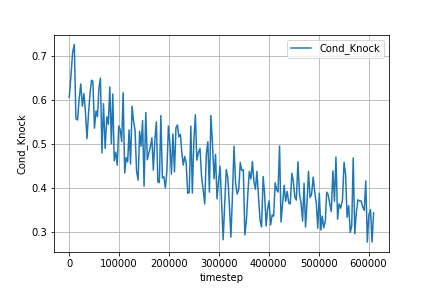

In [ ]:
Image(log_dir + '/self_fig3.png')

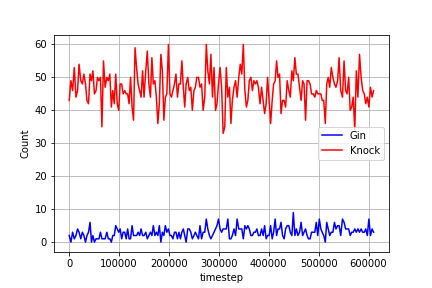

In [ ]:
Image(log_dir + '/self_fig4.png')

###### SGRAgent

In [ ]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 29, 'Other': 71, 'Knock_Possible': 77, 'Avg Turns': 15.89}


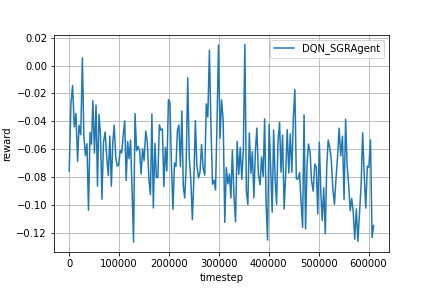

In [ ]:
Image(log_dir + '/sgr_fig.png')

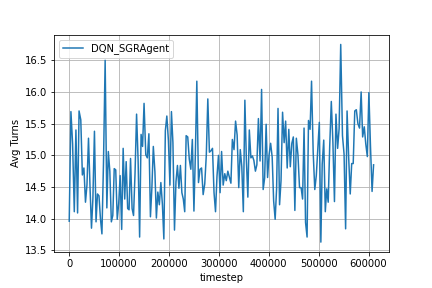

In [ ]:
Image(log_dir + '/sgr_fig2.png')

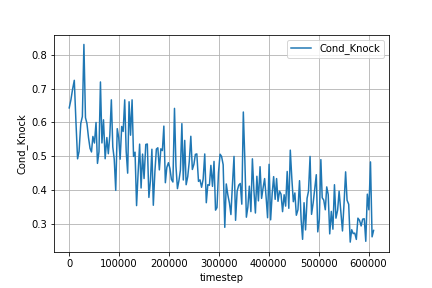

In [ ]:
Image(log_dir + '/sgr_fig3.png')

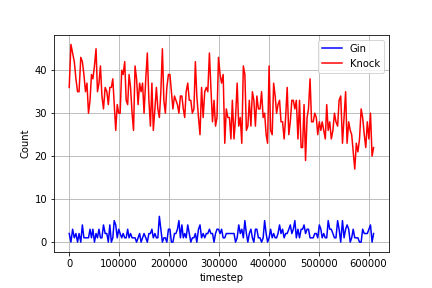

In [ ]:
Image(log_dir + '/sgr_fig4.png')

## random top

### Parameters

In [ ]:
# Pretrain model selection
state = 'all'
action = 'all'
model_name = '{}/models/{}/{}/all_states_all_actions_2hl_extra_knock_data_80K/model.pt'.format(pth,state,action)
dqn_model_name = 'random'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 520, 110]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 5000  # mahjong_dqn has 100000
episode_num = 20000  # mahjong_dqn has 100000
episode_num = 40000  # mahjong_dqn has 100000

# learning rate
learning_rate = 5e-5
# learning_rate = 0.00001 # 1e-5

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
# default: 100
memory_init_size = 1000

# default: 32
batch_size = 64
# batch_size = 1024

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 10

# enable top layer, copy top layer weights, freeze_layers
top_layer = True
copy_top = False
freeze_layers = True

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = False
knock_val = 0.002

# environment configs
# payoff_fnc = get_payoff_gin_rummy_v8
# cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
# cfg = {'seed': 0, 'is_always_knock': True}
cfg = {'seed': 0}

### Environment Initialization

In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, SGRAgent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
# logger_self = Logger(log_dir, env='self_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False


### Load Pretrained Weights

In [ ]:
checkpoint = torch.load(model_name, map_location=device)
load_checkpoint(checkpoint, agent=agent)

### Train

#### Training Loop

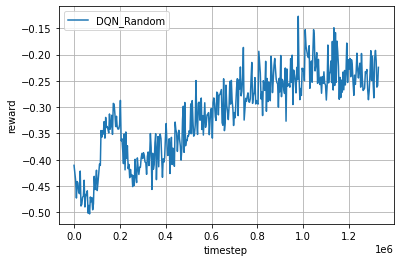

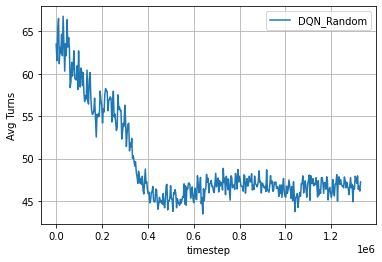

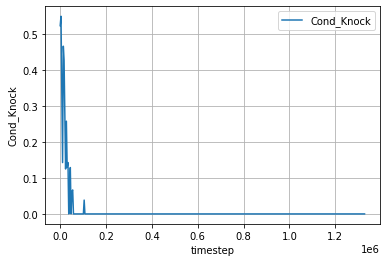

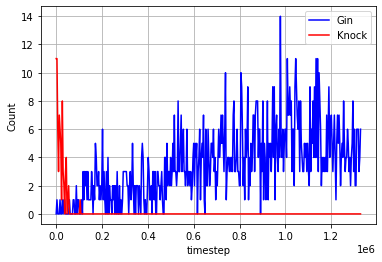

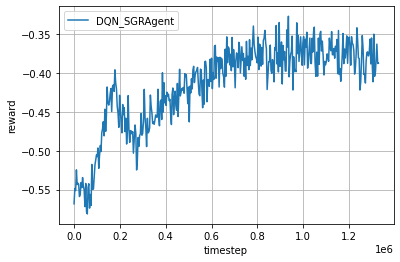

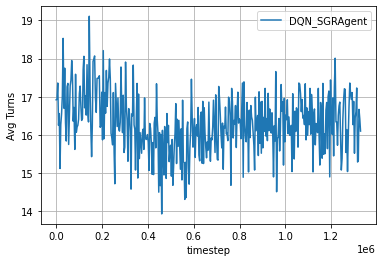

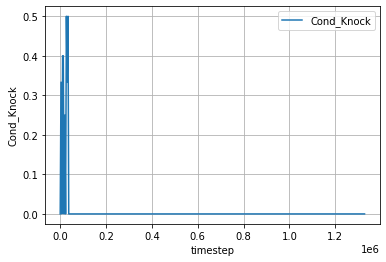

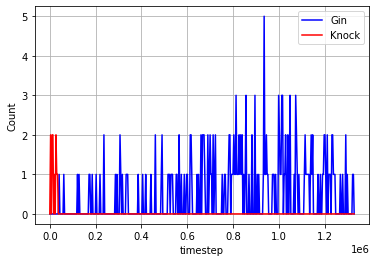

In [ ]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        # print('\nSelfplay:')
        # rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        # reward_self = rewards[0]
        # logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        # if reward_self > max_reward_self:
        #     max_reward_self = reward_self
        #     state_dict = agent.get_state_dict() 
        #     torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        # Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        # if Cond_Knock > max_knock_self:
        #     max_knock_self = Cond_Knock
        #     state_dict = agent.get_state_dict() 
        #     torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
# logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
# logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

clear_output()

#### Training Plots

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

###### Random

In [ ]:
_, actions = tournament3(random_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 5, 'Knock': 0, 'Other': 95, 'Knock_Possible': 182, 'Avg Turns': 47.16}


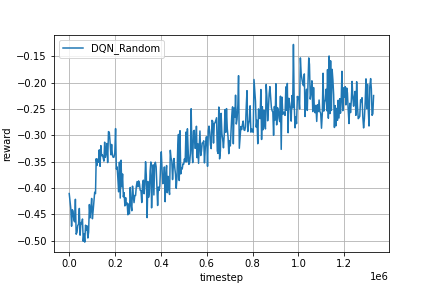

In [ ]:
Image(log_dir + '/rand_fig.png')

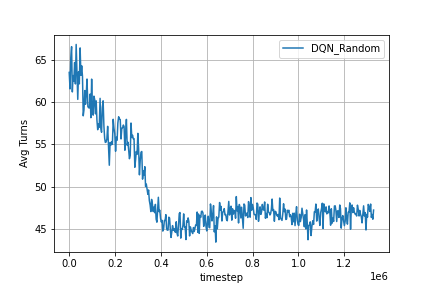

In [ ]:
Image(log_dir + '/rand_fig2.png')

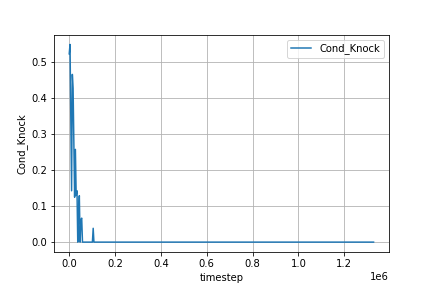

In [ ]:
Image(log_dir + '/rand_fig3.png')

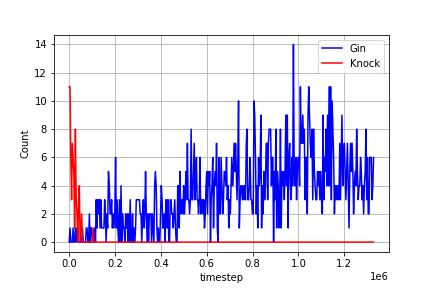

In [ ]:
Image(log_dir + '/rand_fig4.png')

###### Selfplay

In [ ]:
# _, actions = tournament3(selfplay_env, evaluate_num)
# clear_output()
# print(actions)

In [ ]:
# Image(log_dir + '/self_fig.png')

In [ ]:
# Image(log_dir + '/self_fig2.png')

In [ ]:
# Image(log_dir + '/self_fig3.png')

In [ ]:
# Image(log_dir + '/self_fig4.png')

###### SGRAgent

In [ ]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 1, 'Knock': 0, 'Other': 99, 'Knock_Possible': 30, 'Avg Turns': 17.19}


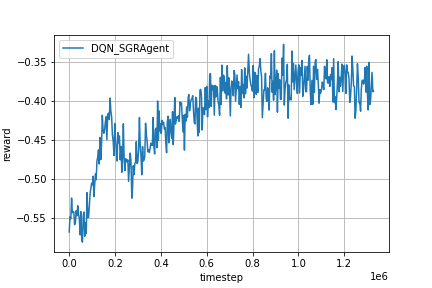

In [ ]:
Image(log_dir + '/sgr_fig.png')

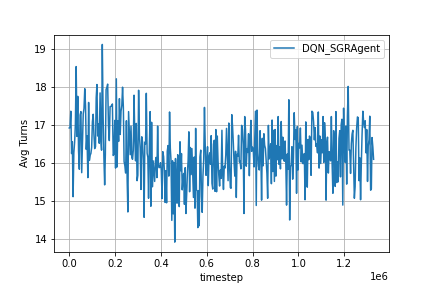

In [ ]:
Image(log_dir + '/sgr_fig2.png')

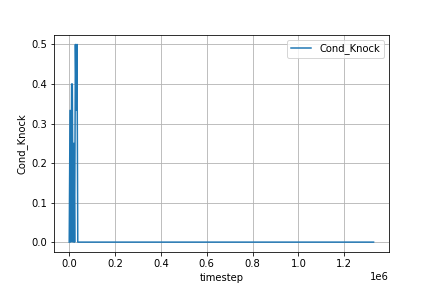

In [ ]:
Image(log_dir + '/sgr_fig3.png')

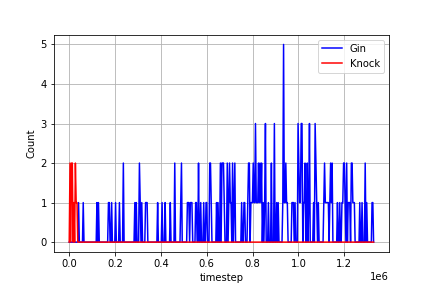

In [ ]:
Image(log_dir + '/sgr_fig4.png')

## copy top

### Parameters

In [6]:
# Pretrain model selection
state = 'all'
action = 'all'
model_name = '{}/models/{}/{}/all_states_all_actions_2hl_extra_knock_data_80K/model.pt'.format(pth,state,action)
dqn_model_name = 'copy'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 520, 110]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 40000  # mahjong_dqn has 100000

# learning rate
learning_rate = 5e-5
# learning_rate = 0.00001 # 1e-5

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
# default: 100
memory_init_size = 1000

# default: 32
batch_size = 64
# batch_size = 1024

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 10

# enable top layer, copy top layer weights, freeze_layers
top_layer = True
copy_top = True
freeze_layers = True

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = False
knock_val = 0.002

# environment configs
# payoff_fnc = get_payoff_gin_rummy_v8
# cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
# cfg = {'seed': 0, 'is_always_knock': True}
cfg = {'seed': 0}

### Environment Initialization

In [7]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, SGRAgent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
# logger_self = Logger(log_dir, env='self_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False



### Load Pretrained Weights

In [8]:
checkpoint = torch.load(model_name, map_location=device)
load_checkpoint(checkpoint, agent=agent)

### Train

#### Training Loop

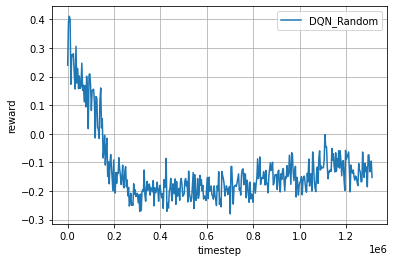

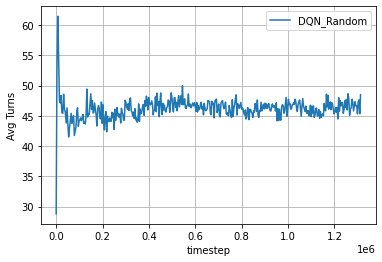

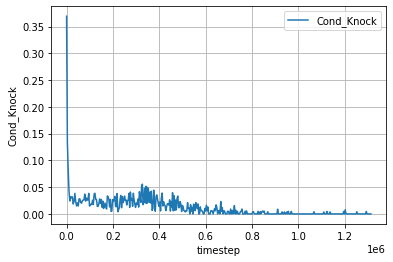

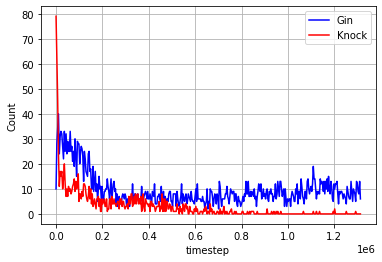

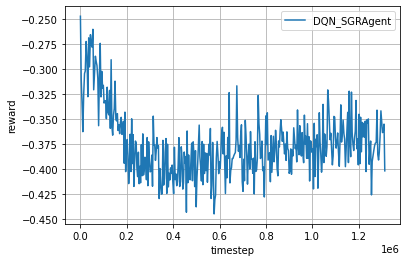

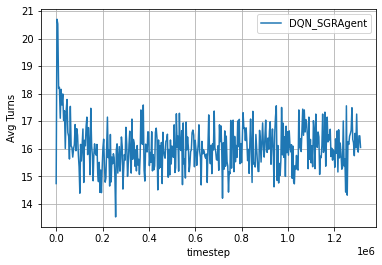

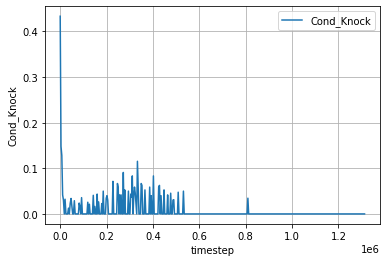

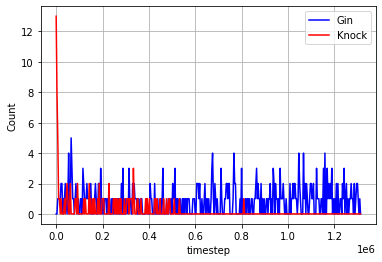

In [9]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        # print('\nSelfplay:')
        # rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        # reward_self = rewards[0]
        # logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        # if reward_self > max_reward_self:
        #     max_reward_self = reward_self
        #     state_dict = agent.get_state_dict() 
        #     torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        # Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        # if Cond_Knock > max_knock_self:
        #     max_knock_self = Cond_Knock
        #     state_dict = agent.get_state_dict() 
        #     torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
# logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
# logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

clear_output()

#### Training Plots

In [10]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [11]:
checkpoint = torch.load(model_name, map_location=device)

In [12]:
agent.load(checkpoint)

###### Random

In [13]:
_, actions = tournament3(random_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 10, 'Knock': 0, 'Other': 90, 'Knock_Possible': 290, 'Avg Turns': 44.92}


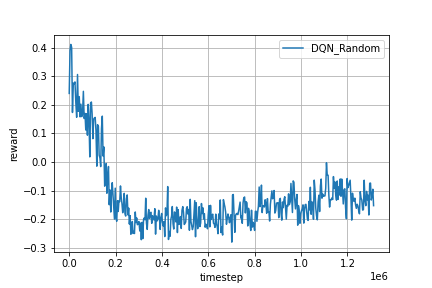

In [14]:
Image(log_dir + '/rand_fig.png')

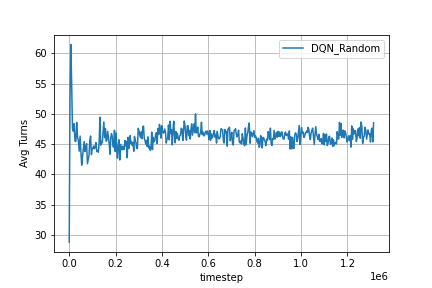

In [15]:
Image(log_dir + '/rand_fig2.png')

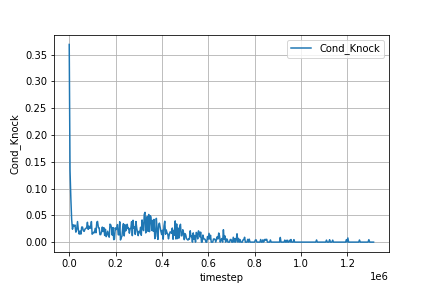

In [16]:
Image(log_dir + '/rand_fig3.png')

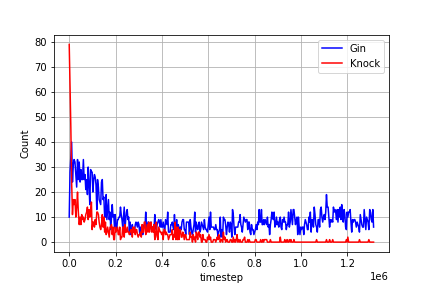

In [17]:
Image(log_dir + '/rand_fig4.png')

###### Selfplay

In [18]:
# _, actions = tournament3(selfplay_env, evaluate_num)
# clear_output()
# print(actions)

In [19]:
# Image(log_dir + '/self_fig.png')

In [20]:
# Image(log_dir + '/self_fig2.png')

In [21]:
# Image(log_dir + '/self_fig3.png')

In [22]:
# Image(log_dir + '/self_fig4.png')

###### SGRAgent

In [23]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 1, 'Knock': 0, 'Other': 99, 'Knock_Possible': 28, 'Avg Turns': 16.42}


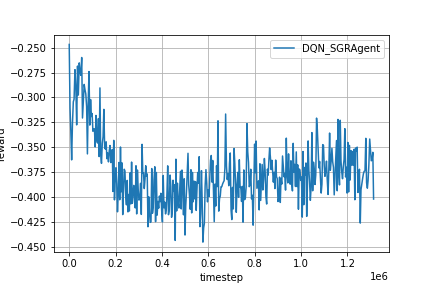

In [24]:
Image(log_dir + '/sgr_fig.png')

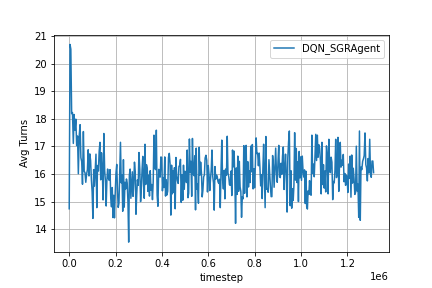

In [25]:
Image(log_dir + '/sgr_fig2.png')

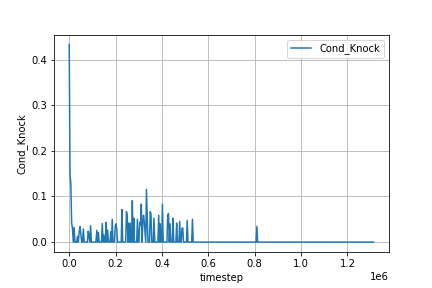

In [26]:
Image(log_dir + '/sgr_fig3.png')

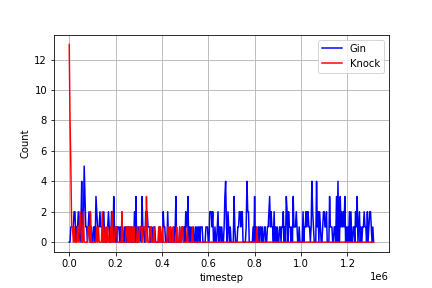

In [27]:
Image(log_dir + '/sgr_fig4.png')

# final/rewards

In [ ]:
dir = 'final/rewards'    # root directory name for group of models

## reward_v2

- Gin = 1
- Knock = 0.4
- Other = -0.01/DW


### Parameters

In [ ]:
# Pretrain model selection
state = 'all'
action = 'all'
dqn_model_name = 'v2'
model_name = '{}/models/{}/{}/all_states_all_actions_2hl_extra_knock_data_80K/model.pt'.format(pth,state,action)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 520, 110]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 5000  # mahjong_dqn has 100000
episode_num = 20000  # mahjong_dqn has 100000

# learning rate
learning_rate = 5e-5
# learning_rate = 0.00001 # 1e-5

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
# default: 100
memory_init_size = 1000

# default: 32
batch_size = 64
# batch_size = 1024

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 10

# enable top layer, copy top layer weights, freeze_layers
top_layer = False
copy_top = False
freeze_layers = True

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = False
knock_val = 0.002

# environment configs
payoff_fnc = get_payoff_gin_rummy_v2
cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
# cfg = {'seed': 0}

### Environment Initialization

In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, SGRAgent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
logger_self = Logger(log_dir, env='self_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False



### Load Pretrained Weights

In [ ]:
checkpoint = torch.load(model_name, map_location=device)
load_checkpoint(checkpoint, agent=agent)

### Train

#### Training Loop

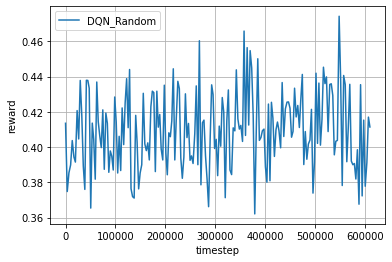

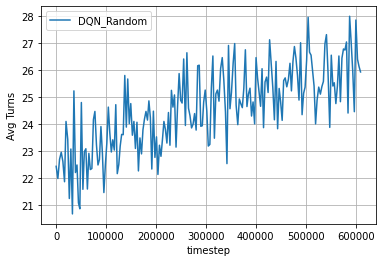

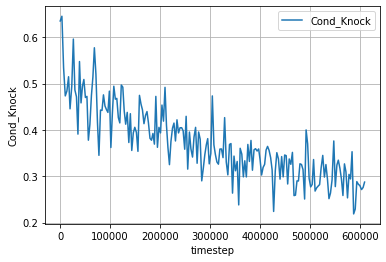

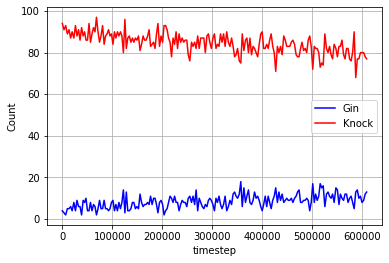

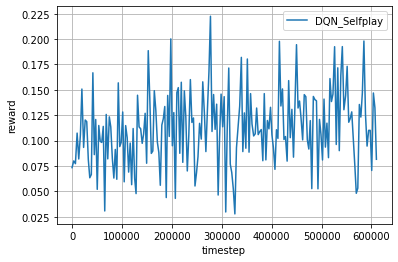

...

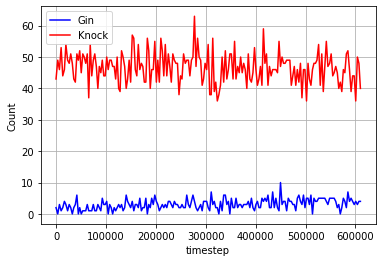

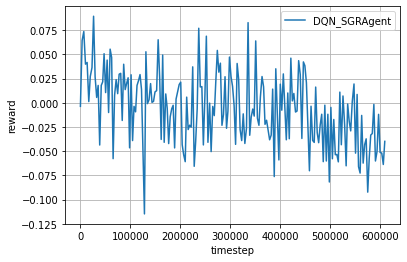

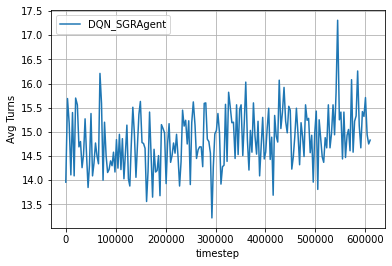

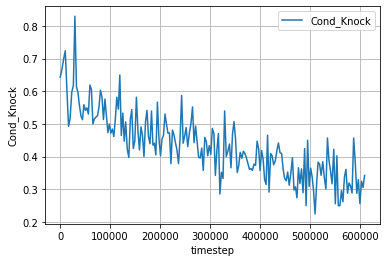

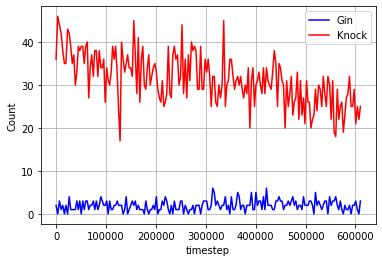

In [ ]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        print('\nSelfplay:')
        rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        reward_self = rewards[0]
        logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        if reward_self > max_reward_self:
            max_reward_self = reward_self
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_self:
            max_knock_self = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

clear_output()

#### Training Plots

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

###### Random

In [ ]:
_, actions = tournament3(random_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 8, 'Knock': 85, 'Other': 7, 'Knock_Possible': 273, 'Avg Turns': 26.83}


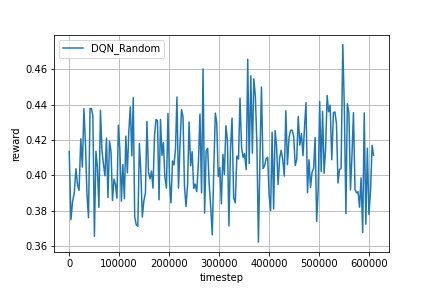

In [ ]:
Image(log_dir + '/rand_fig.png')

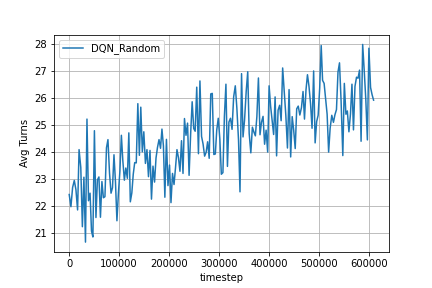

In [ ]:
Image(log_dir + '/rand_fig2.png')

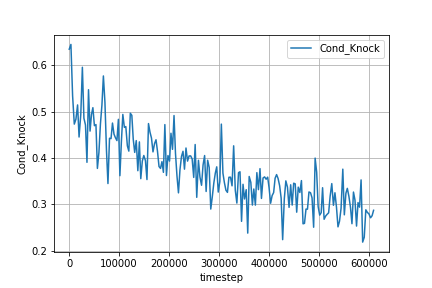

In [ ]:
Image(log_dir + '/rand_fig3.png')

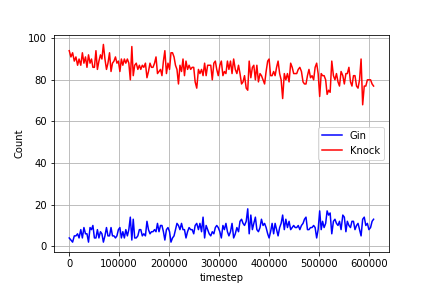

In [ ]:
Image(log_dir + '/rand_fig4.png')

###### Selfplay

In [ ]:
_, actions = tournament3(selfplay_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 5, 'Knock': 46, 'Other': 49, 'Knock_Possible': 130, 'Avg Turns': 18.81}


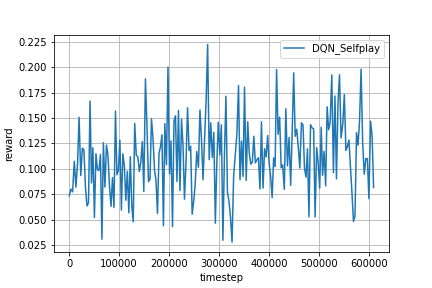

In [ ]:
Image(log_dir + '/self_fig.png')

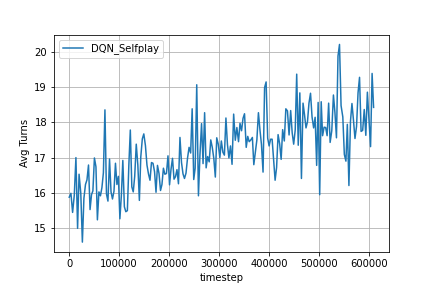

In [ ]:
Image(log_dir + '/self_fig2.png')

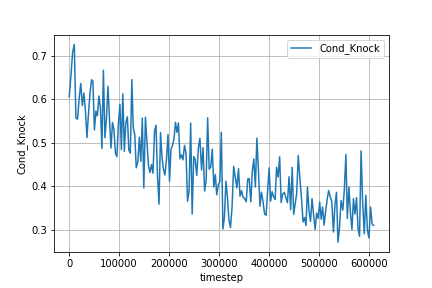

In [ ]:
Image(log_dir + '/self_fig3.png')

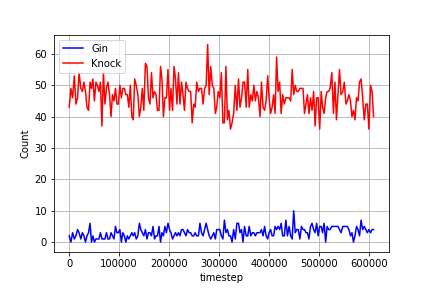

In [ ]:
Image(log_dir + '/self_fig4.png')

###### SGRAgent

In [ ]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 22, 'Other': 78, 'Knock_Possible': 72, 'Avg Turns': 16.11}


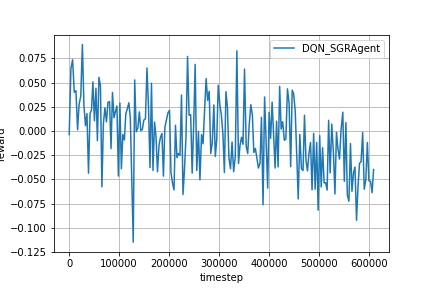

In [ ]:
Image(log_dir + '/sgr_fig.png')

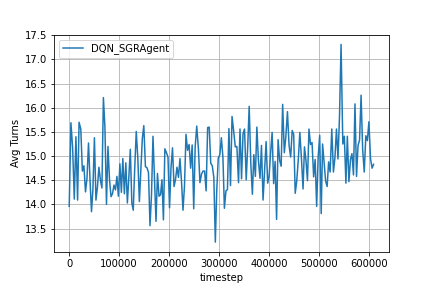

In [ ]:
Image(log_dir + '/sgr_fig2.png')

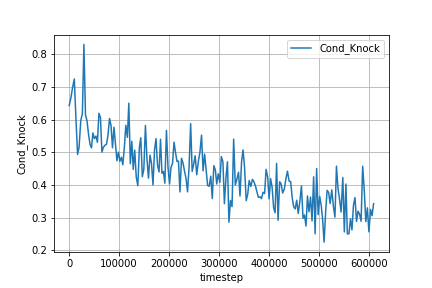

In [ ]:
Image(log_dir + '/sgr_fig3.png')

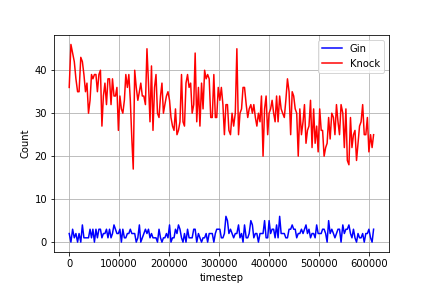

In [ ]:
Image(log_dir + '/sgr_fig4.png')

## reward_v3

- Gin = 1
- Knock = 1
- Other = -0.01/DW


### Parameters

In [ ]:
# Pretrain model selection
state = 'all'
action = 'all'
dqn_model_name = 'v3'
model_name = '{}/models/{}/{}/all_states_all_actions_2hl_extra_knock_data_80K/model.pt'.format(pth,state,action)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 520, 110]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 5000  # mahjong_dqn has 100000
episode_num = 20000  # mahjong_dqn has 100000

# learning rate
learning_rate = 5e-5
# learning_rate = 0.00001 # 1e-5

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
# default: 100
memory_init_size = 1000

# default: 32
batch_size = 64
# batch_size = 1024

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 10

# enable top layer, copy top layer weights, freeze_layers
top_layer = False
copy_top = False
freeze_layers = True

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = False
knock_val = 0.002

# environment configs
payoff_fnc = get_payoff_gin_rummy_v3
cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
# cfg = {'seed': 0}

### Environment Initialization

In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, SGRAgent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
logger_self = Logger(log_dir, env='self_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False



### Load Pretrained Weights

In [ ]:
checkpoint = torch.load(model_name, map_location=device)
load_checkpoint(checkpoint, agent=agent)

### Train

#### Training Loop

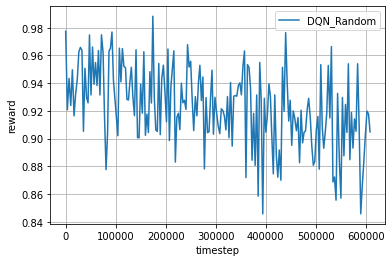

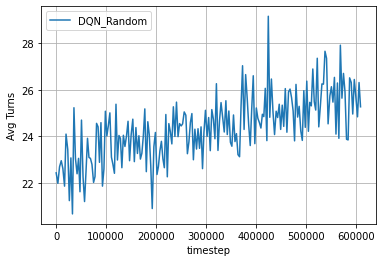

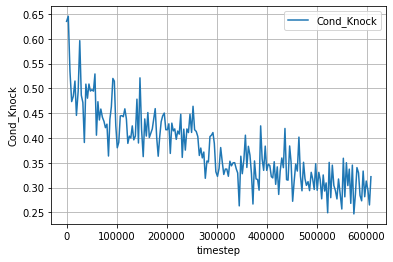

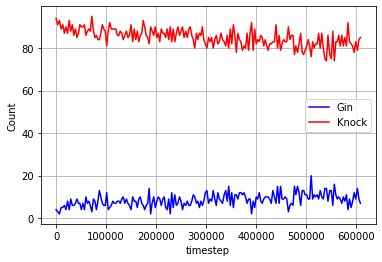

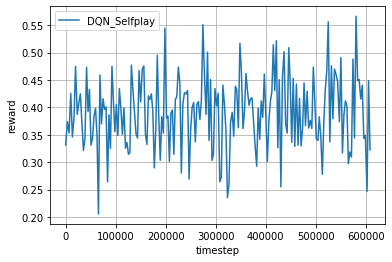

...

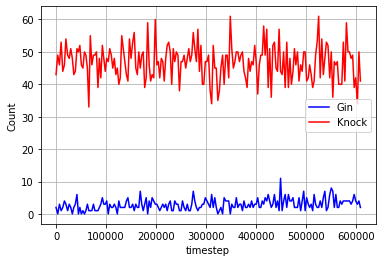

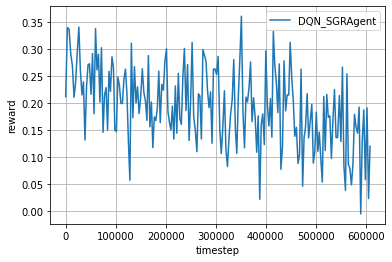

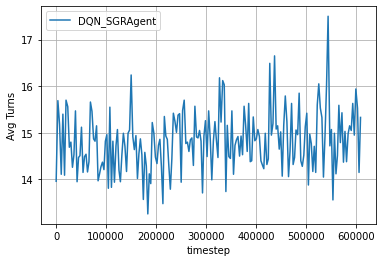

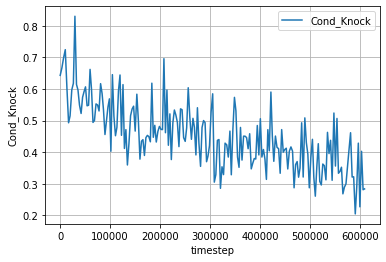

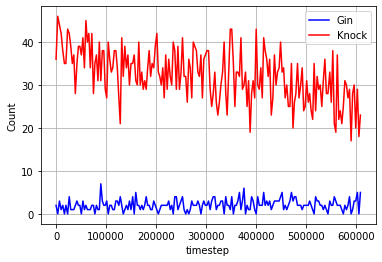

In [ ]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        print('\nSelfplay:')
        rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        reward_self = rewards[0]
        logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        if reward_self > max_reward_self:
            max_reward_self = reward_self
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_self:
            max_knock_self = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

clear_output()

#### Training Plots

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

###### Random

In [ ]:
_, actions = tournament3(random_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 6, 'Knock': 87, 'Other': 7, 'Knock_Possible': 297, 'Avg Turns': 27.19}


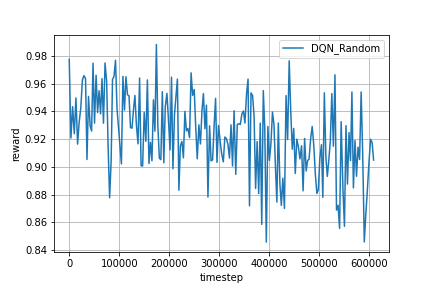

In [ ]:
Image(log_dir + '/rand_fig.png')

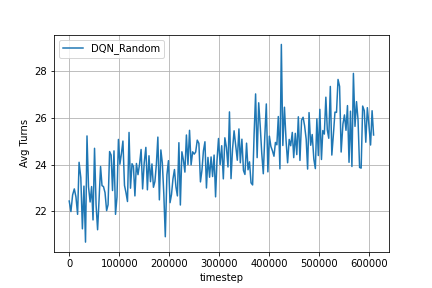

In [ ]:
Image(log_dir + '/rand_fig2.png')

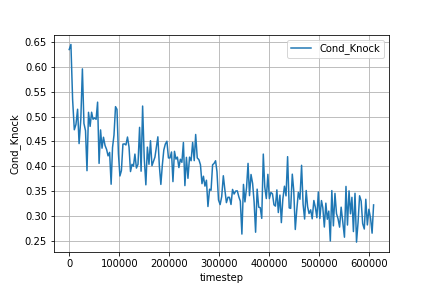

In [ ]:
Image(log_dir + '/rand_fig3.png')

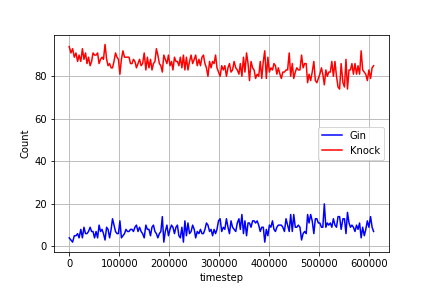

In [ ]:
Image(log_dir + '/rand_fig4.png')

###### Selfplay

In [ ]:
_, actions = tournament3(selfplay_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 5, 'Knock': 37, 'Other': 58, 'Knock_Possible': 156, 'Avg Turns': 18.31}


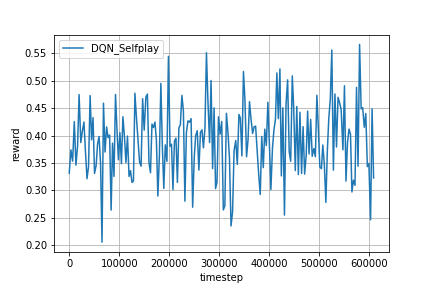

In [ ]:
Image(log_dir + '/self_fig.png')

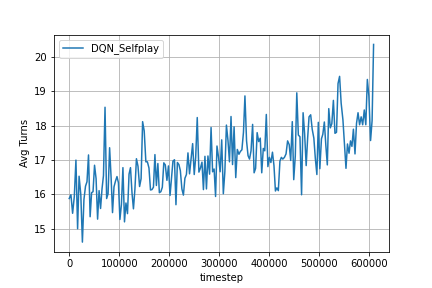

In [ ]:
Image(log_dir + '/self_fig2.png')

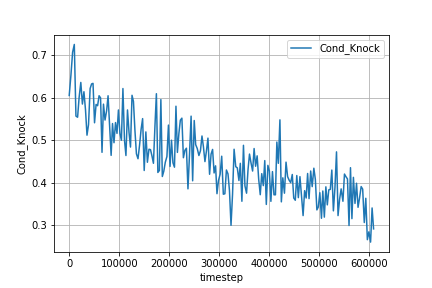

In [ ]:
Image(log_dir + '/self_fig3.png')

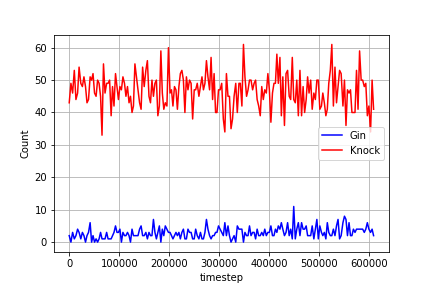

In [ ]:
Image(log_dir + '/self_fig4.png')

###### SGRAgent

In [ ]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 27, 'Other': 73, 'Knock_Possible': 84, 'Avg Turns': 15.94}


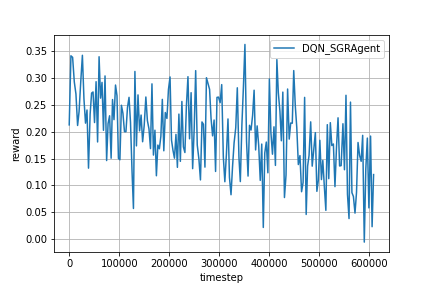

In [ ]:
Image(log_dir + '/sgr_fig.png')

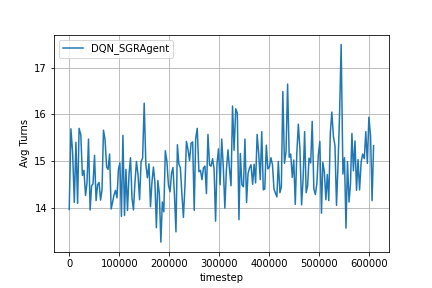

In [ ]:
Image(log_dir + '/sgr_fig2.png')

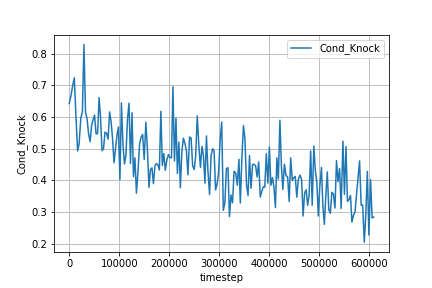

In [ ]:
Image(log_dir + '/sgr_fig3.png')

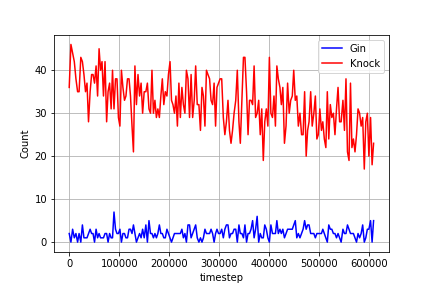

In [ ]:
Image(log_dir + '/sgr_fig4.png')

## reward_v4

- Gin = 1
- Knock = 10
- Other = -0.01/DW


### Parameters

In [ ]:
# Pretrain model selection
state = 'all'
action = 'all'
dqn_model_name = 'v4'
model_name = '{}/models/{}/{}/all_states_all_actions_2hl_extra_knock_data_80K/model.pt'.format(pth,state,action)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 520, 110]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 5000  # mahjong_dqn has 100000
episode_num = 20000  # mahjong_dqn has 100000

# learning rate
learning_rate = 5e-5
# learning_rate = 0.00001 # 1e-5

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
# default: 100
memory_init_size = 1000

# default: 32
batch_size = 64
# batch_size = 1024

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 10

# enable top layer, copy top layer weights, freeze_layers
top_layer = False
copy_top = False
freeze_layers = True

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = False
knock_val = 0.002

# environment configs
payoff_fnc = get_payoff_gin_rummy_v4
cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
# cfg = {'seed': 0}

### Environment Initialization

In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, SGRAgent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
logger_self = Logger(log_dir, env='self_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False



### Load Pretrained Weights

In [ ]:
checkpoint = torch.load(model_name, map_location=device)
load_checkpoint(checkpoint, agent=agent)

### Train

#### Training Loop

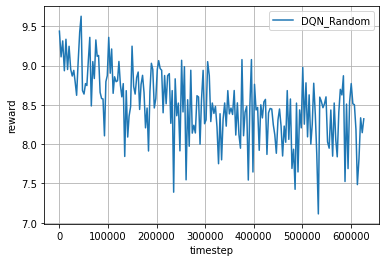

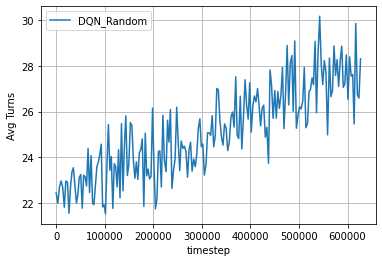

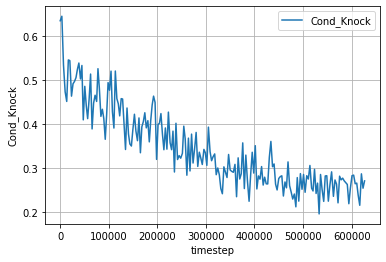

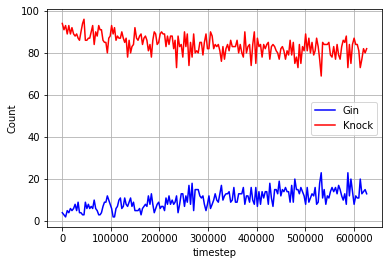

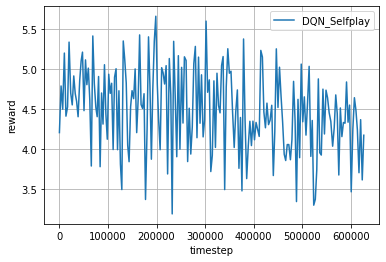

...

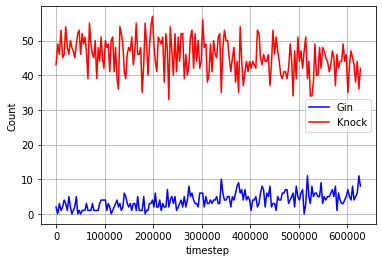

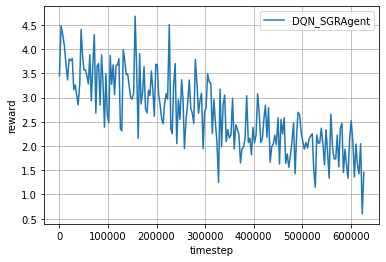

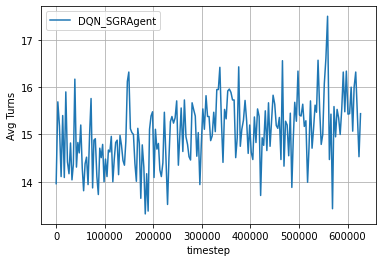

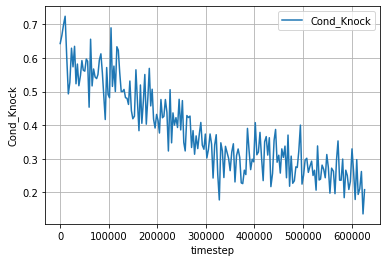

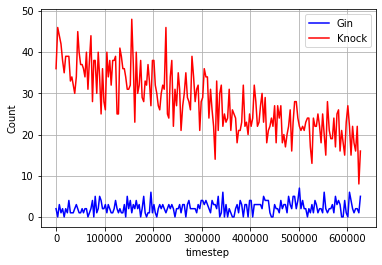

In [ ]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        print('\nSelfplay:')
        rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        reward_self = rewards[0]
        logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        if reward_self > max_reward_self:
            max_reward_self = reward_self
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_self:
            max_knock_self = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

clear_output()

#### Training Plots

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

###### Random

In [ ]:
_, actions = tournament3(random_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 14, 'Knock': 80, 'Other': 6, 'Knock_Possible': 349, 'Avg Turns': 29.61}


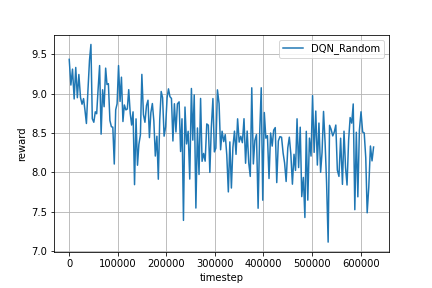

In [ ]:
Image(log_dir + '/rand_fig.png')

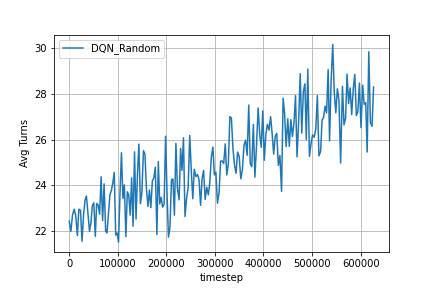

In [ ]:
Image(log_dir + '/rand_fig2.png')

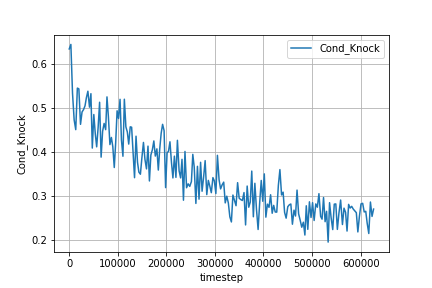

In [ ]:
Image(log_dir + '/rand_fig3.png')

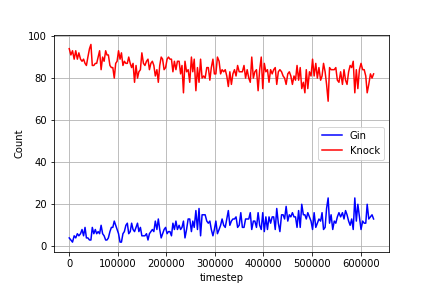

In [ ]:
Image(log_dir + '/rand_fig4.png')

###### Selfplay

In [ ]:
_, actions = tournament3(selfplay_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 5, 'Knock': 44, 'Other': 51, 'Knock_Possible': 176, 'Avg Turns': 21.7}


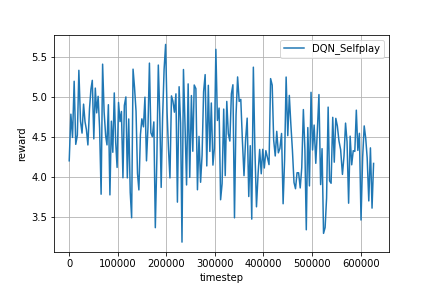

In [ ]:
Image(log_dir + '/self_fig.png')

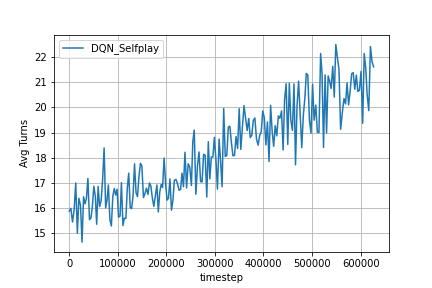

In [ ]:
Image(log_dir + '/self_fig2.png')

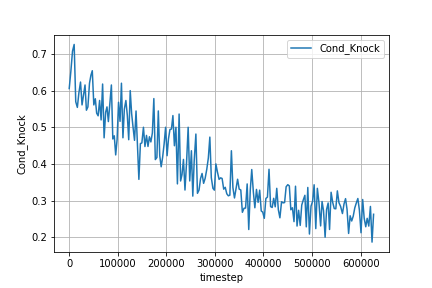

In [ ]:
Image(log_dir + '/self_fig3.png')

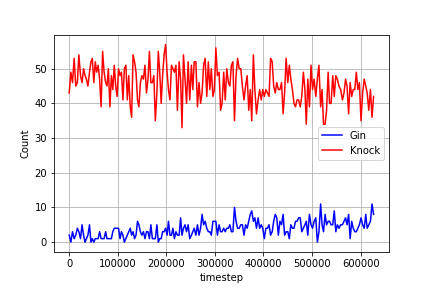

In [ ]:
Image(log_dir + '/self_fig4.png')

###### SGRAgent

In [ ]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 14, 'Other': 86, 'Knock_Possible': 70, 'Avg Turns': 15.99}


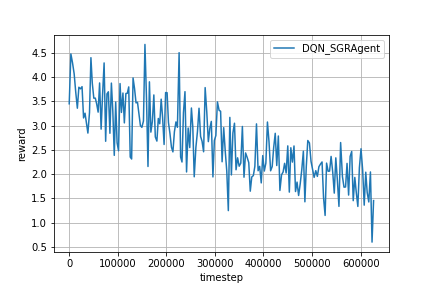

In [ ]:
Image(log_dir + '/sgr_fig.png')

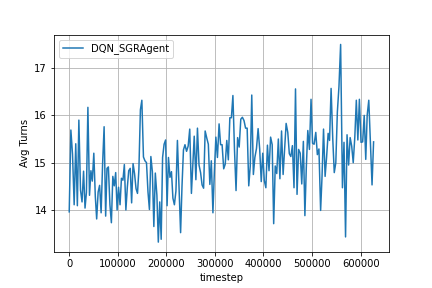

In [ ]:
Image(log_dir + '/sgr_fig2.png')

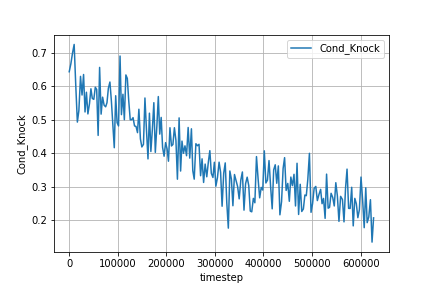

In [ ]:
Image(log_dir + '/sgr_fig3.png')

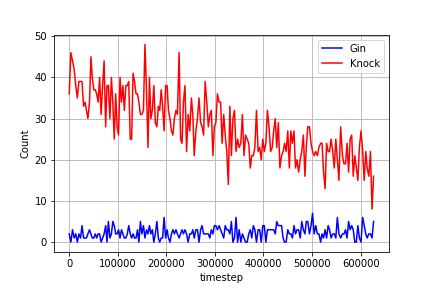

In [ ]:
Image(log_dir + '/sgr_fig4.png')

## reward_v5

- Gin = 1
- Knock = 10
- Other = 0


### Parameters

In [ ]:
# Pretrain model selection
state = 'all'
action = 'all'
dqn_model_name = 'v5'
model_name = '{}/models/{}/{}/all_states_all_actions_2hl_extra_knock_data_80K/model.pt'.format(pth,state,action)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 520, 110]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 5000  # mahjong_dqn has 100000
episode_num = 20000  # mahjong_dqn has 100000

# learning rate
learning_rate = 5e-5
# learning_rate = 0.00001 # 1e-5

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
# default: 100
memory_init_size = 1000

# default: 32
batch_size = 64
# batch_size = 1024

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 10

# enable top layer, copy top layer weights, freeze_layers
top_layer = False
copy_top = False
freeze_layers = True

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = False
knock_val = 0.002

# environment configs
payoff_fnc = get_payoff_gin_rummy_v5
cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
# cfg = {'seed': 0}

### Environment Initialization

In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, SGRAgent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
logger_self = Logger(log_dir, env='self_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False


### Load Pretrained Weights

In [ ]:
checkpoint = torch.load(model_name, map_location=device)
load_checkpoint(checkpoint, agent=agent)

### Train

#### Training Loop

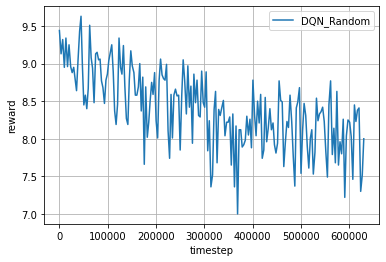

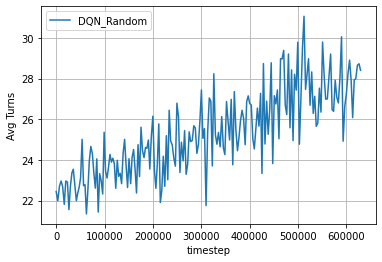

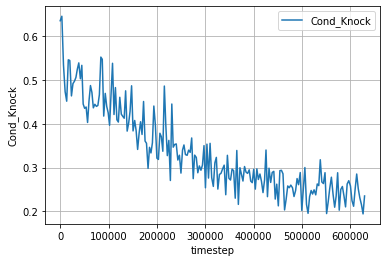

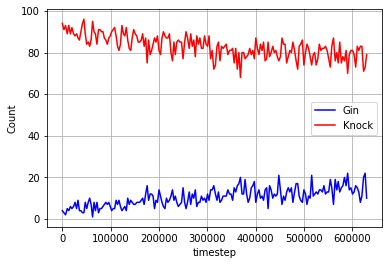

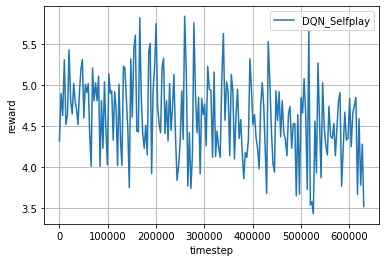

...

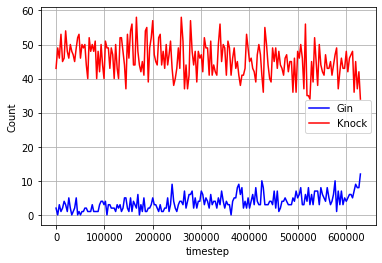

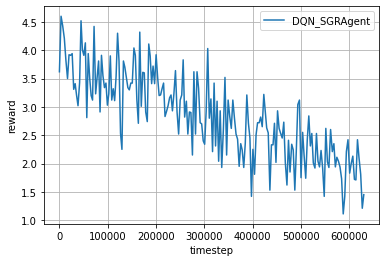

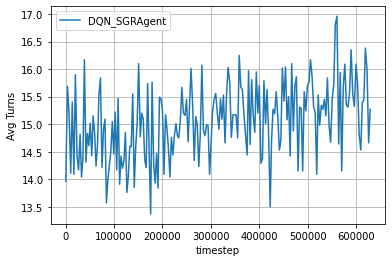

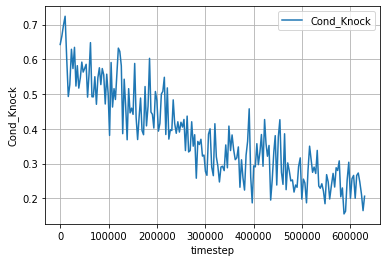

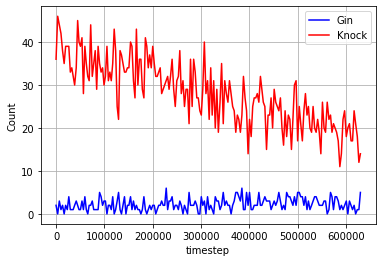

In [ ]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        print('\nSelfplay:')
        rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        reward_self = rewards[0]
        logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        if reward_self > max_reward_self:
            max_reward_self = reward_self
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_self:
            max_knock_self = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

clear_output()

#### Training Plots

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

###### Random

In [ ]:
_, actions = tournament3(random_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 18, 'Knock': 76, 'Other': 6, 'Knock_Possible': 402, 'Avg Turns': 31.71}


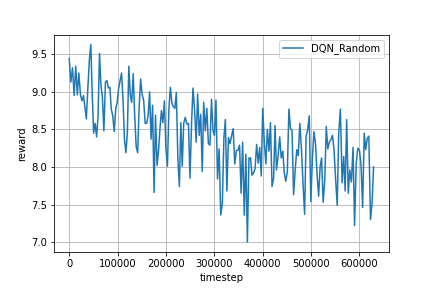

In [ ]:
Image(log_dir + '/rand_fig.png')

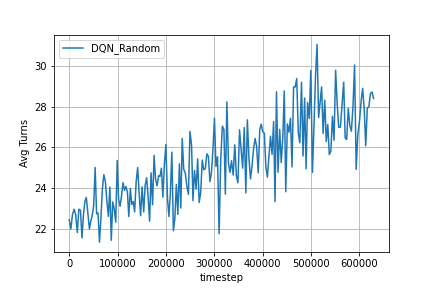

In [ ]:
Image(log_dir + '/rand_fig2.png')

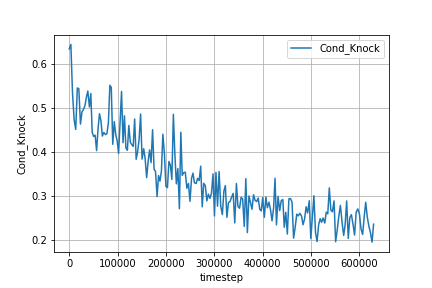

In [ ]:
Image(log_dir + '/rand_fig3.png')

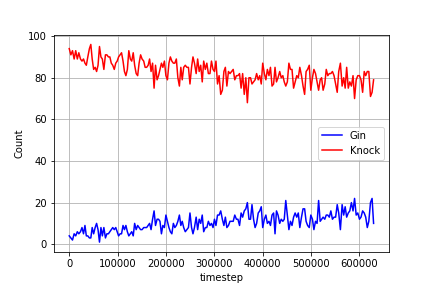

In [ ]:
Image(log_dir + '/rand_fig4.png')

###### Selfplay

In [ ]:
_, actions = tournament3(selfplay_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 5, 'Knock': 42, 'Other': 53, 'Knock_Possible': 165, 'Avg Turns': 20.55}


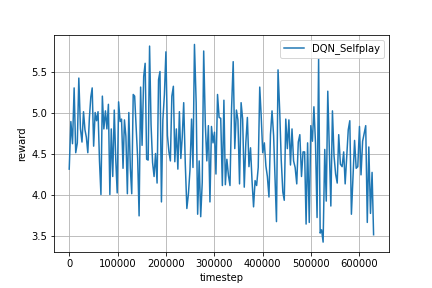

In [ ]:
Image(log_dir + '/self_fig.png')

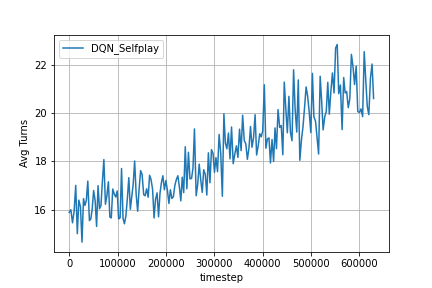

In [ ]:
Image(log_dir + '/self_fig2.png')

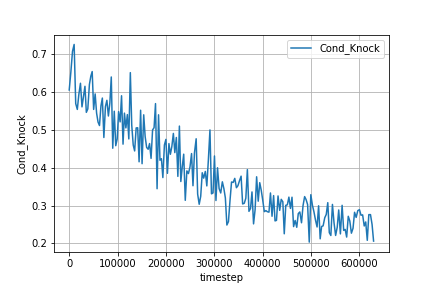

In [ ]:
Image(log_dir + '/self_fig3.png')

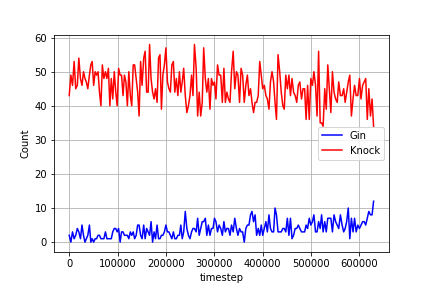

In [ ]:
Image(log_dir + '/self_fig4.png')

###### SGRAgent

In [ ]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 4, 'Knock': 16, 'Other': 80, 'Knock_Possible': 81, 'Avg Turns': 16.04}


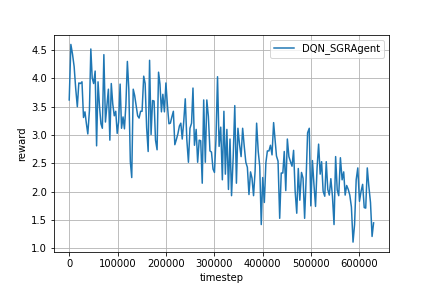

In [ ]:
Image(log_dir + '/sgr_fig.png')

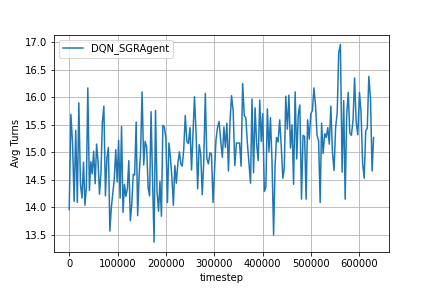

In [ ]:
Image(log_dir + '/sgr_fig2.png')

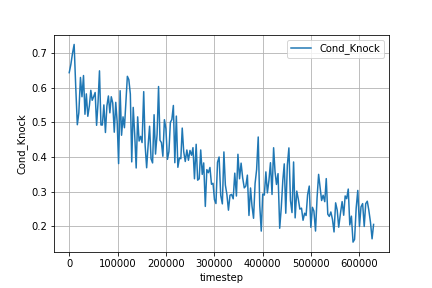

In [ ]:
Image(log_dir + '/sgr_fig3.png')

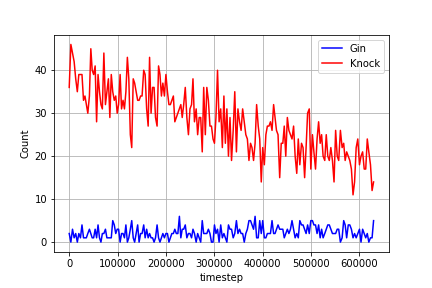

In [ ]:
Image(log_dir + '/sgr_fig4.png')

## reward_v7

- Gin = 0
- Knock = 10
- Other = 0


### Parameters

In [ ]:
# Pretrain model selection
state = 'all'
action = 'all'
dqn_model_name = 'v7'
model_name = '{}/models/{}/{}/all_states_all_actions_2hl_extra_knock_data_80K/model.pt'.format(pth,state,action)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 520, 110]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 5000  # mahjong_dqn has 100000
episode_num = 20000  # mahjong_dqn has 100000

# learning rate
learning_rate = 5e-5
# learning_rate = 0.00001 # 1e-5

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
# default: 100
memory_init_size = 1000

# default: 32
batch_size = 64
# batch_size = 1024

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 10

# enable top layer, copy top layer weights, freeze_layers
top_layer = False
copy_top = False
freeze_layers = True

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = False
knock_val = 0.002

# environment configs
payoff_fnc = get_payoff_gin_rummy_v7
cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
# cfg = {'seed': 0}

### Environment Initialization

In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, SGRAgent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
logger_self = Logger(log_dir, env='self_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False


### Load Pretrained Weights

In [ ]:
checkpoint = torch.load(model_name, map_location=device)
load_checkpoint(checkpoint, agent=agent)

### Train

#### Training Loop

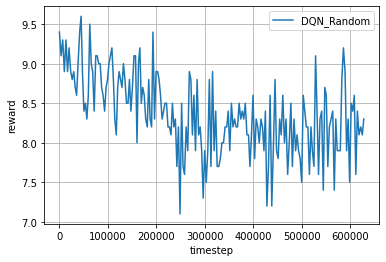

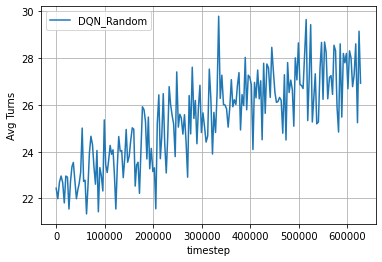

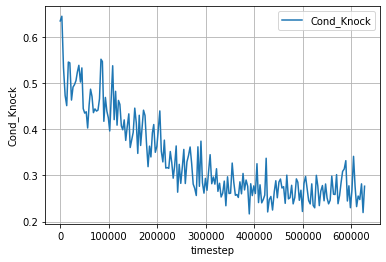

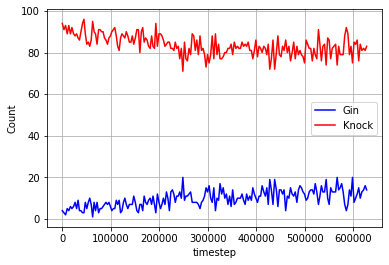

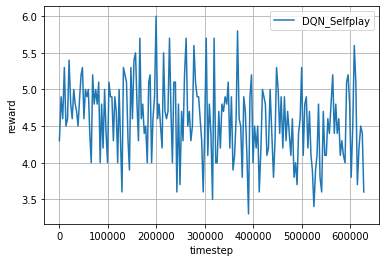

...

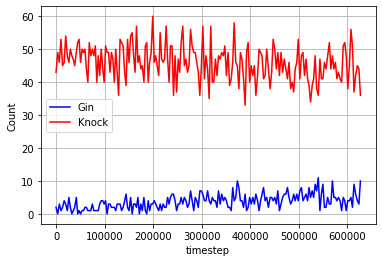

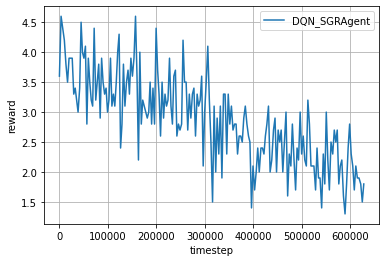

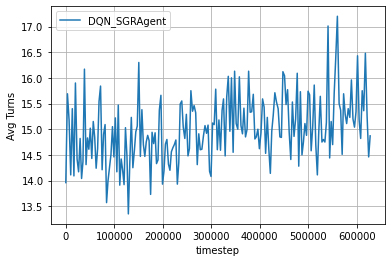

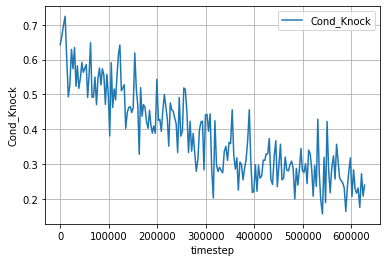

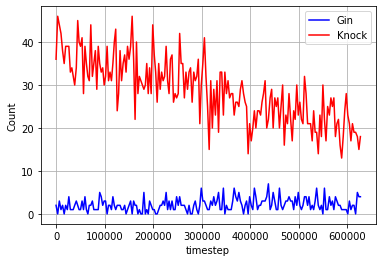

In [ ]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        print('\nSelfplay:')
        rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        reward_self = rewards[0]
        logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        if reward_self > max_reward_self:
            max_reward_self = reward_self
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_self:
            max_knock_self = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

clear_output()

#### Training Plots

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

###### Random

In [ ]:
_, actions = tournament3(random_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 8, 'Knock': 87, 'Other': 5, 'Knock_Possible': 320, 'Avg Turns': 28.65}


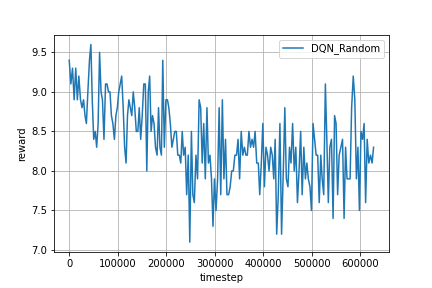

In [ ]:
Image(log_dir + '/rand_fig.png')

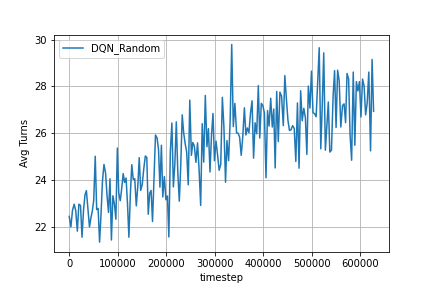

In [ ]:
Image(log_dir + '/rand_fig2.png')

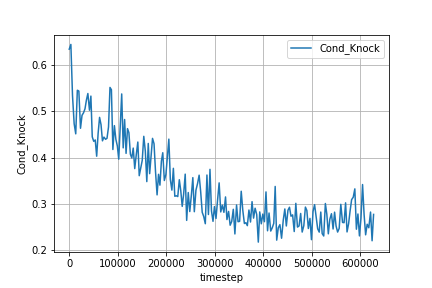

In [ ]:
Image(log_dir + '/rand_fig3.png')

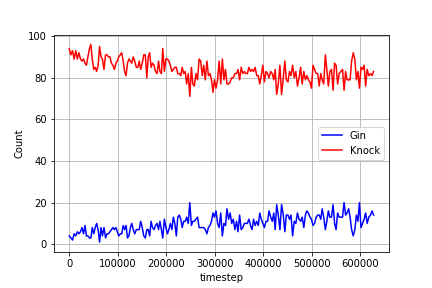

In [ ]:
Image(log_dir + '/rand_fig4.png')

###### Selfplay

In [ ]:
_, actions = tournament3(selfplay_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 6, 'Knock': 41, 'Other': 53, 'Knock_Possible': 153, 'Avg Turns': 20.22}


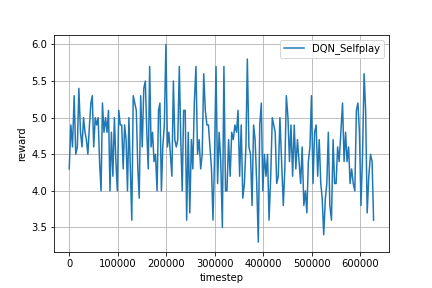

In [ ]:
Image(log_dir + '/self_fig.png')

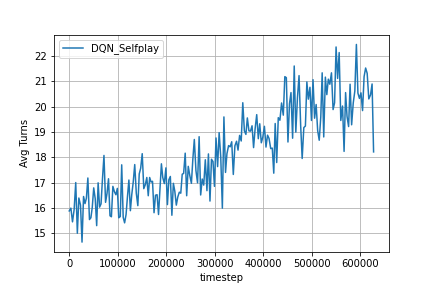

In [ ]:
Image(log_dir + '/self_fig2.png')

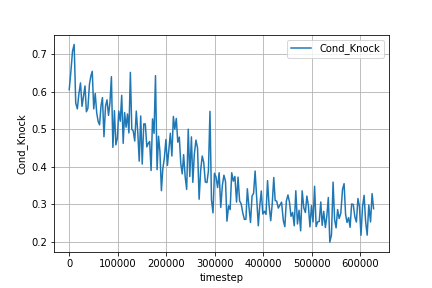

In [ ]:
Image(log_dir + '/self_fig3.png')

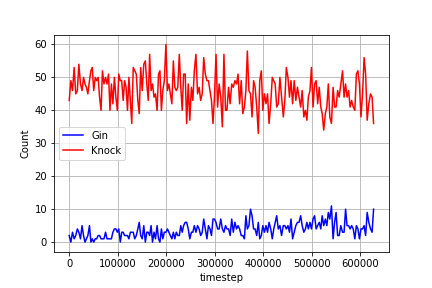

In [ ]:
Image(log_dir + '/self_fig4.png')

###### SGRAgent

In [ ]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 1, 'Knock': 18, 'Other': 81, 'Knock_Possible': 86, 'Avg Turns': 16.19}


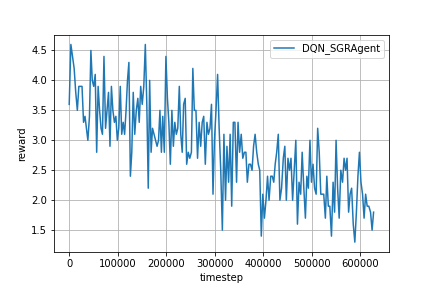

In [ ]:
Image(log_dir + '/sgr_fig.png')

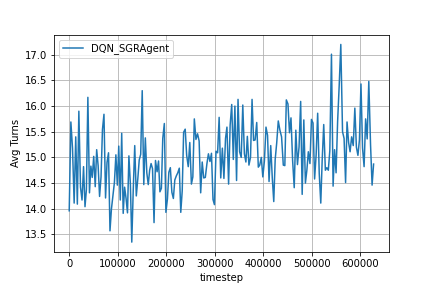

In [ ]:
Image(log_dir + '/sgr_fig2.png')

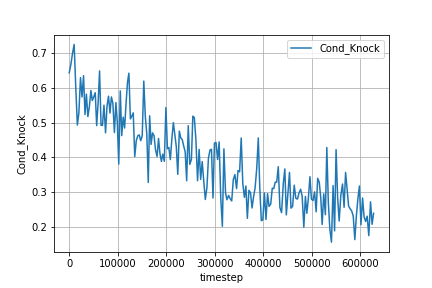

In [ ]:
Image(log_dir + '/sgr_fig3.png')

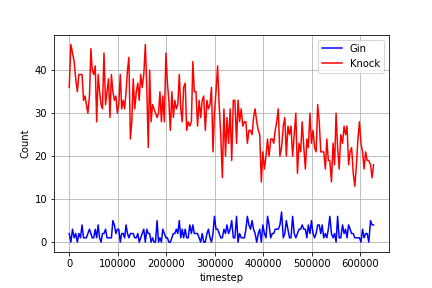

In [ ]:
Image(log_dir + '/sgr_fig4.png')

# final/pseudo

In [ ]:
dir = 'final/pseudo'    # root directory name for group of models

## all_data

### Parameters

In [ ]:
# Pretrain model selection
state = 'all'
action = 'all'
model_name = '{}/models/{}/{}/all_states_all_actions_2hl_extra_knock_data_80K/model.pt'.format(pth,state,action)
dqn_model_name = 'all_data'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 520, 110]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 40000  # mahjong_dqn has 100000

# learning rate
learning_rate = 5e-5

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
# default: 100
memory_init_size = 2000

# default: 32
# batch_size = 1024
batch_size = 64

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 10

# enable top layer, copy top layer weights, freeze_layers
top_layer = False
copy_top = True
freeze_layers = True

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = True
knock_val = 1

# environment configs
# payoff_fnc = get_payoff_gin_rummy_v8
# cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
cfg = {'seed': 0}

### Environment Initialization

In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

agent2 = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, SGRAgent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent2])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
logger_self = Logger(log_dir, env='self_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False


### Load Pretrained Weights

In [ ]:
checkpoint = torch.load(model_name, map_location=device)
load_checkpoint(checkpoint, agent)
load_checkpoint(checkpoint, agent2)

In [ ]:
# fix layer freezing due to loading
agent.q_estimator.qnet.fc_layers[1].weight.requires_grad = False
agent.q_estimator.qnet.fc_layers[1].bias.requires_grad = False
agent.q_estimator.qnet.fc_layers[3].weight.requires_grad = False
agent.q_estimator.qnet.fc_layers[3].bias.requires_grad = False
agent.q_estimator.qnet.fc_layers[5].weight.requires_grad = False
agent.q_estimator.qnet.fc_layers[5].bias.requires_grad = False
try:
    agent.q_estimator.qnet.fc_layers[7].weight.requires_grad = False
    agent.q_estimator.qnet.fc_layers[7].bias.requires_grad = False
except:
    pass

In [ ]:
# Reload the network so the copy is shallow instead of deep
pretrained_dict = {}
model_dict = agent.q_estimator.qnet.fc_layers.state_dict()
curr_layer = 1
for i in range(len(mlp_layers) + int(top_layer) + int(knock_layer)):
    pretrained_dict['fc_layers.{}.weight'.format(curr_layer)] = model_dict['{}.weight'.format(2*i+1)]
    pretrained_dict['fc_layers.{}.bias'.format(curr_layer)] = model_dict['{}.bias'.format(2*i+1)]
    curr_layer += 2

In [ ]:
# Set new knock layer to identity layer
model_dict_identity = torch.load('{}/models/identity/identity_and_bias_clamp.pth'.format(pth), map_location=device)
pretrained_dict['fc_layers.7.weight'] = model_dict_identity['l1.weight']
pretrained_dict['fc_layers.7.bias'] = model_dict_identity['l1.bias']

In [ ]:
# load pretrained weights
agent.q_estimator.qnet.load_state_dict(pretrained_dict)
agent.target_estimator.qnet.load_state_dict(pretrained_dict)
agent2.q_estimator.qnet.load_state_dict(pretrained_dict)
agent2.target_estimator.qnet.load_state_dict(pretrained_dict)

<All keys matched successfully>

In [ ]:
# unfreeze identity layer
agent.q_estimator.qnet.fc_layers[7].weight.requires_grad = True
agent.target_estimator.qnet.fc_layers[7].weight.requires_grad = True
agent.q_estimator.qnet.fc_layers[7].bias.requires_grad = True
agent.target_estimator.qnet.fc_layers[7].bias.requires_grad = True

### Train

#### Training Loop

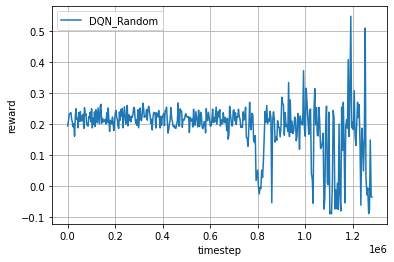

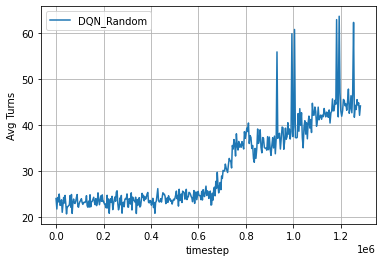

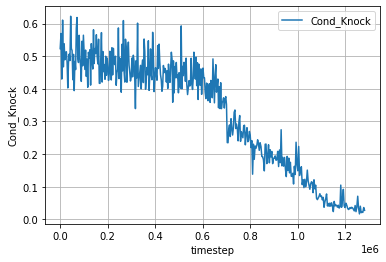

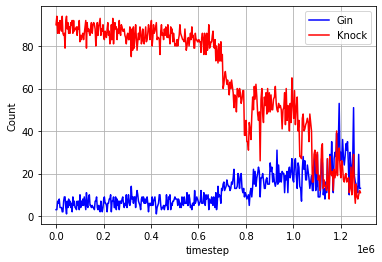

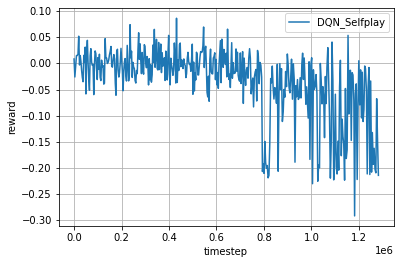

...

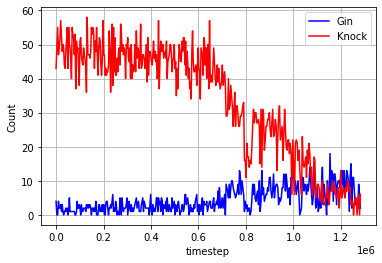

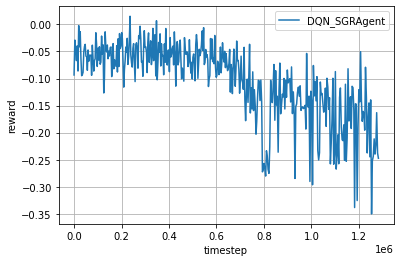

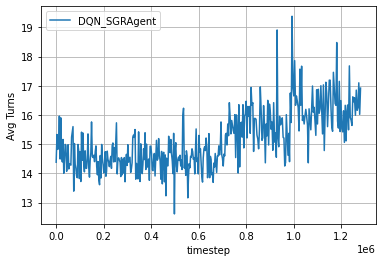

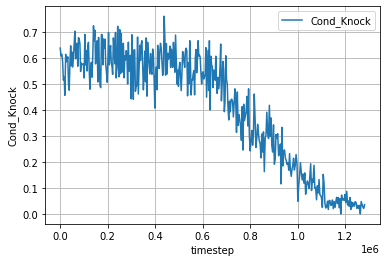

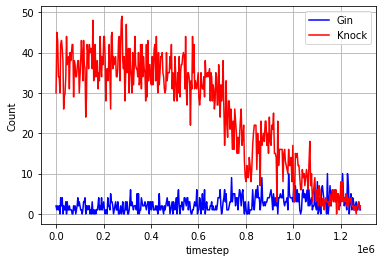

In [ ]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        print('\nSelfplay:')
        rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        reward_self = rewards[0]
        logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        if reward_self > max_reward_self:
            max_reward_self = reward_self
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_self:
            max_knock_self = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

clear_output()

#### Training Plots

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

###### Random

In [ ]:
_, actions = tournament3(random_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 16, 'Knock': 5, 'Other': 79, 'Knock_Possible': 401, 'Avg Turns': 44.98}


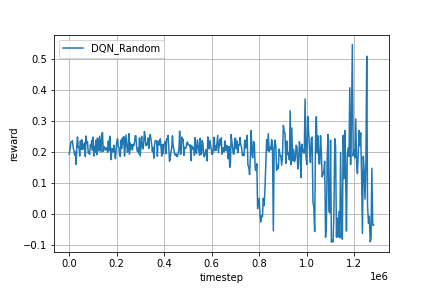

In [ ]:
Image(log_dir + '/rand_fig.png')

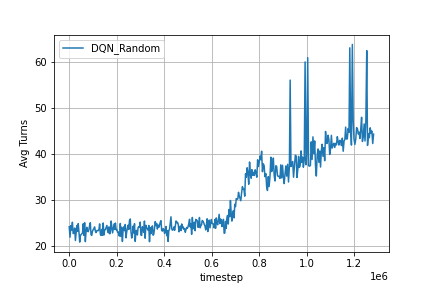

In [ ]:
Image(log_dir + '/rand_fig2.png')

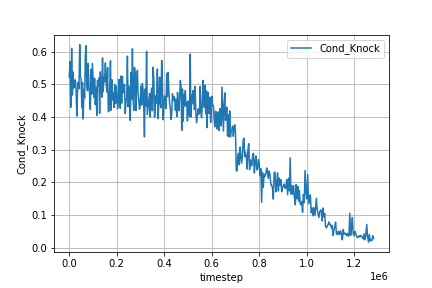

In [ ]:
Image(log_dir + '/rand_fig3.png')

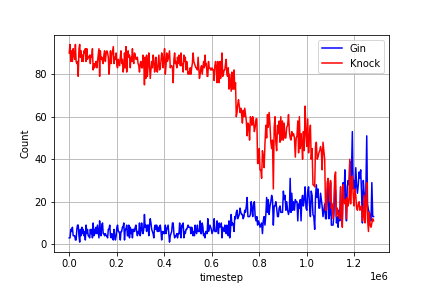

In [ ]:
Image(log_dir + '/rand_fig4.png')

###### Selfplay

In [ ]:
_, actions = tournament3(selfplay_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 3, 'Knock': 2, 'Other': 95, 'Knock_Possible': 102, 'Avg Turns': 20.76}


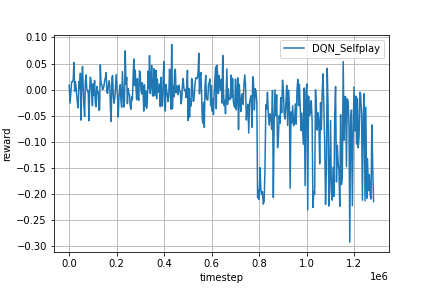

In [ ]:
Image(log_dir + '/self_fig.png')

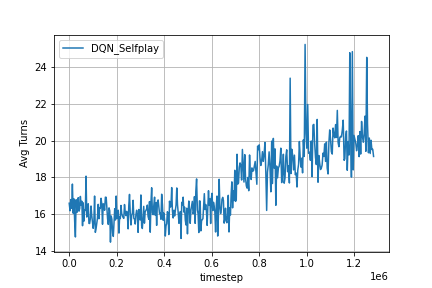

In [ ]:
Image(log_dir + '/self_fig2.png')

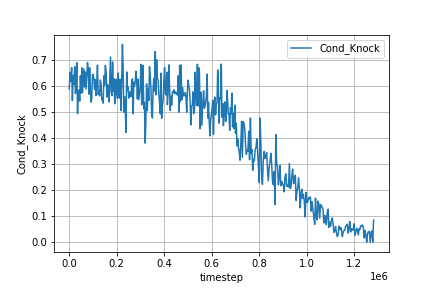

In [ ]:
Image(log_dir + '/self_fig3.png')

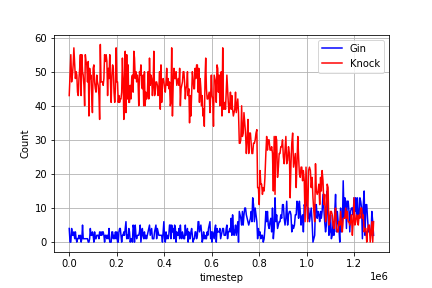

In [ ]:
Image(log_dir + '/self_fig4.png')

###### SGRAgent

In [ ]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 4, 'Knock': 4, 'Other': 92, 'Knock_Possible': 69, 'Avg Turns': 15.4}


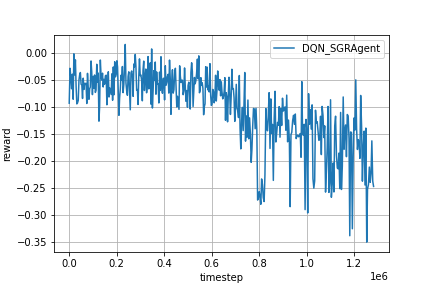

In [ ]:
Image(log_dir + '/sgr_fig.png')

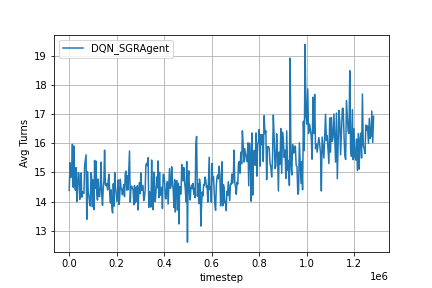

In [ ]:
Image(log_dir + '/sgr_fig2.png')

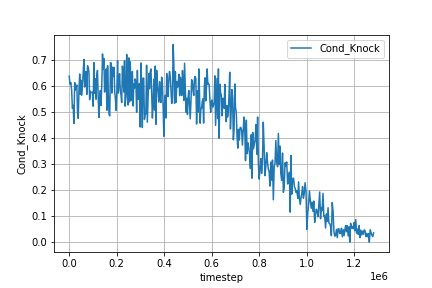

In [ ]:
Image(log_dir + '/sgr_fig3.png')

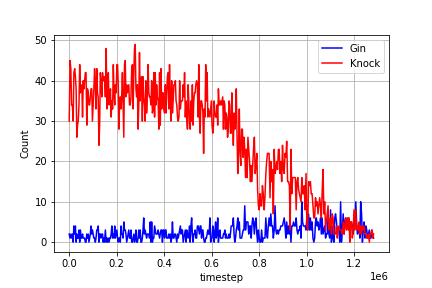

In [ ]:
Image(log_dir + '/sgr_fig4.png')

## 10pct_data

### Parameters

In [ ]:
# Pretrain model selection
state = 'all'
action = 'all'
model_name = '{}/models/{}/{}/all_states_all_actions_2hl_extra_knock_data_80K/model.pt'.format(pth,state,action)
dqn_model_name = '10pct_data'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 520, 110]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 40000  # mahjong_dqn has 100000

# learning rate
learning_rate = 5e-5

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
# default: 100
memory_init_size = 2000

# default: 32
batch_size = 64

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 10

# enable top layer, copy top layer weights, freeze_layers
top_layer = False
copy_top = True
freeze_layers = True

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = True
knock_val = 1

# environment configs
# payoff_fnc = get_payoff_gin_rummy_v8
# cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
cfg = {'seed': 0}

### Environment Initialization

In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

agent2 = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, SGRAgent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent2])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
logger_self = Logger(log_dir, env='self_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False



### Load Pretrained Weights

In [ ]:
checkpoint = torch.load(model_name, map_location=device)
load_checkpoint(checkpoint, agent)
load_checkpoint(checkpoint, agent2)

In [ ]:
# fix layer freezing due to loading
agent.q_estimator.qnet.fc_layers[1].weight.requires_grad = False
agent.q_estimator.qnet.fc_layers[1].bias.requires_grad = False
agent.q_estimator.qnet.fc_layers[3].weight.requires_grad = False
agent.q_estimator.qnet.fc_layers[3].bias.requires_grad = False
agent.q_estimator.qnet.fc_layers[5].weight.requires_grad = False
agent.q_estimator.qnet.fc_layers[5].bias.requires_grad = False
try:
    agent.q_estimator.qnet.fc_layers[7].weight.requires_grad = False
    agent.q_estimator.qnet.fc_layers[7].bias.requires_grad = False
except:
    pass

In [ ]:
# Reload the network so the copy is shallow instead of deep
pretrained_dict = {}
model_dict = agent.q_estimator.qnet.fc_layers.state_dict()
curr_layer = 1
for i in range(len(mlp_layers) + int(top_layer) + int(knock_layer)):
    pretrained_dict['fc_layers.{}.weight'.format(curr_layer)] = model_dict['{}.weight'.format(2*i+1)]
    pretrained_dict['fc_layers.{}.bias'.format(curr_layer)] = model_dict['{}.bias'.format(2*i+1)]
    curr_layer += 2

In [ ]:
# Set new knock layer to identity layer
model_dict_identity = torch.load('{}/models/identity/identity_and_bias_clamp_point1.pth'.format(pth), map_location=device)
pretrained_dict['fc_layers.7.weight'] = model_dict_identity['l1.weight']
pretrained_dict['fc_layers.7.bias'] = model_dict_identity['l1.bias']

In [ ]:
# load pretrained weights
agent.q_estimator.qnet.load_state_dict(pretrained_dict)
agent.target_estimator.qnet.load_state_dict(pretrained_dict)
agent2.q_estimator.qnet.load_state_dict(pretrained_dict)
agent2.target_estimator.qnet.load_state_dict(pretrained_dict)

<All keys matched successfully>

In [ ]:
# unfreeze identity layer
agent.q_estimator.qnet.fc_layers[7].weight.requires_grad = True
agent.target_estimator.qnet.fc_layers[7].weight.requires_grad = True
agent.q_estimator.qnet.fc_layers[7].bias.requires_grad = True
agent.target_estimator.qnet.fc_layers[7].bias.requires_grad = True

### Train

#### Training Loop

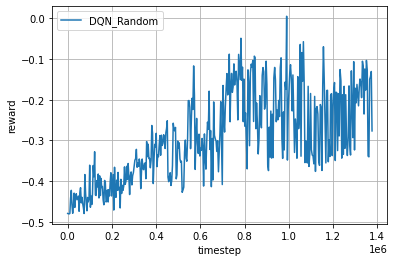

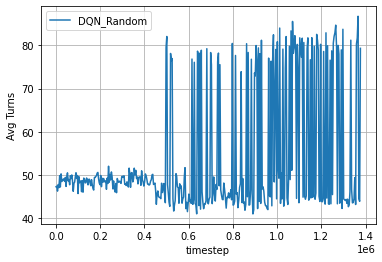

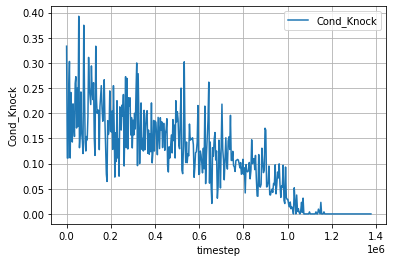

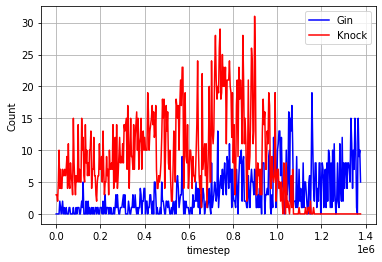

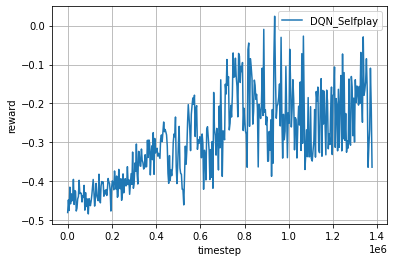

...

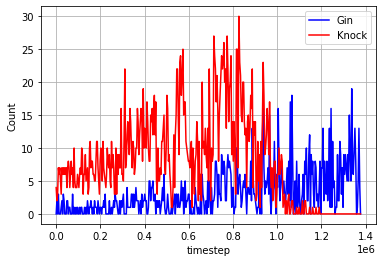

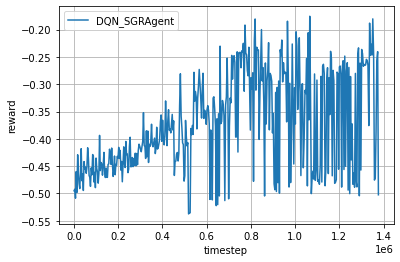

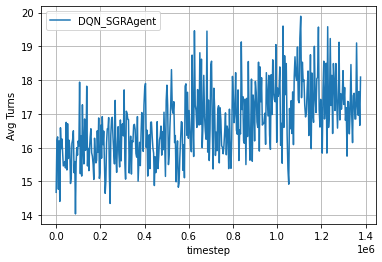

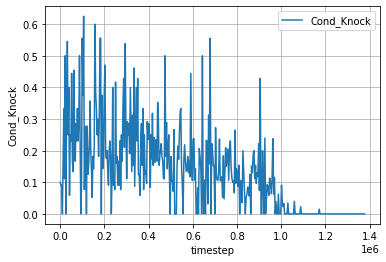

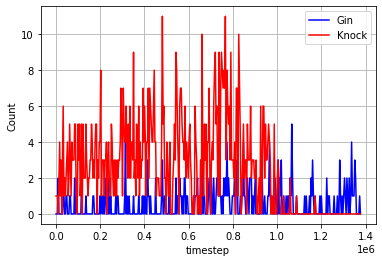

In [ ]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        print('\nSelfplay:')
        rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        reward_self = rewards[0]
        logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        if reward_self > max_reward_self:
            max_reward_self = reward_self
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_self:
            max_knock_self = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

clear_output()

#### Training Plots

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

###### Random

In [ ]:
_, actions = tournament3(random_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 0, 'Other': 100, 'Knock_Possible': 165, 'Avg Turns': 80.95}


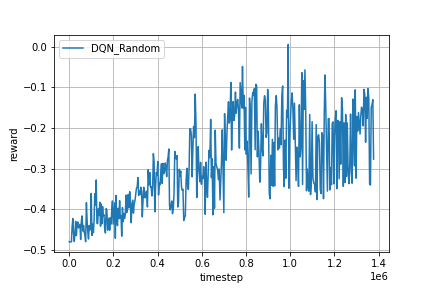

In [ ]:
Image(log_dir + '/rand_fig.png')

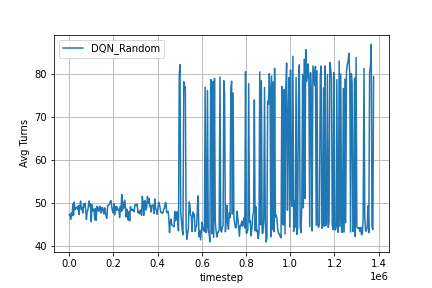

In [ ]:
Image(log_dir + '/rand_fig2.png')

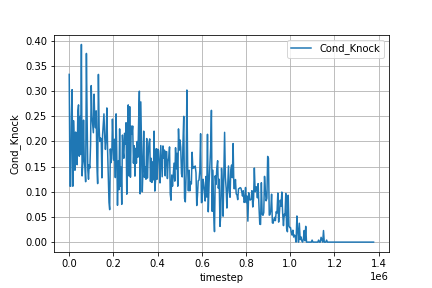

In [ ]:
Image(log_dir + '/rand_fig3.png')

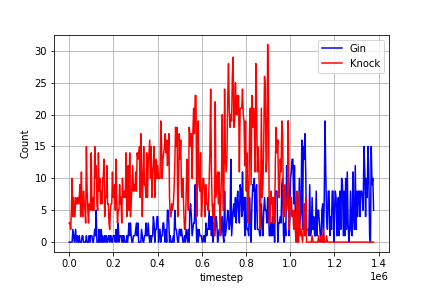

In [ ]:
Image(log_dir + '/rand_fig4.png')

###### Selfplay

In [ ]:
_, actions = tournament3(selfplay_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 2, 'Knock': 0, 'Other': 98, 'Knock_Possible': 96, 'Avg Turns': 60.34}


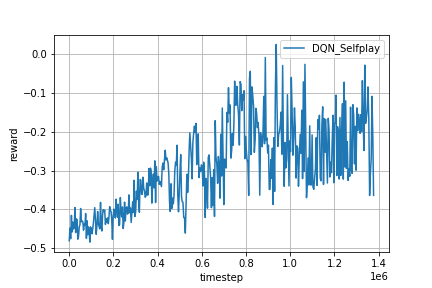

In [ ]:
Image(log_dir + '/self_fig.png')

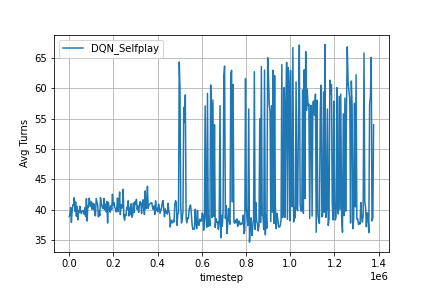

In [ ]:
Image(log_dir + '/self_fig2.png')

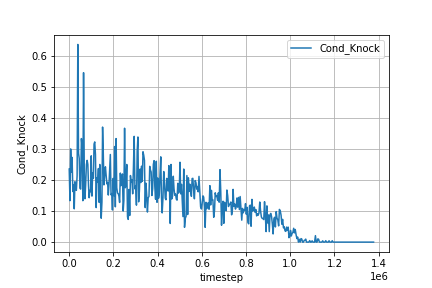

In [ ]:
Image(log_dir + '/self_fig3.png')

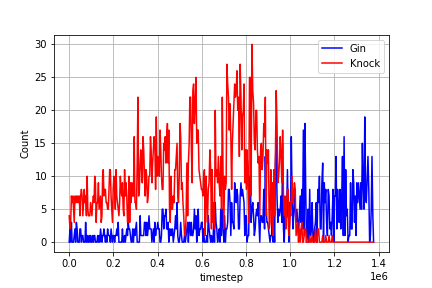

In [ ]:
Image(log_dir + '/self_fig4.png')

###### SGRAgent

In [ ]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 0, 'Other': 100, 'Knock_Possible': 8, 'Avg Turns': 17.59}


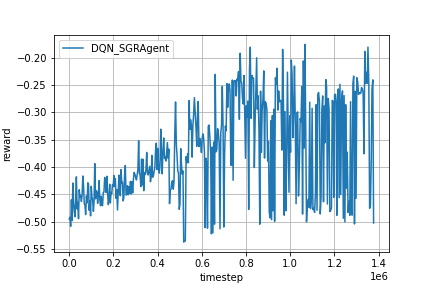

In [ ]:
Image(log_dir + '/sgr_fig.png')

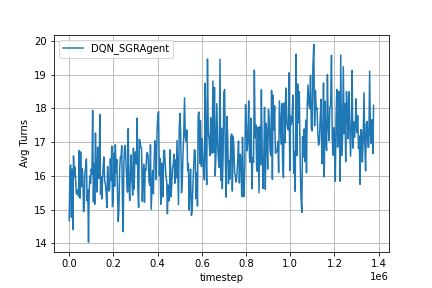

In [ ]:
Image(log_dir + '/sgr_fig2.png')

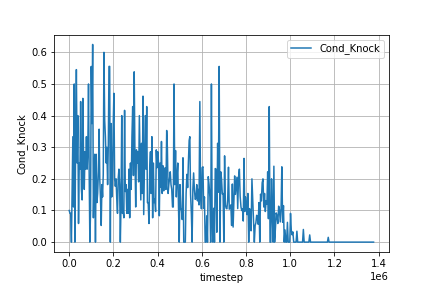

In [ ]:
Image(log_dir + '/sgr_fig3.png')

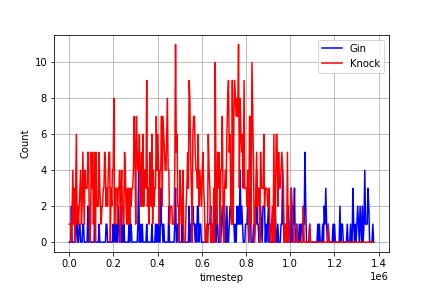

In [ ]:
Image(log_dir + '/sgr_fig4.png')

## 5K_data

### Parameters

In [ ]:
# Pretrain model selection
state = 'all'
action = 'all'
model_name = '{}/models/{}/{}/all_states_all_actions_2hl_extra_knock_data_80K/model.pt'.format(pth,state,action)
dqn_model_name = '5K_data'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 520, 110]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 40000  # mahjong_dqn has 100000

# learning rate
learning_rate = 5e-5

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
# default: 100
memory_init_size = 2000

# default: 32
batch_size = 64

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 10

# enable top layer, copy top layer weights, freeze_layers
top_layer = False
copy_top = True
freeze_layers = True

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = True
knock_val = 1

# environment configs
# payoff_fnc = get_payoff_gin_rummy_v8
# cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
cfg = {'seed': 0}

### Environment Initialization

In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

agent2 = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, SGRAgent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent2])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False


### Load Pretrained Weights

In [ ]:
checkpoint = torch.load(model_name, map_location=device)
load_checkpoint(checkpoint, agent)
load_checkpoint(checkpoint, agent2)

In [ ]:
# fix layer freezing due to loading
agent.q_estimator.qnet.fc_layers[1].weight.requires_grad = False
agent.q_estimator.qnet.fc_layers[1].bias.requires_grad = False
agent.q_estimator.qnet.fc_layers[3].weight.requires_grad = False
agent.q_estimator.qnet.fc_layers[3].bias.requires_grad = False
agent.q_estimator.qnet.fc_layers[5].weight.requires_grad = False
agent.q_estimator.qnet.fc_layers[5].bias.requires_grad = False
try:
    agent.q_estimator.qnet.fc_layers[7].weight.requires_grad = False
    agent.q_estimator.qnet.fc_layers[7].bias.requires_grad = False
except:
    pass

In [ ]:
# Reload the network so the copy is shallow instead of deep
pretrained_dict = {}
model_dict = agent.q_estimator.qnet.fc_layers.state_dict()
curr_layer = 1
for i in range(len(mlp_layers) + int(top_layer) + int(knock_layer)):
    pretrained_dict['fc_layers.{}.weight'.format(curr_layer)] = model_dict['{}.weight'.format(2*i+1)]
    pretrained_dict['fc_layers.{}.bias'.format(curr_layer)] = model_dict['{}.bias'.format(2*i+1)]
    curr_layer += 2

In [ ]:
# Set new knock layer to identity layer
model_dict_identity = torch.load('{}/models/identity/identity_and_bias_clamp_5k.pth'.format(pth), map_location=device)
pretrained_dict['fc_layers.7.weight'] = model_dict_identity['l1.weight']
pretrained_dict['fc_layers.7.bias'] = model_dict_identity['l1.bias']

In [ ]:
# load pretrained weights
agent.q_estimator.qnet.load_state_dict(pretrained_dict)
agent.target_estimator.qnet.load_state_dict(pretrained_dict)
agent2.q_estimator.qnet.load_state_dict(pretrained_dict)
agent2.target_estimator.qnet.load_state_dict(pretrained_dict)

<All keys matched successfully>

In [ ]:
# unfreeze identity layer
agent.q_estimator.qnet.fc_layers[7].weight.requires_grad = True
agent.target_estimator.qnet.fc_layers[7].weight.requires_grad = True
agent.q_estimator.qnet.fc_layers[7].bias.requires_grad = True
agent.target_estimator.qnet.fc_layers[7].bias.requires_grad = True

### Train

#### Training Loop

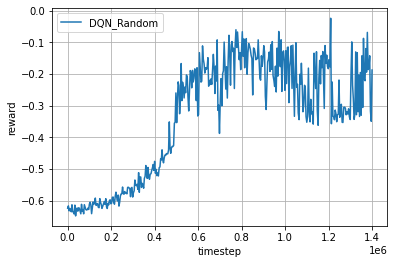

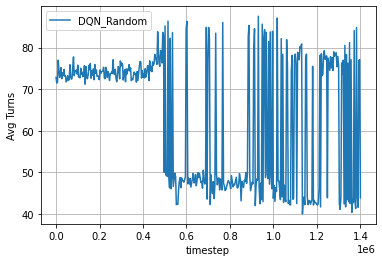

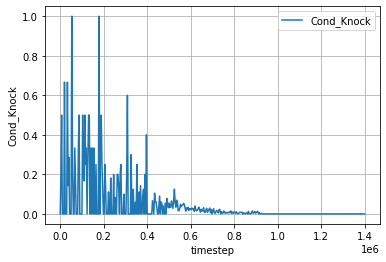

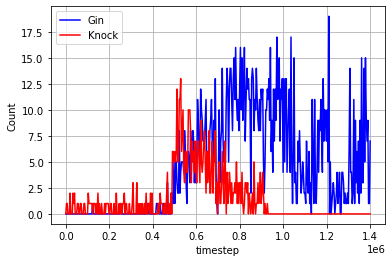

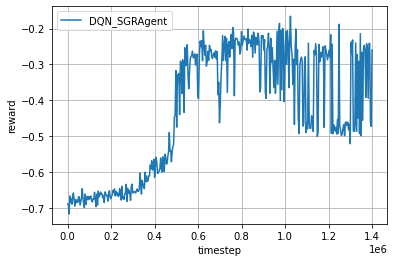

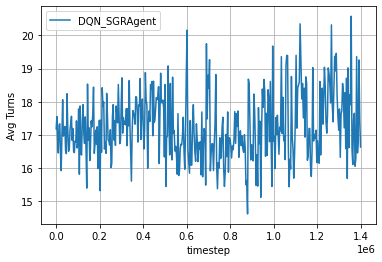

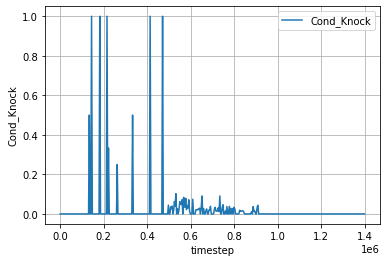

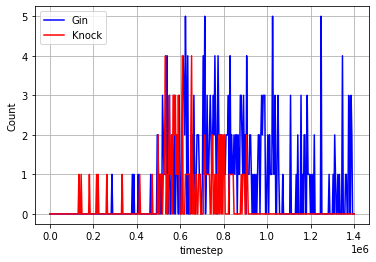

In [ ]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        # print('\nSelfplay:')
        # rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        # reward_self = rewards[0]
        # logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        # if reward_self > max_reward_self:
        #     max_reward_self = reward_self
        #     state_dict = agent.get_state_dict() 
        #     torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        # Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        # if Cond_Knock > max_knock_self:
        #     max_knock_self = Cond_Knock
        #     state_dict = agent.get_state_dict() 
        #     torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
# logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
# logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

clear_output()

#### Training Plots

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

###### Random

In [ ]:
_, actions = tournament3(random_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 10, 'Knock': 0, 'Other': 90, 'Knock_Possible': 359, 'Avg Turns': 42.23}


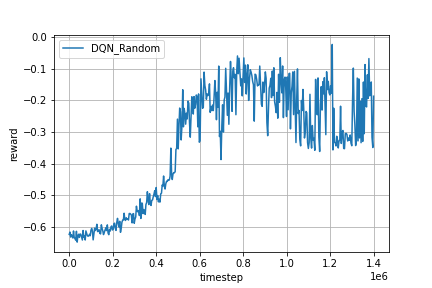

In [ ]:
Image(log_dir + '/rand_fig.png')

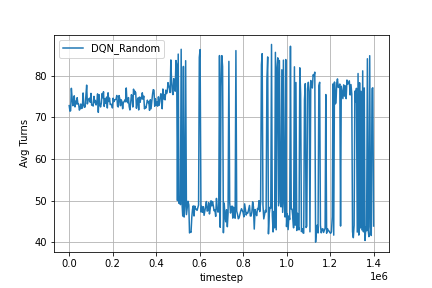

In [ ]:
Image(log_dir + '/rand_fig2.png')

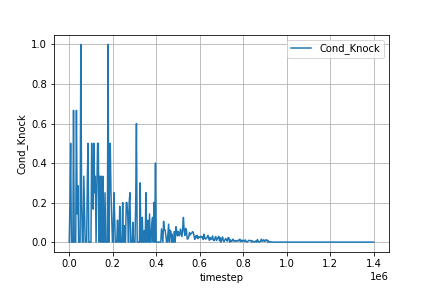

In [ ]:
Image(log_dir + '/rand_fig3.png')

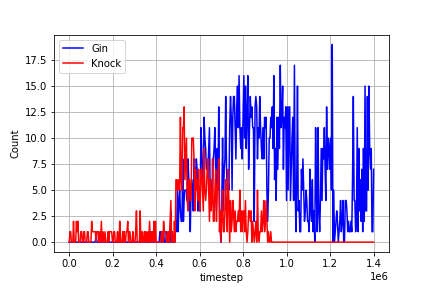

In [ ]:
Image(log_dir + '/rand_fig4.png')

###### Selfplay

In [ ]:
# _, actions = tournament3(selfplay_env, evaluate_num)
# clear_output()
# print(actions)

In [ ]:
# Image(log_dir + '/self_fig.png')

In [ ]:
# Image(log_dir + '/self_fig2.png')

In [ ]:
# Image(log_dir + '/self_fig3.png')

In [ ]:
# Image(log_dir + '/self_fig4.png')

###### SGRAgent

In [ ]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 2, 'Knock': 0, 'Other': 98, 'Knock_Possible': 44, 'Avg Turns': 16.45}


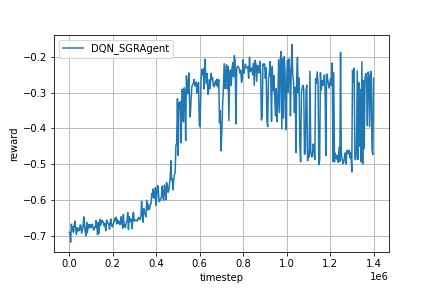

In [ ]:
Image(log_dir + '/sgr_fig.png')

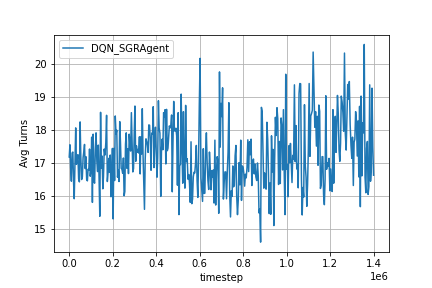

In [ ]:
Image(log_dir + '/sgr_fig2.png')

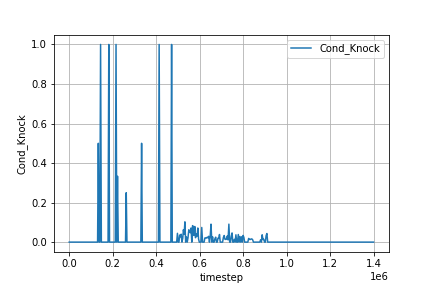

In [ ]:
Image(log_dir + '/sgr_fig3.png')

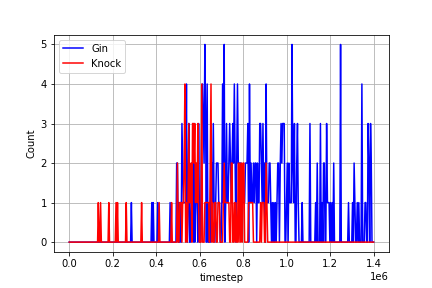

In [ ]:
Image(log_dir + '/sgr_fig4.png')

# final/knock

In [ ]:
dir = 'final/knock'    # root directory name for group of models

## knock_1

### Parameters

In [ ]:
# Pretrain model selection
state = 'all'
action = 'all'
model_name = '{}/models/{}/{}/all_states_all_actions_2hl_extra_knock_data_80K/model.pt'.format(pth,state,action)
dqn_model_name = 'knock_1'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 520, 110]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 40000  # mahjong_dqn has 100000

# learning rate
# learning_rate = 0.00005
learning_rate = 0.00001 # 1e-5

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
memory_init_size = 2000

# default: 32
batch_size = 64

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 10

# enable top layer, copy top layer weights, freeze_layers
top_layer = False
copy_top = True
freeze_layers = True

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = False
knock_layer = True
knock_val = 1

# environment configs
# payoff_fnc = get_payoff_gin_rummy_v8
# cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
cfg = {'seed': 0}

### Environment Initialization

In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

agent2 = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, SGRAgent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent2])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
logger_self = Logger(log_dir, env='self_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False


### Load Pretrained Weights

In [ ]:
checkpoint = torch.load(model_name, map_location=device)
load_checkpoint(checkpoint, agent)
load_checkpoint(checkpoint, agent2)

In [ ]:
# Freeze Agent2
agent2.q_estimator.qnet.fc_layers[1].weight.requires_grad = False
agent2.q_estimator.qnet.fc_layers[1].bias.requires_grad = False
agent2.q_estimator.qnet.fc_layers[3].weight.requires_grad = False
agent2.q_estimator.qnet.fc_layers[3].bias.requires_grad = False
agent2.q_estimator.qnet.fc_layers[5].weight.requires_grad = False
agent2.q_estimator.qnet.fc_layers[5].bias.requires_grad = False

agent2.target_estimator.qnet.fc_layers[1].weight.requires_grad = False
agent2.target_estimator.qnet.fc_layers[1].bias.requires_grad = False
agent2.target_estimator.qnet.fc_layers[3].weight.requires_grad = False
agent2.target_estimator.qnet.fc_layers[3].bias.requires_grad = False
agent2.target_estimator.qnet.fc_layers[5].weight.requires_grad = False
agent2.target_estimator.qnet.fc_layers[5].bias.requires_grad = False

try:
    agent2.q_estimator.qnet.fc_layers[7].weight.requires_grad = False
    agent2.q_estimator.qnet.fc_layers[7].bias.requires_grad = False
    agent2.target_estimator.qnet.fc_layers[7].weight.requires_grad = False
    agent2.target_estimator.qnet.fc_layers[7].bias.requires_grad = False
except:
    pass

### Train

#### Training Loop

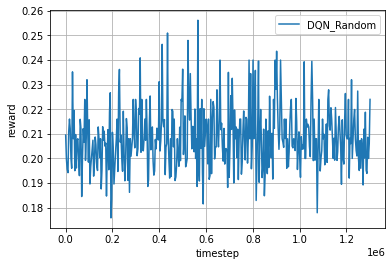

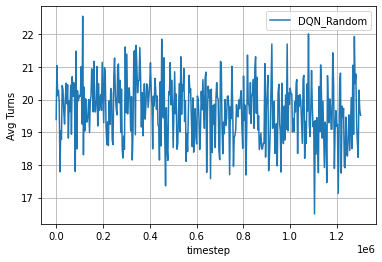

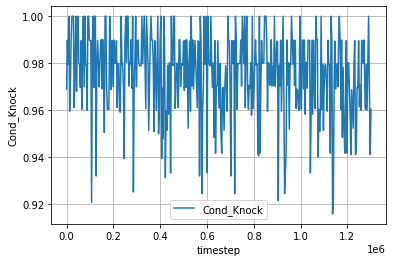

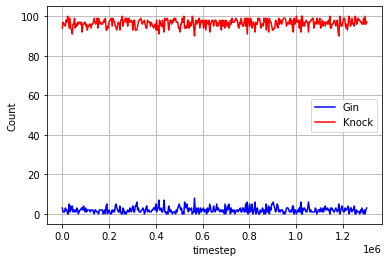

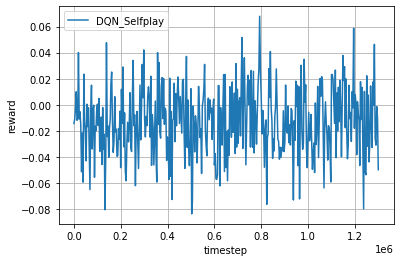

...

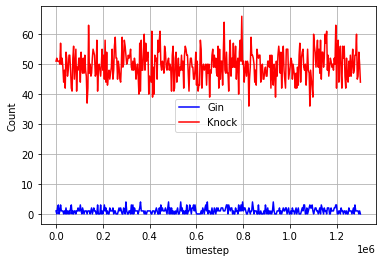

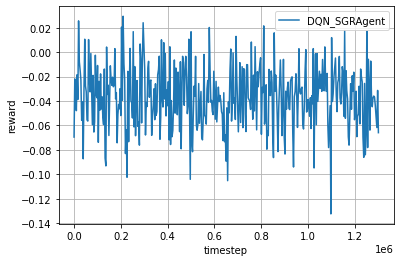

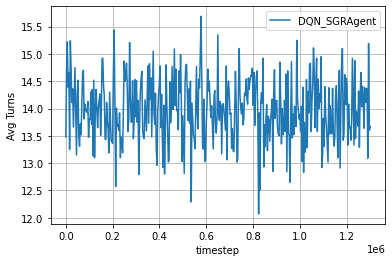

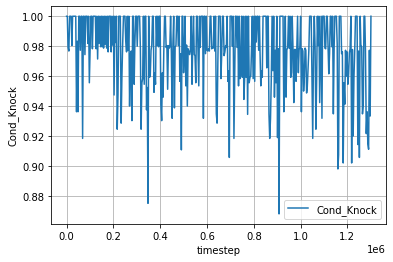

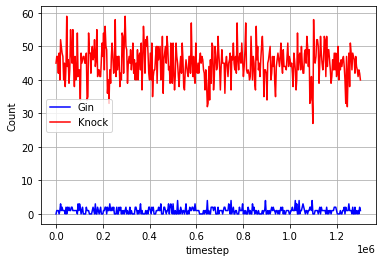

In [ ]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        print('\nSelfplay:')
        rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        reward_self = rewards[0]
        logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        if reward_self > max_reward_self:
            max_reward_self = reward_self
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_self:
            max_knock_self = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

clear_output()

#### Training Plots

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

###### Random

In [ ]:
_, actions = tournament3(random_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 1, 'Knock': 98, 'Other': 1, 'Knock_Possible': 99, 'Avg Turns': 19.72}


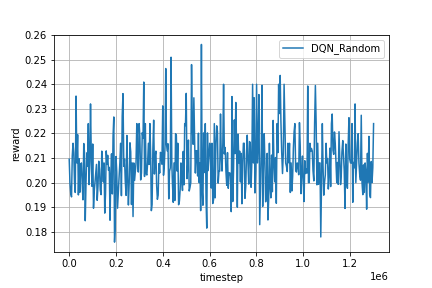

In [ ]:
Image(log_dir + '/rand_fig.png')

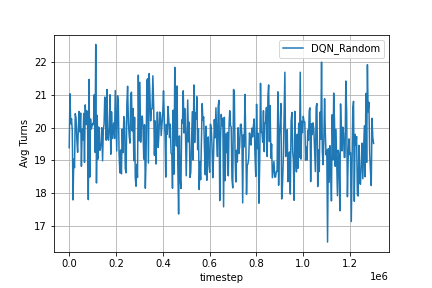

In [ ]:
Image(log_dir + '/rand_fig2.png')

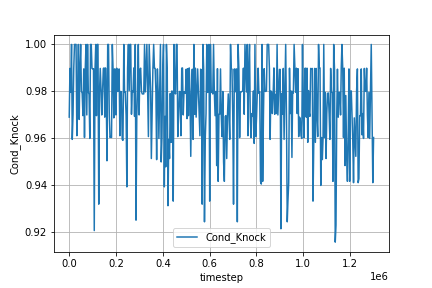

In [ ]:
Image(log_dir + '/rand_fig3.png')

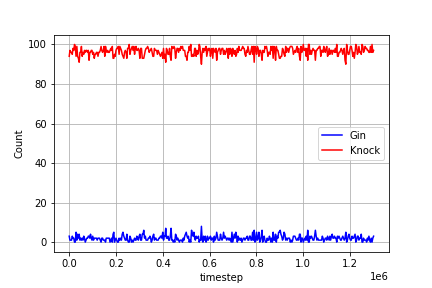

In [ ]:
Image(log_dir + '/rand_fig4.png')

###### Selfplay

In [ ]:
_, actions = tournament3(selfplay_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 45, 'Other': 55, 'Knock_Possible': 46, 'Avg Turns': 14.18}


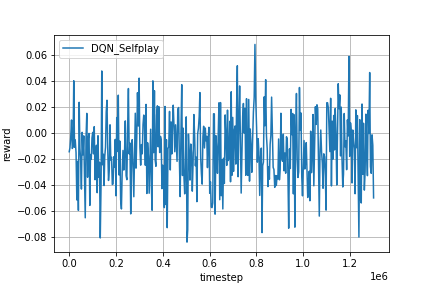

In [ ]:
Image(log_dir + '/self_fig.png')

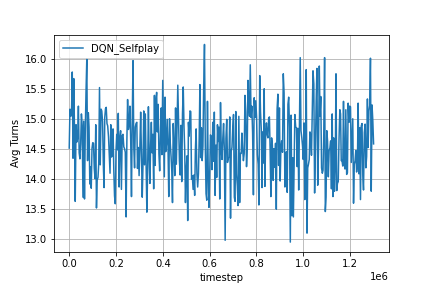

In [ ]:
Image(log_dir + '/self_fig2.png')

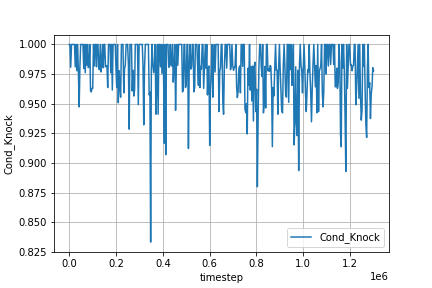

In [ ]:
Image(log_dir + '/self_fig3.png')

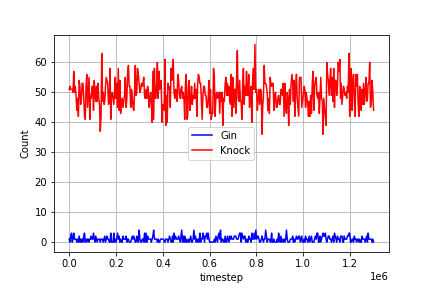

In [ ]:
Image(log_dir + '/self_fig4.png')

###### SGRAgent

In [ ]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 1, 'Knock': 45, 'Other': 54, 'Knock_Possible': 46, 'Avg Turns': 13.75}


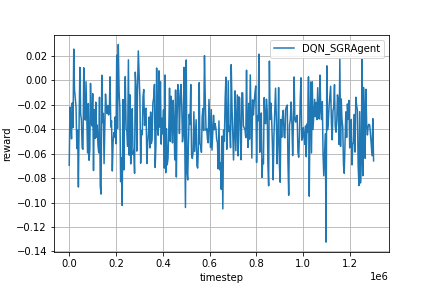

In [ ]:
Image(log_dir + '/sgr_fig.png')

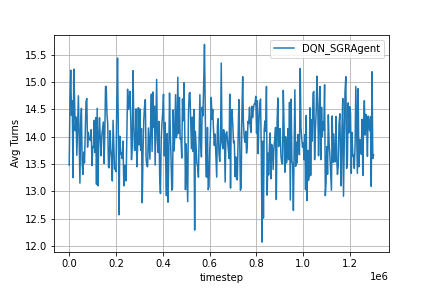

In [ ]:
Image(log_dir + '/sgr_fig2.png')

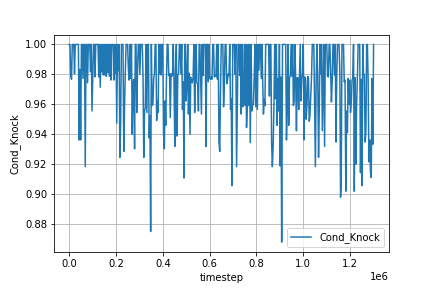

In [ ]:
Image(log_dir + '/sgr_fig3.png')

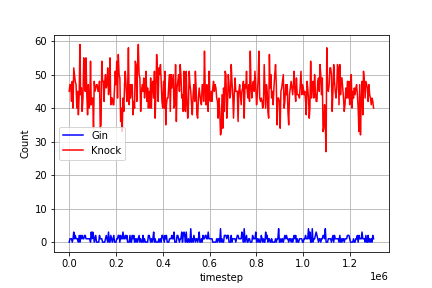

In [ ]:
Image(log_dir + '/sgr_fig4.png')

## knock_pt002

### Parameters

In [ ]:
# Pretrain model selection
state = 'all'
action = 'all'
model_name = '{}/models/{}/{}/all_states_all_actions_2hl_extra_knock_data_80K/model.pt'.format(pth,state,action)
dqn_model_name = 'knock_pt002'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 520, 110]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 20000  # mahjong_dqn has 100000

# learning rate
learning_rate = 5e-5

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
memory_init_size = 2000

# default: 32
batch_size = 64

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 10

# enable top layer, copy top layer weights, freeze_layers
top_layer = False
copy_top = True
freeze_layers = True

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = True
knock_val = 0.002

# environment configs
# payoff_fnc = get_payoff_gin_rummy_v8
# cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
cfg = {'seed': 0}

### Environment Initialization

In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

agent2 = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, SGRAgent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent2])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
logger_self = Logger(log_dir, env='self_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False



### Load Pretrained Weights

In [ ]:
checkpoint = torch.load(model_name, map_location=device)
load_checkpoint(checkpoint, agent)
load_checkpoint(checkpoint, agent2)

In [ ]:
# Freeze Agent2
agent2.q_estimator.qnet.fc_layers[1].weight.requires_grad = False
agent2.q_estimator.qnet.fc_layers[1].bias.requires_grad = False
agent2.q_estimator.qnet.fc_layers[3].weight.requires_grad = False
agent2.q_estimator.qnet.fc_layers[3].bias.requires_grad = False
agent2.q_estimator.qnet.fc_layers[5].weight.requires_grad = False
agent2.q_estimator.qnet.fc_layers[5].bias.requires_grad = False

agent2.target_estimator.qnet.fc_layers[1].weight.requires_grad = False
agent2.target_estimator.qnet.fc_layers[1].bias.requires_grad = False
agent2.target_estimator.qnet.fc_layers[3].weight.requires_grad = False
agent2.target_estimator.qnet.fc_layers[3].bias.requires_grad = False
agent2.target_estimator.qnet.fc_layers[5].weight.requires_grad = False
agent2.target_estimator.qnet.fc_layers[5].bias.requires_grad = False

try:
    agent2.q_estimator.qnet.fc_layers[7].weight.requires_grad = False
    agent2.q_estimator.qnet.fc_layers[7].bias.requires_grad = False
    agent2.target_estimator.qnet.fc_layers[7].weight.requires_grad = False
    agent2.target_estimator.qnet.fc_layers[7].bias.requires_grad = False
except:
    pass

### Train

#### Training Loop

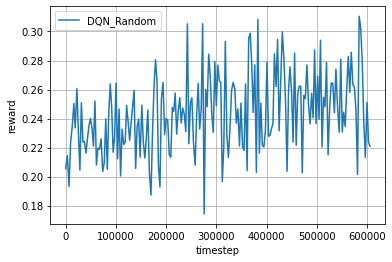

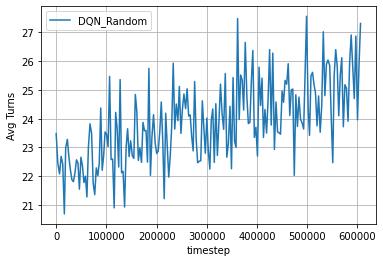

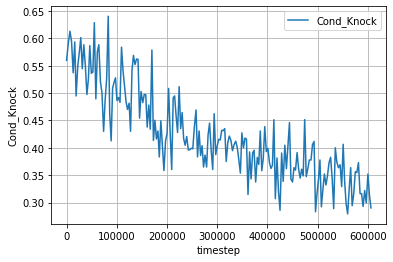

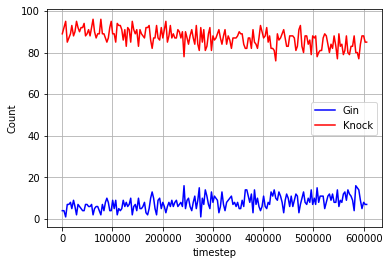

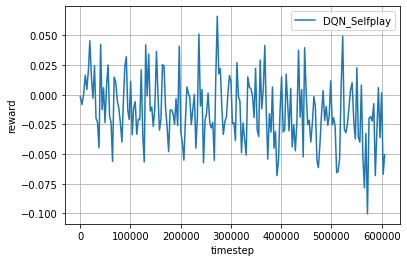

...

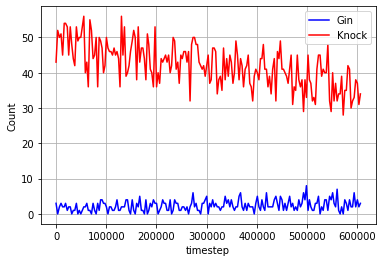

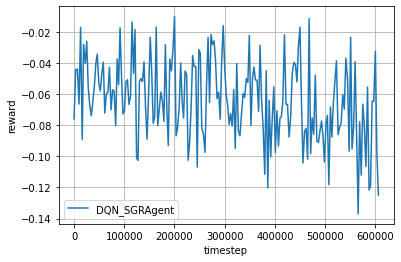

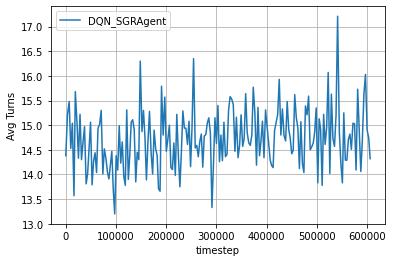

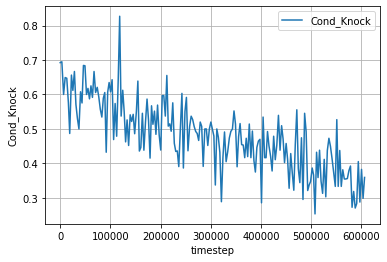

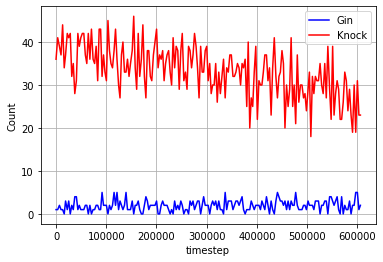

In [ ]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        print('\nSelfplay:')
        rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        reward_self = rewards[0]
        logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        if reward_self > max_reward_self:
            max_reward_self = reward_self
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_self:
            max_knock_self = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

clear_output()

#### Training Plots

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

###### Random

In [ ]:
_, actions = tournament3(random_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 6, 'Knock': 89, 'Other': 5, 'Knock_Possible': 219, 'Avg Turns': 25.89}


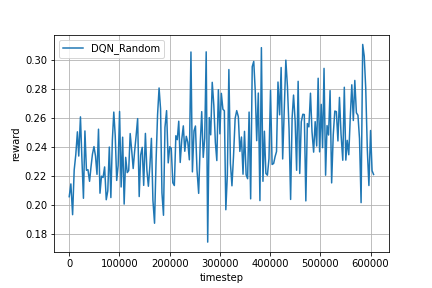

In [ ]:
Image(log_dir + '/rand_fig.png')

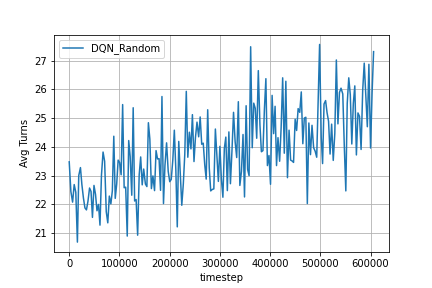

In [ ]:
Image(log_dir + '/rand_fig2.png')

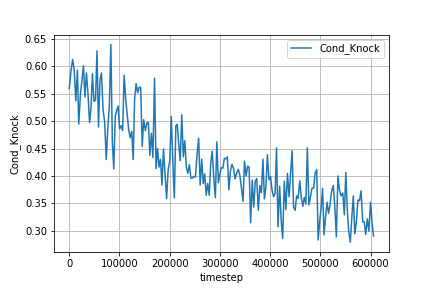

In [ ]:
Image(log_dir + '/rand_fig3.png')

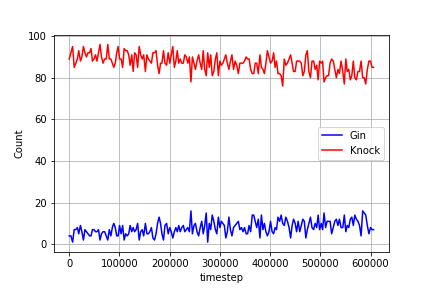

In [ ]:
Image(log_dir + '/rand_fig4.png')

###### Selfplay

In [ ]:
_, actions = tournament3(selfplay_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 2, 'Knock': 32, 'Other': 66, 'Knock_Possible': 105, 'Avg Turns': 17.15}


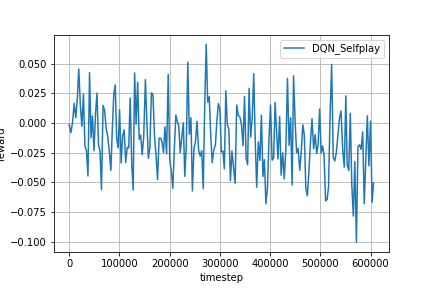

In [ ]:
Image(log_dir + '/self_fig.png')

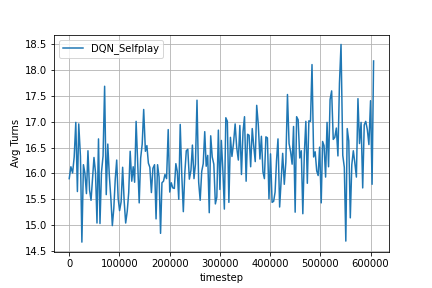

In [ ]:
Image(log_dir + '/self_fig2.png')

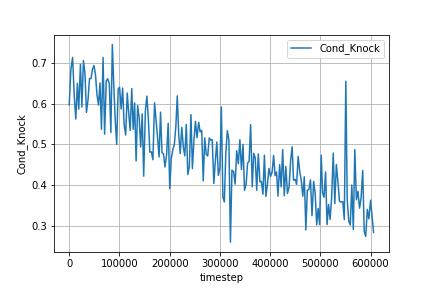

In [ ]:
Image(log_dir + '/self_fig3.png')

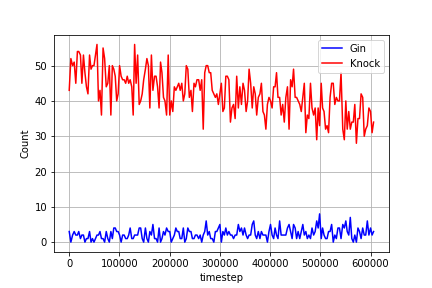

In [ ]:
Image(log_dir + '/self_fig4.png')

###### SGRAgent

In [ ]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 21, 'Other': 79, 'Knock_Possible': 72, 'Avg Turns': 15.25}


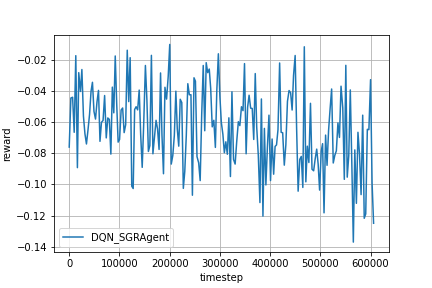

In [ ]:
Image(log_dir + '/sgr_fig.png')

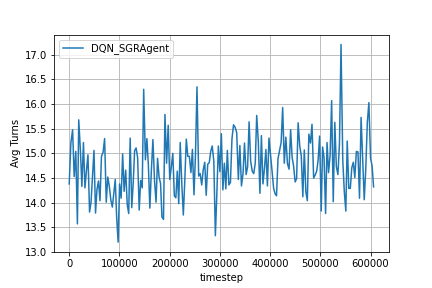

In [ ]:
Image(log_dir + '/sgr_fig2.png')

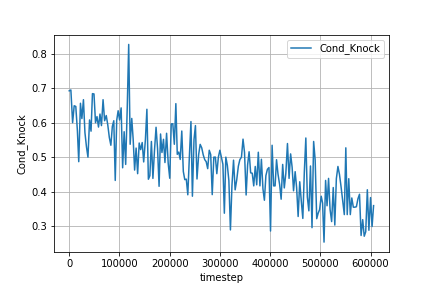

In [ ]:
Image(log_dir + '/sgr_fig3.png')

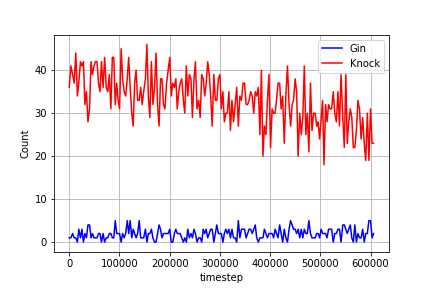

In [ ]:
Image(log_dir + '/sgr_fig4.png')

## knock_pt02

### Parameters

In [ ]:
# Pretrain model selection
state = 'all'
action = 'all'
model_name = '{}/models/{}/{}/all_states_all_actions_2hl_extra_knock_data_80K/model.pt'.format(pth,state,action)
dqn_model_name = 'knock_pt02'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 520, 110]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 20000  # mahjong_dqn has 100000

# learning rate
learning_rate = 5e-5

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
memory_init_size = 2000

# default: 32
batch_size = 64

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 10

# enable top layer, copy top layer weights, freeze_layers
top_layer = False
copy_top = True
freeze_layers = True

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = True
knock_val = 0.02

# environment configs
# payoff_fnc = get_payoff_gin_rummy_v8
# cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
cfg = {'seed': 0}

### Environment Initialization

In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

agent2 = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, SGRAgent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent2])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
logger_self = Logger(log_dir, env='self_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False



### Load Pretrained Weights

In [ ]:
checkpoint = torch.load(model_name, map_location=device)
load_checkpoint(checkpoint, agent)
load_checkpoint(checkpoint, agent2)

In [ ]:
# Freeze Agent2
agent2.q_estimator.qnet.fc_layers[1].weight.requires_grad = False
agent2.q_estimator.qnet.fc_layers[1].bias.requires_grad = False
agent2.q_estimator.qnet.fc_layers[3].weight.requires_grad = False
agent2.q_estimator.qnet.fc_layers[3].bias.requires_grad = False
agent2.q_estimator.qnet.fc_layers[5].weight.requires_grad = False
agent2.q_estimator.qnet.fc_layers[5].bias.requires_grad = False

agent2.target_estimator.qnet.fc_layers[1].weight.requires_grad = False
agent2.target_estimator.qnet.fc_layers[1].bias.requires_grad = False
agent2.target_estimator.qnet.fc_layers[3].weight.requires_grad = False
agent2.target_estimator.qnet.fc_layers[3].bias.requires_grad = False
agent2.target_estimator.qnet.fc_layers[5].weight.requires_grad = False
agent2.target_estimator.qnet.fc_layers[5].bias.requires_grad = False

try:
    agent2.q_estimator.qnet.fc_layers[7].weight.requires_grad = False
    agent2.q_estimator.qnet.fc_layers[7].bias.requires_grad = False
    agent2.target_estimator.qnet.fc_layers[7].weight.requires_grad = False
    agent2.target_estimator.qnet.fc_layers[7].bias.requires_grad = False
except:
    pass

### Train

#### Training Loop

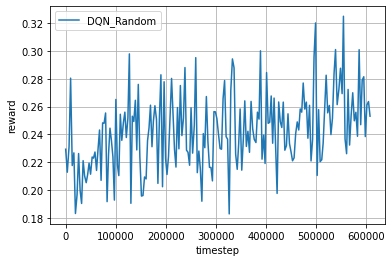

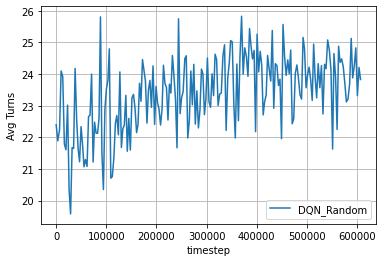

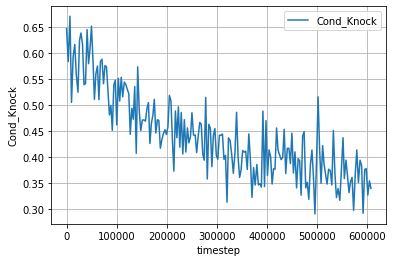

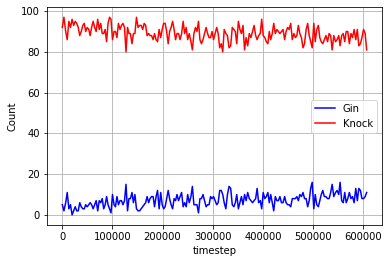

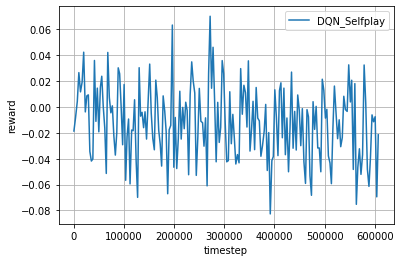

...

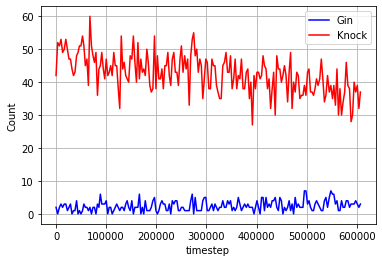

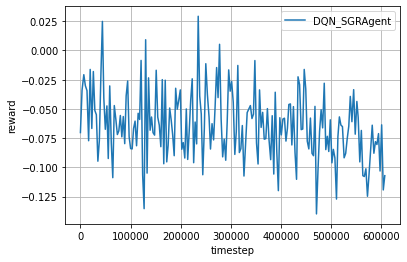

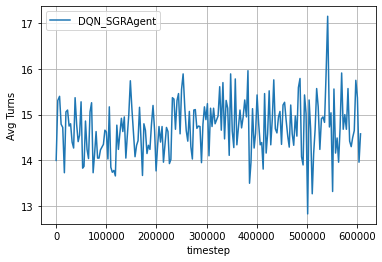

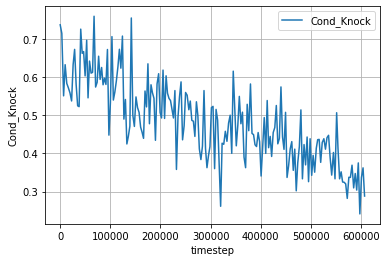

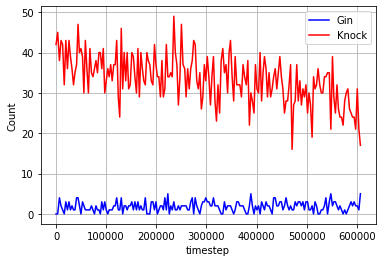

In [ ]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        print('\nSelfplay:')
        rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        reward_self = rewards[0]
        logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        if reward_self > max_reward_self:
            max_reward_self = reward_self
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_self:
            max_knock_self = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

clear_output()

#### Training Plots

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

###### Random

In [ ]:
_, actions = tournament3(random_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 13, 'Knock': 82, 'Other': 5, 'Knock_Possible': 255, 'Avg Turns': 26.61}


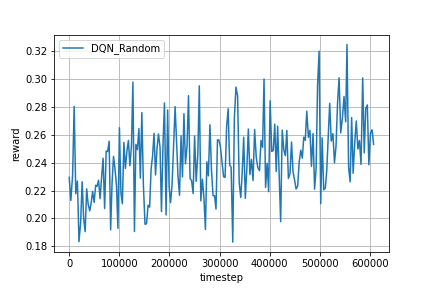

In [ ]:
Image(log_dir + '/rand_fig.png')

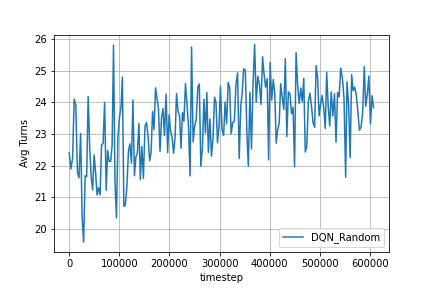

In [ ]:
Image(log_dir + '/rand_fig2.png')

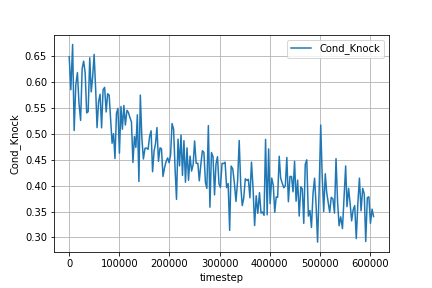

In [ ]:
Image(log_dir + '/rand_fig3.png')

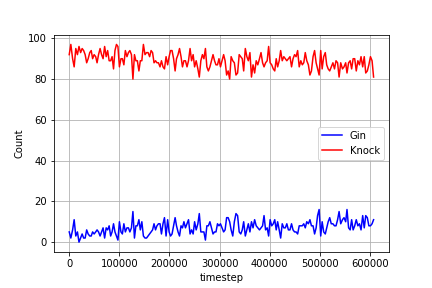

In [ ]:
Image(log_dir + '/rand_fig4.png')

###### Selfplay

In [ ]:
_, actions = tournament3(selfplay_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 2, 'Knock': 32, 'Other': 66, 'Knock_Possible': 94, 'Avg Turns': 16.49}


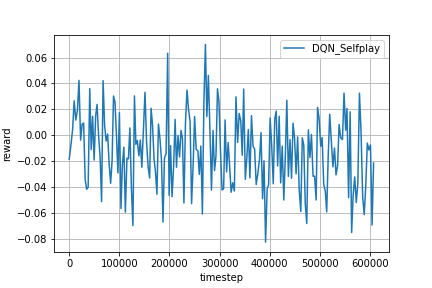

In [ ]:
Image(log_dir + '/self_fig.png')

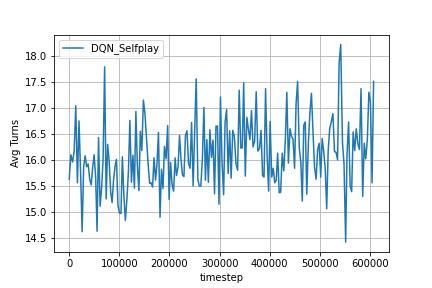

In [ ]:
Image(log_dir + '/self_fig2.png')

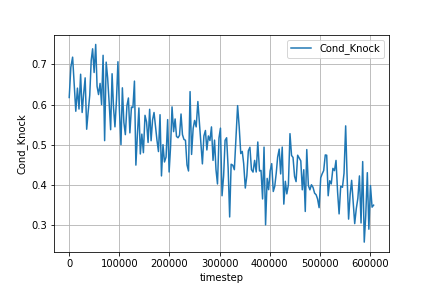

In [ ]:
Image(log_dir + '/self_fig3.png')

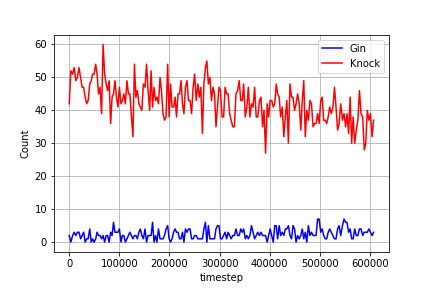

In [ ]:
Image(log_dir + '/self_fig4.png')

###### SGRAgent

In [ ]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 1, 'Knock': 25, 'Other': 74, 'Knock_Possible': 68, 'Avg Turns': 15.66}


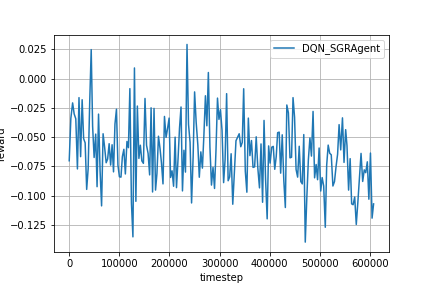

In [ ]:
Image(log_dir + '/sgr_fig.png')

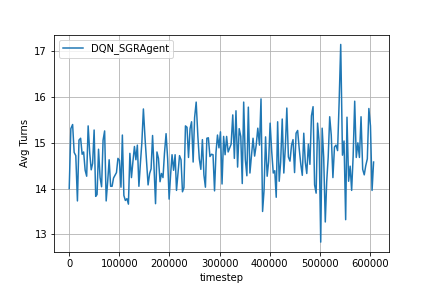

In [ ]:
Image(log_dir + '/sgr_fig2.png')

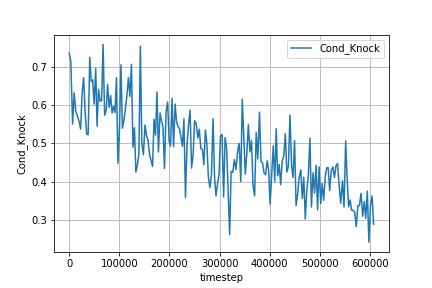

In [ ]:
Image(log_dir + '/sgr_fig3.png')

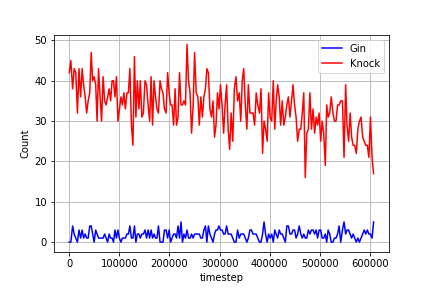

In [ ]:
Image(log_dir + '/sgr_fig4.png')

## knock_pt2

### Parameters

In [ ]:
# Pretrain model selection
state = 'all'
action = 'all'
model_name = '{}/models/{}/{}/all_states_all_actions_2hl_extra_knock_data_80K/model.pt'.format(pth,state,action)
dqn_model_name = 'knock_pt2'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 520, 110]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 20000  # mahjong_dqn has 100000

# learning rate
learning_rate = 5e-5

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
memory_init_size = 2000

# default: 32
batch_size = 64

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 10

# enable top layer, copy top layer weights, freeze_layers
top_layer = False
copy_top = True
freeze_layers = True

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = True
knock_val = 0.2

# environment configs
# payoff_fnc = get_payoff_gin_rummy_v8
# cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
cfg = {'seed': 0}

### Environment Initialization

In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

agent2 = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, SGRAgent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent2])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
logger_self = Logger(log_dir, env='self_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False


### Load Pretrained Weights

In [ ]:
checkpoint = torch.load(model_name, map_location=device)
load_checkpoint(checkpoint, agent)
load_checkpoint(checkpoint, agent2)

In [ ]:
# Freeze Agent2
agent2.q_estimator.qnet.fc_layers[1].weight.requires_grad = False
agent2.q_estimator.qnet.fc_layers[1].bias.requires_grad = False
agent2.q_estimator.qnet.fc_layers[3].weight.requires_grad = False
agent2.q_estimator.qnet.fc_layers[3].bias.requires_grad = False
agent2.q_estimator.qnet.fc_layers[5].weight.requires_grad = False
agent2.q_estimator.qnet.fc_layers[5].bias.requires_grad = False

agent2.target_estimator.qnet.fc_layers[1].weight.requires_grad = False
agent2.target_estimator.qnet.fc_layers[1].bias.requires_grad = False
agent2.target_estimator.qnet.fc_layers[3].weight.requires_grad = False
agent2.target_estimator.qnet.fc_layers[3].bias.requires_grad = False
agent2.target_estimator.qnet.fc_layers[5].weight.requires_grad = False
agent2.target_estimator.qnet.fc_layers[5].bias.requires_grad = False

try:
    agent2.q_estimator.qnet.fc_layers[7].weight.requires_grad = False
    agent2.q_estimator.qnet.fc_layers[7].bias.requires_grad = False
    agent2.target_estimator.qnet.fc_layers[7].weight.requires_grad = False
    agent2.target_estimator.qnet.fc_layers[7].bias.requires_grad = False
except:
    pass

### Train

#### Training Loop

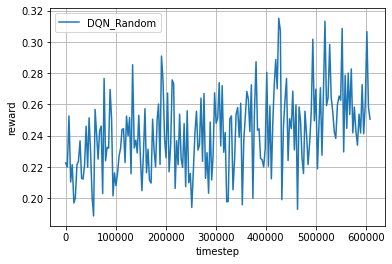

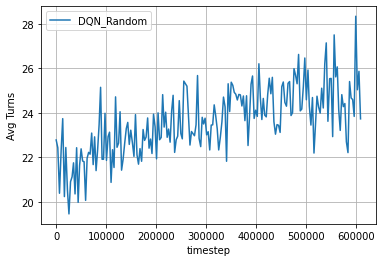

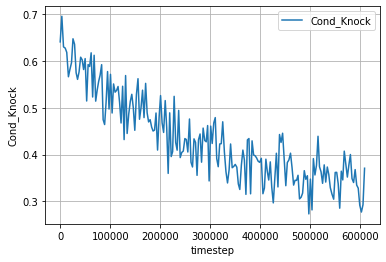

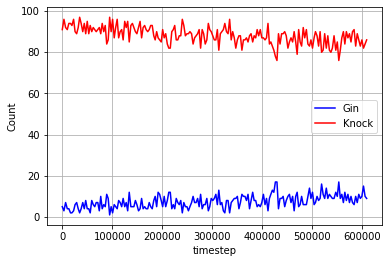

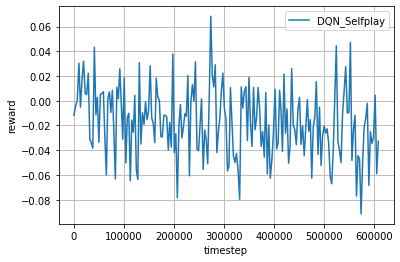

...

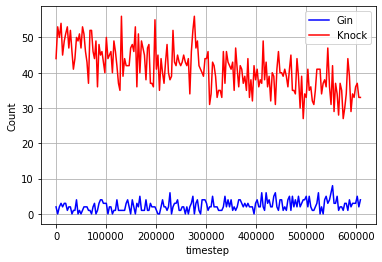

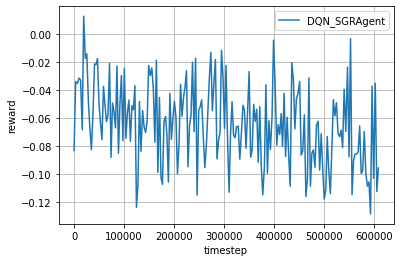

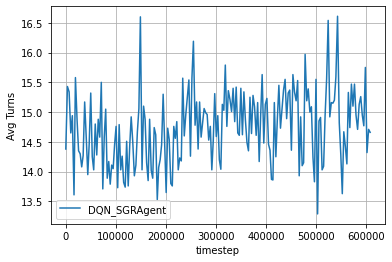

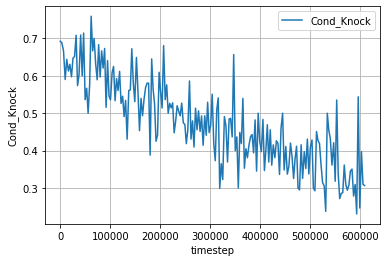

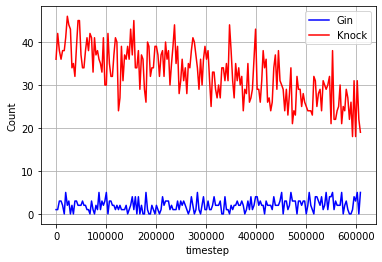

In [ ]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        print('\nSelfplay:')
        rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        reward_self = rewards[0]
        logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        if reward_self > max_reward_self:
            max_reward_self = reward_self
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_self:
            max_knock_self = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

clear_output()

#### Training Plots

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

###### Random

In [ ]:
_, actions = tournament3(random_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 9, 'Knock': 86, 'Other': 5, 'Knock_Possible': 227, 'Avg Turns': 24.77}


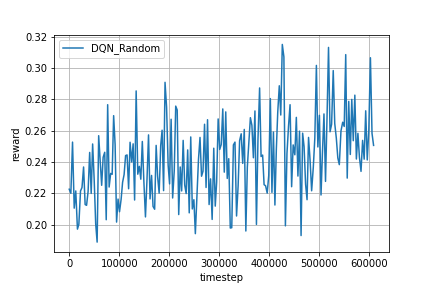

In [ ]:
Image(log_dir + '/rand_fig.png')

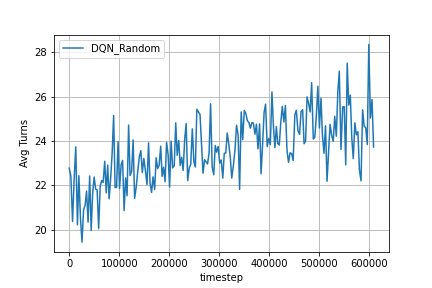

In [ ]:
Image(log_dir + '/rand_fig2.png')

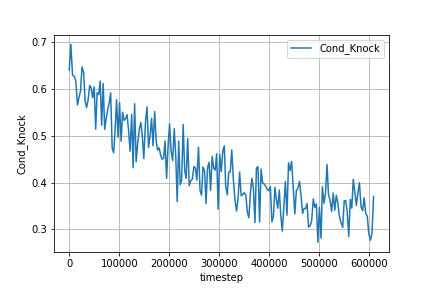

In [ ]:
Image(log_dir + '/rand_fig3.png')

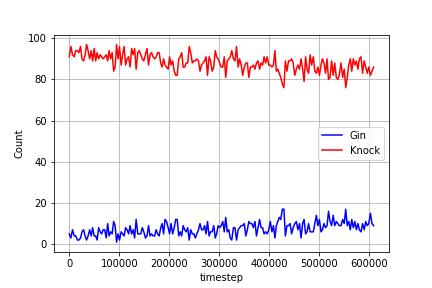

In [ ]:
Image(log_dir + '/rand_fig4.png')

###### Selfplay

In [ ]:
_, actions = tournament3(selfplay_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 2, 'Knock': 38, 'Other': 60, 'Knock_Possible': 105, 'Avg Turns': 17.13}


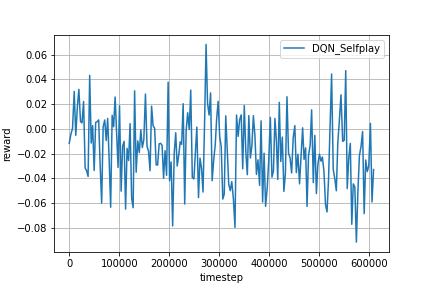

In [ ]:
Image(log_dir + '/self_fig.png')

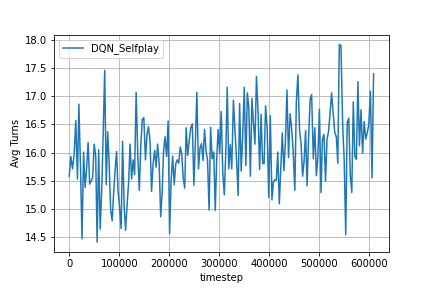

In [ ]:
Image(log_dir + '/self_fig2.png')

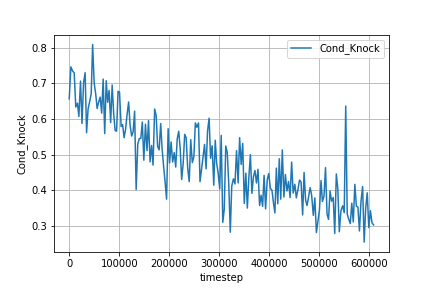

In [ ]:
Image(log_dir + '/self_fig3.png')

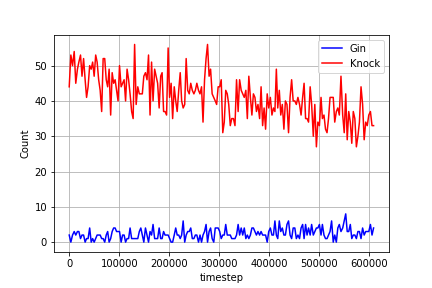

In [ ]:
Image(log_dir + '/self_fig4.png')

###### SGRAgent

In [ ]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 22, 'Other': 78, 'Knock_Possible': 80, 'Avg Turns': 16.15}


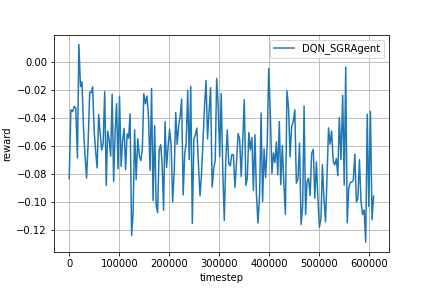

In [ ]:
Image(log_dir + '/sgr_fig.png')

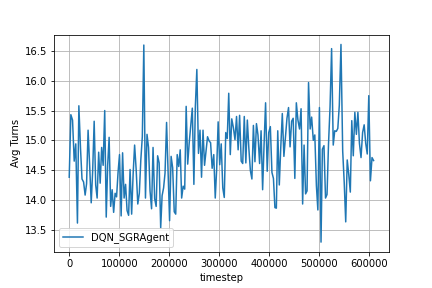

In [ ]:
Image(log_dir + '/sgr_fig2.png')

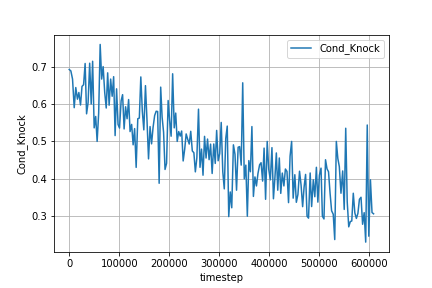

In [ ]:
Image(log_dir + '/sgr_fig3.png')

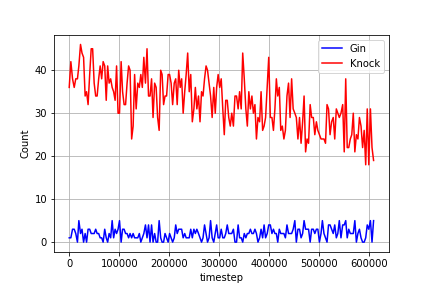

In [ ]:
Image(log_dir + '/sgr_fig4.png')

## knock_2

### Parameters

In [ ]:
# Pretrain model selection
state = 'all'
action = 'all'
model_name = '{}/models/{}/{}/all_states_all_actions_2hl_extra_knock_data_80K/model.pt'.format(pth,state,action)
dqn_model_name = 'knock_2'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
isDQN = False

# mlp layers 
mlp_layers = [520, 520, 110]

# Set the iterations numbers and how frequently we evaluate/save plot
evaluate_every = 100
evaluate_num = 100  # mahjong_dqn has 1000
episode_num = 20000  # mahjong_dqn has 100000

# learning rate
learning_rate = 5e-5

# replay_memory_size
# default: 20000
replay_memory_size = 20000

# The initial memory size
memory_init_size = 2000

# default: 32
batch_size = 64

# update_target_estimator_every
# default: 1000
update_target_estimator_every = 1000

# Train the agent every X steps
train_every = 10

# enable top layer, copy top layer weights, freeze_layers
top_layer = False
copy_top = True
freeze_layers = True

# Batch Normalization
batch_norm = False

# Knock Layer
knock_layer = True
knock_val = 2

# environment configs
# payoff_fnc = get_payoff_gin_rummy_v8
# cfg = {'seed': 0, 'payoff_fnc': payoff_fnc}
cfg = {'seed': 0}

### Environment Initialization

In [ ]:
from tensorflow.keras.backend import clear_session
clear_session()

# Make environments
env = rlcard.make('gin-rummy', config=cfg)

random_env = rlcard.make('gin-rummy', config=cfg)
selfplay_env = rlcard.make('gin-rummy', config=cfg)
SGRAgent_env = rlcard.make('gin-rummy', config=cfg)
env.game.settings.print_settings()

# The paths for saving the logs and learning curves
log_dir = './plots/dqn/{}/{}'.format(dir, dqn_model_name)

# Set a global seed
set_global_seed(0)

random_agent = RandomAgent(action_num=random_env.action_num)
SGRAgent = SimpleGinRummyAgent(action_num=SGRAgent_env.action_num)

agent = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

agent2 = DQNAgent(scope='dqn',
                 replay_memory_size=replay_memory_size,
                 replay_memory_init_size=memory_init_size,       # default: 100
                 update_target_estimator_every=update_target_estimator_every,
                 discount_factor=0.99,
                 epsilon_start=1.0,
                 epsilon_end=0.1,
                 epsilon_decay_steps=20000,
                 batch_size=batch_size,                      # default: 32
                 action_num=env.action_num,
                 state_shape=env.state_shape,
                 train_every=train_every,            # default: 1
                 mlp_layers=mlp_layers,
                 learning_rate=learning_rate,        # default: 0.00005 (5e-5)
                 device=device,
                 batch_norm=batch_norm,
                 knock_layer=knock_layer,
                 top_layer=top_layer)

# Training env
env.set_agents([agent, SGRAgent])

# random env
random_env.set_agents([agent, random_agent])

# selfplay env
selfplay_env.set_agents([agent, agent2])

# SGRAgent env 
SGRAgent_env.set_agents([agent, SGRAgent])

# Init a Logger to plot the learning curve
# logger = Logger(log_dir)
logger_rand = Logger(log_dir, env='rand_')
logger_self = Logger(log_dir, env='self_')
logger_sgr = Logger(log_dir, env='sgr_')

========== Settings ==========
scorer_name=GinRummyScorer
dealer_for_round=DealerForRound.Random
stockpile_dead_card_count=2
going_out_deadwood_count=10
max_drawn_card_count=52
is_allowed_knock=True
is_allowed_gin=True
is_allowed_pick_up_discard=True
is_allowed_to_discard_picked_up_card=False
is_always_knock=False
is_south_never_knocks=False


### Load Pretrained Weights

In [ ]:
checkpoint = torch.load(model_name, map_location=device)
load_checkpoint(checkpoint, agent)
load_checkpoint(checkpoint, agent2)

In [ ]:
# Freeze Agent2
agent2.q_estimator.qnet.fc_layers[1].weight.requires_grad = False
agent2.q_estimator.qnet.fc_layers[1].bias.requires_grad = False
agent2.q_estimator.qnet.fc_layers[3].weight.requires_grad = False
agent2.q_estimator.qnet.fc_layers[3].bias.requires_grad = False
agent2.q_estimator.qnet.fc_layers[5].weight.requires_grad = False
agent2.q_estimator.qnet.fc_layers[5].bias.requires_grad = False

agent2.target_estimator.qnet.fc_layers[1].weight.requires_grad = False
agent2.target_estimator.qnet.fc_layers[1].bias.requires_grad = False
agent2.target_estimator.qnet.fc_layers[3].weight.requires_grad = False
agent2.target_estimator.qnet.fc_layers[3].bias.requires_grad = False
agent2.target_estimator.qnet.fc_layers[5].weight.requires_grad = False
agent2.target_estimator.qnet.fc_layers[5].bias.requires_grad = False

try:
    agent2.q_estimator.qnet.fc_layers[7].weight.requires_grad = False
    agent2.q_estimator.qnet.fc_layers[7].bias.requires_grad = False
    agent2.target_estimator.qnet.fc_layers[7].weight.requires_grad = False
    agent2.target_estimator.qnet.fc_layers[7].bias.requires_grad = False
except:
    pass

### Train

#### Training Loop

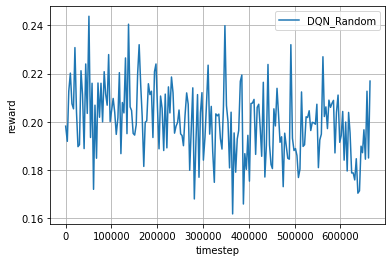

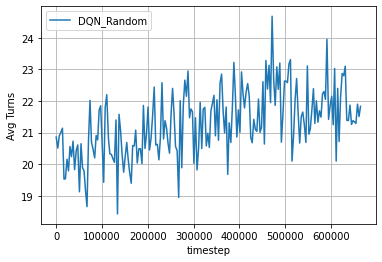

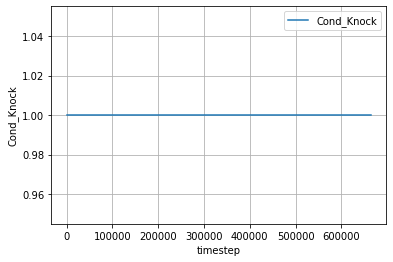

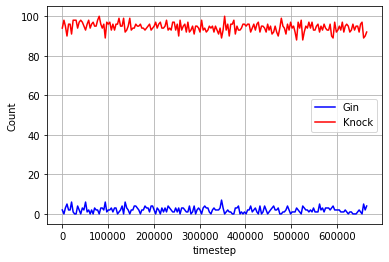

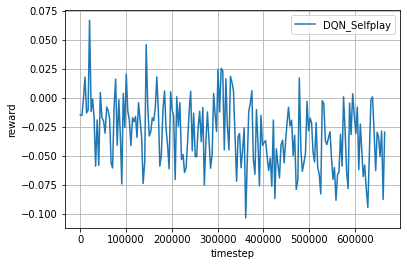

...

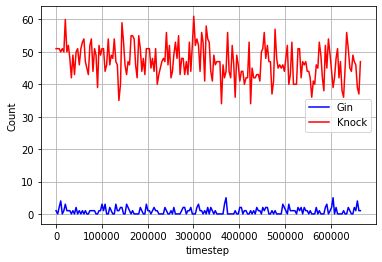

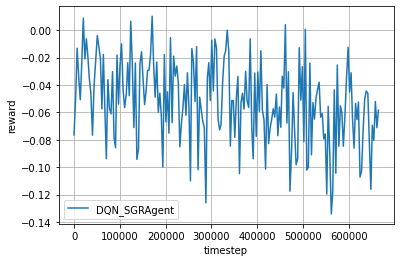

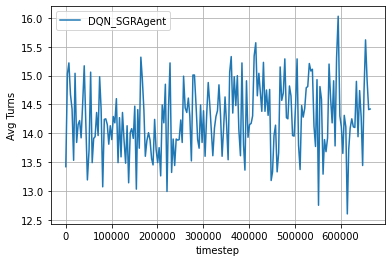

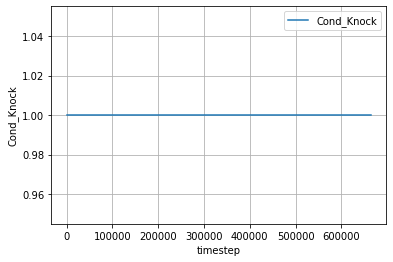

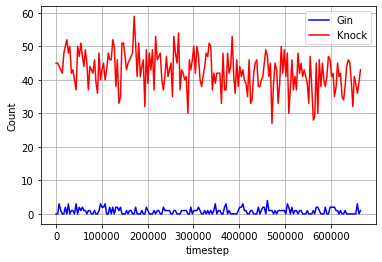

In [ ]:
# Save model prior to training
save_dir = 'models/dqn/{}/{}'.format(dir, dqn_model_name)
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
state_dict = agent.get_state_dict()
torch.save(state_dict, os.path.join(save_dir, 'model_pretrain.pth'))

max_reward_rand, max_reward_self, max_reward_sgr = -1, -1, -1
max_knock_rand, max_knock_self, max_knock_sgr = 0, 0, 0

# Training Loop
for episode in range(episode_num):

    # Generate data from the environment
    trajectories, _ = env.run(is_training=True)

    # Feed transitions into agent memory, and train the agent
    for ts in trajectories[0]:
        agent.feed(ts)

    # Evaluate the performance.
    if episode % evaluate_every == 0:
        print('\n----------------------------------------------------------------------\n')
        print('Random:')
        rewards, actions_rand = tournament3(random_env, evaluate_num)
        reward_rand = rewards[0]
        logger_rand.log_performance2(env.timestep, reward_rand, actions_rand)
        print('\nSelfplay:')
        rewards, actions_self = tournament3(selfplay_env, evaluate_num)
        reward_self = rewards[0]
        logger_self.log_performance2(env.timestep, reward_self, actions_self)
        print('\nSGRAgent:')
        rewards, actions_sgr = tournament3(SGRAgent_env, evaluate_num)
        reward_sgr = rewards[0]
        logger_sgr.log_performance2(env.timestep, reward_sgr, actions_sgr)
        
        # save best reward model for each environment
        if reward_rand > max_reward_rand:
            max_reward_rand = reward_rand
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand.pth'))

        if reward_self > max_reward_self:
            max_reward_self = reward_self
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self.pth'))

        if reward_sgr > max_reward_sgr:
            max_reward_sgr = reward_sgr
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr.pth'))
        
        # save best knock model for each environment
        Cond_Knock = actions_rand['Knock'] / actions_rand['Knock_Possible'] if actions_rand['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_rand:
            max_knock_rand = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_rand_knock.pth'))

        Cond_Knock = actions_self['Knock'] / actions_self['Knock_Possible'] if actions_self['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_self:
            max_knock_self = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_self_knock.pth'))

        Cond_Knock = actions_sgr['Knock'] / actions_sgr['Knock_Possible'] if actions_sgr['Knock_Possible'] > 0  else 0
        if Cond_Knock > max_knock_sgr:
            max_knock_sgr = Cond_Knock
            state_dict = agent.get_state_dict() 
            torch.save(state_dict, os.path.join(save_dir, 'model_sgr_knock.pth'))

# Close files in the logger
logger_rand.close_files()
logger_self.close_files()
logger_sgr.close_files()

# Plot the learning curve
logger_rand.plot2('DQN_Random')
logger_self.plot2('DQN_Selfplay')
logger_sgr.plot2('DQN_SGRAgent')

# Save model
state_dict = agent.get_state_dict() 
torch.save(state_dict, os.path.join(save_dir, 'model_posttrain.pth'))

clear_output()

#### Training Plots

In [ ]:
model_name = 'models/dqn/{}/{}/model_posttrain.pth'.format(dir, dqn_model_name)

In [ ]:
checkpoint = torch.load(model_name, map_location=device)

In [ ]:
agent.load(checkpoint)

###### Random

In [ ]:
_, actions = tournament3(random_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 2, 'Knock': 95, 'Other': 3, 'Knock_Possible': 95, 'Avg Turns': 22.71}


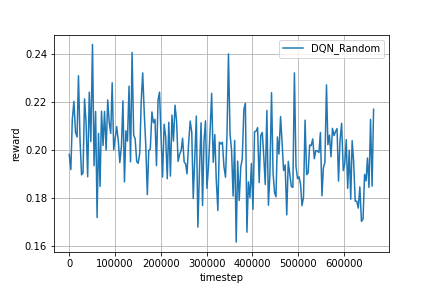

In [ ]:
Image(log_dir + '/rand_fig.png')

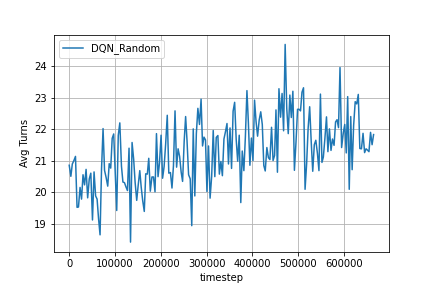

In [ ]:
Image(log_dir + '/rand_fig2.png')

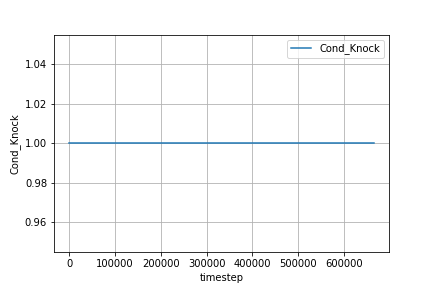

In [ ]:
Image(log_dir + '/rand_fig3.png')

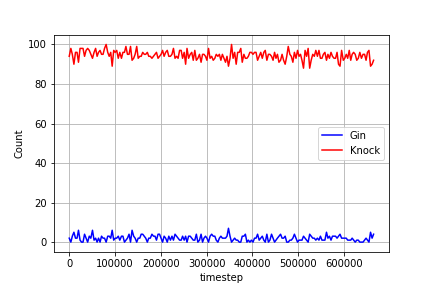

In [ ]:
Image(log_dir + '/rand_fig4.png')

###### Selfplay

In [ ]:
_, actions = tournament3(selfplay_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 40, 'Other': 60, 'Knock_Possible': 40, 'Avg Turns': 16.0}


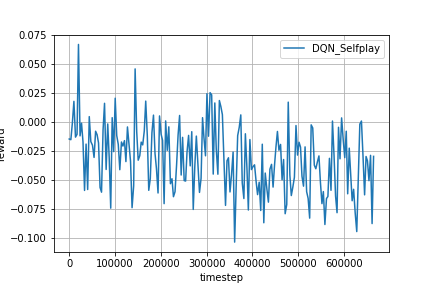

In [ ]:
Image(log_dir + '/self_fig.png')

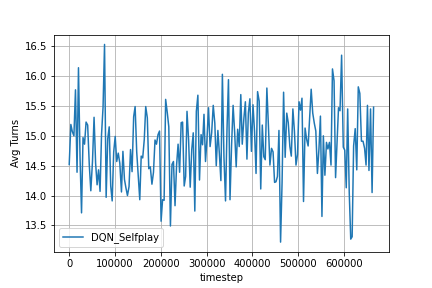

In [ ]:
Image(log_dir + '/self_fig2.png')

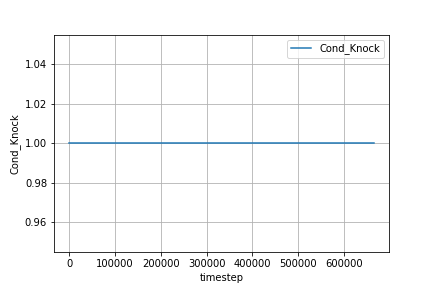

In [ ]:
Image(log_dir + '/self_fig3.png')

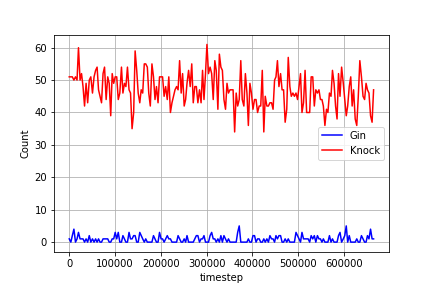

In [ ]:
Image(log_dir + '/self_fig4.png')

###### SGRAgent

In [ ]:
_, actions = tournament3(SGRAgent_env, evaluate_num)
clear_output()
print(actions)

{'Gin': 0, 'Knock': 37, 'Other': 63, 'Knock_Possible': 37, 'Avg Turns': 15.06}


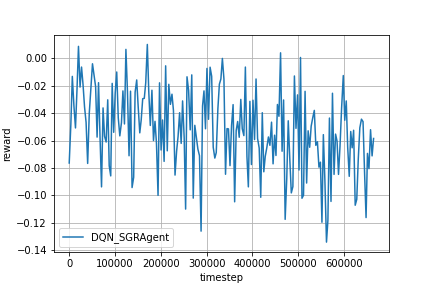

In [ ]:
Image(log_dir + '/sgr_fig.png')

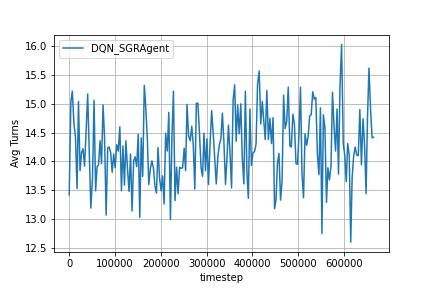

In [ ]:
Image(log_dir + '/sgr_fig2.png')

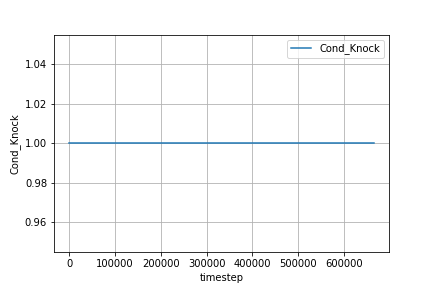

In [ ]:
Image(log_dir + '/sgr_fig3.png')

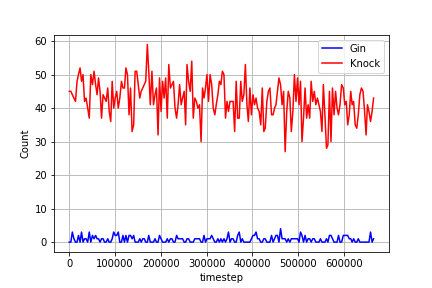

In [ ]:
Image(log_dir + '/sgr_fig4.png')